In [274]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [275]:
disease = pd.read_csv('inf_dis.csv')

In [276]:
adj_dis = disease[['Year','County','Disease','Sex','Count','Population']]

In [277]:
dis_tot = adj_dis[adj_dis.Sex=='Total']

In [278]:
dis_prep = dis_tot.drop('Sex',axis=1)

In [279]:
dcn = dis_prep[dis_prep.County != 'California']

In [280]:
# changed dis_prep to dcn
indicmat = (pd.pivot_table(dcn, index = ['Year', 'County'], 
            columns = 'Disease', 
            values = 'Count')
            .fillna(0)
            .reset_index())

c = indicmat.drop(index=5)
c1 = c.iloc[:,2:]
c3 = c.sort_values(['County','Year'])
c4 = c3.set_index(['County','Year'])
c4.sort_index(inplace=True)
zonemat= c4.drop(['Anthrax', 'Domoic Acid Poisoning'],axis=1)

# disease profile indexed by county, year 

In [281]:
c6 = zonemat.corr().fillna(0)
# corr matrix, diseases by diseases
# how did .corr() do that? 

In [283]:
import scipy 
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import fcluster
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist

from pylab import rcParams
import seaborn as sns

import sklearn
from sklearn.cluster import AgglomerativeClustering
import sklearn.metrics as sm

In [284]:
Z=linkage(c6,'ward')
#dendrogram(Z)

In [285]:
# elbow method 

In [286]:
from scipy.cluster.hierarchy import ward, fcluster
from scipy.spatial.distance import pdist
from scipy.sparse import csr_matrix

clus_labs = fcluster(Z, 4, criterion='distance')

In [287]:
dis1 = c6.iloc[clus_labs==1,:].index

In [288]:
dis2 = c6.iloc[clus_labs==2,:].index

In [289]:
dis3 = c6.iloc[clus_labs==3,:].index

In [290]:
dcn['DClus_ID'] = 0
#dclus = dcn.insert(5, 'Norm_ClProp', 0) // if rerun from the top, gives error, already exists
dcn.sort_values('Population',ascending=False)
dclus = dcn
dclus

C:\Users\aufst\OneDrive\Music\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,Year,County,Disease,Count,Population,DClus_ID
0,2005,Solano,Amebiasis,0,410570,0
5,2006,Napa,Amebiasis,2,131920,0
6,2011,Mariposa,Amebiasis,0,18237,0
10,2013,Ventura,Amebiasis,7,842639,0
11,2004,Sierra,Amebiasis,0,3467,0
13,2009,Madera,Amebiasis,0,150151,0
14,2008,Santa Barbara,Amebiasis,6,419970,0
17,2003,Sonoma,Amebiasis,3,468257,0
20,2005,Kings,Amebiasis,1,144601,0
21,2009,Tehama,Amebiasis,0,63122,0


In [291]:
for idx, re in dclus.iterrows():
    if re.Disease in dis1:
        dclus.at[idx, 'DClus_ID'] = 1
    elif re.Disease in dis2:
        dclus.at[idx, 'DClus_ID'] = 2
    elif re.Disease in dis3:
        dclus.at[idx, 'DClus_ID'] = 3
    else:
        dclus.at[idx, 'DClus_ID'] = 999

In [292]:
dclus.sort_values(['Year','County'],inplace=True)

C:\Users\aufst\OneDrive\Music\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [293]:
drpop = dclus[dclus.DClus_ID ==1].drop('Population',axis=1)
clus1 = drpop.groupby(['County','DClus_ID']).Count.agg(['sum','mean'])
clus1 = clus1.sort_values('mean',ascending=False)
clus1.head(10)
# aggregated by county, cluster id == 1, time series lost 

,,sum,mean
County,DClus_ID,,
Kern,1,19795,67.101695
Fresno,1,5297,17.955932
Los Angeles,1,3805,12.898305
Kings,1,2301,7.800000
Tulare,1,2204,7.471186
San Diego,1,1484,5.030508
San Luis Obispo,1,1339,4.538983
Orange,1,929,3.149153
Riverside,1,810,2.745763


In [294]:
clus1 = clus1.rename({'sum': 'CtSum', 'mean': 'CtMean'}, axis='columns')

In [295]:
drpop2 = dclus[dclus.DClus_ID ==2].drop('Population',axis=1)
clus2 = drpop2.groupby(['County','DClus_ID']).Count.agg(['sum','mean'])
clus2 = clus2.sort_values('mean',ascending=False)

In [296]:
clus2 = clus2.rename({'sum': 'CtSum', 'mean': 'CtMean'}, axis='columns')

In [297]:
drpop3 = dclus[dclus.DClus_ID ==3].drop('Population',axis=1)
clus3 = drpop3.groupby(['County','DClus_ID']).Count.agg(['sum','mean'])
clus3 = clus3.sort_values('mean',ascending=False)

In [298]:
clus3 = clus3.rename({'sum': 'CtSum', 'mean': 'CtMean'}, axis='columns')

In [299]:
cl2007 = zonemat.loc[(slice(None),2007),:]
cl2008 = zonemat.loc[(slice(None),2008),:]
cl2009 = zonemat.loc[(slice(None),2009),:]
cl2010 = zonemat.loc[(slice(None),2010),:]
cl2011 = zonemat.loc[(slice(None),2011),:]
cl2012 = zonemat.loc[(slice(None),2012),:]

cl2013 = zonemat.loc[(slice(None),2013),:]
cl2014 = zonemat.loc[(slice(None),2014),:]
cl2015 = zonemat.loc[(slice(None),2015),:]
# time series disease profiles 

In [300]:
# time series corr matrices 

corr2007 = cl2007.corr().fillna(0)
corr2008 = cl2008.corr().fillna(0)
corr2009 = cl2009.corr().fillna(0)
corr2010 = cl2010.corr().fillna(0)
corr2011 = cl2011.corr().fillna(0)
corr2012 = cl2012.corr().fillna(0)

corr2013 = cl2013.corr().fillna(0)
corr2014 = cl2014.corr().fillna(0)
corr2015 = cl2015.corr().fillna(0)

# subset dclus from above, rename dclus1,dclus2,dclus for the purpose 
# of this clustering task

L=linkage(corr2007,'ward')
M=linkage(corr2008,'ward')
N=linkage(corr2009,'ward')
O=linkage(corr2010,'ward')
P=linkage(corr2011,'ward')
Q=linkage(corr2012,'ward')

R=linkage(corr2013,'ward')
S=linkage(corr2014,'ward')
T=linkage(corr2015,'ward')
# linkage matrices for clustering

clabs2007 = fcluster(L, 4, criterion='distance')
clabs2008 = fcluster(M, 4, criterion='distance')
clabs2009 = fcluster(N, 4, criterion='distance')
clabs2010 = fcluster(O, 4, criterion='distance')
clabs2011 = fcluster(P, 4, criterion='distance')
clabs2012 = fcluster(Q, 4, criterion='distance')

clabs2013 = fcluster(R, 4, criterion='distance')
clabs2014 = fcluster(S, 4, criterion='distance')
clabs2015 = fcluster(T, 4, criterion='distance')
# cluster labels 

In [301]:
# dis1,dis2,di3, used as names for cluster objects on original
# corr matrix 
d1 = corr2013.iloc[clabs2013==1,:].index
d2 = corr2013.iloc[clabs2013==2,:].index
d3 = corr2013.iloc[clabs2013==3,:].index

In [302]:
e1 = corr2007.iloc[clabs2007==1,:].index
e2 = corr2007.iloc[clabs2007==2,:].index
e3 = corr2007.iloc[clabs2007==3,:].index

In [303]:
f1 = corr2008.iloc[clabs2008==1,:].index
f2 = corr2008.iloc[clabs2008==2,:].index
f3 = corr2008.iloc[clabs2008==3,:].index

In [304]:
g1 = corr2009.iloc[clabs2009==1,:].index
g2 = corr2009.iloc[clabs2009==2,:].index
g3 = corr2009.iloc[clabs2009==3,:].index

In [305]:
h1 = corr2010.iloc[clabs2010==1,:].index
h2 = corr2010.iloc[clabs2010==2,:].index

In [306]:
i1 = corr2011.iloc[clabs2011==1,:].index
i2 = corr2011.iloc[clabs2011==2,:].index
i3 = corr2011.iloc[clabs2011==3,:].index

In [307]:
j1 = corr2012.iloc[clabs2012==1,:].index
j2 = corr2012.iloc[clabs2012==2,:].index
j3 = corr2012.iloc[clabs2012==3,:].index

In [308]:
k1 = corr2014.iloc[clabs2014==1,:].index
k2 = corr2014.iloc[clabs2014==2,:].index
k3 = corr2014.iloc[clabs2014==3,:].index

In [309]:
l1 = corr2015.iloc[clabs2015==1,:].index
l2 = corr2015.iloc[clabs2015==2,:].index
l3 = corr2015.iloc[clabs2015==3,:].index

In [310]:
dcn07 = dcn[dcn['Year'] == 2007]
dcn07.insert(6, 'Norm_ClProp', 0)
dcn07.sort_values('Population',ascending=False)

dcn08 = dcn[dcn['Year'] == 2008]
dcn08.insert(6, 'Norm_ClProp', 0)
dcn08.sort_values('Population',ascending=False)

dcn09 = dcn[dcn['Year'] == 2009]
dcn09.insert(6, 'Norm_ClProp', 0)
dcn09.sort_values('Population',ascending=False)

dcn10 = dcn[dcn['Year'] == 2010]
dcn10.insert(6, 'Norm_ClProp', 0)
dcn10.sort_values('Population',ascending=False)

dcn11 = dcn[dcn['Year'] == 2011]
dcn11.insert(6, 'Norm_ClProp', 0)
dcn11.sort_values('Population',ascending=False)

dcn12 = dcn[dcn['Year'] == 2012]
dcn12.insert(6, 'Norm_ClProp', 0)
dcn12.sort_values('Population',ascending=False)

dcn13 = dcn[dcn['Year'] == 2013]
dcn13.insert(6, 'Norm_ClProp', 0)
dcn13.sort_values('Population',ascending=False)

dcn14 = dcn[dcn['Year'] == 2014]
dcn14.insert(6, 'Norm_ClProp', 0)
dcn14.sort_values('Population',ascending=False)

dcn15 = dcn[dcn['Year'] == 2015]
dcn15.insert(6, 'Norm_ClProp', 0)

In [311]:
for idx, re in dcn13.iterrows():
    if re.Disease in d1:
        dcn13.at[idx, 'DClus_ID'] = 1
    elif re.Disease in d2:
        dcn13.at[idx, 'DClus_ID'] = 2
    elif re.Disease in d3:
        dcn13.at[idx, 'DClus_ID'] = 3
    else:
        dcn13.at[idx, 'DClus_ID'] = 999

In [312]:
for idx, re in dcn07.iterrows():
    if re.Disease in e1:
        dcn07.at[idx, 'DClus_ID'] = 1
    elif re.Disease in e2:
        dcn07.at[idx, 'DClus_ID'] = 2
    elif re.Disease in e3:
        dcn07.at[idx, 'DClus_ID'] = 3
    else:
        dcn07.at[idx, 'DClus_ID'] = 999

In [313]:
for idx, re in dcn08.iterrows():
    if re.Disease in f1:
        dcn08.at[idx, 'DClus_ID'] = 1
    elif re.Disease in f2:
        dcn08.at[idx, 'DClus_ID'] = 2
    elif re.Disease in f3:
        dcn08.at[idx, 'DClus_ID'] = 3
    else:
        dcn08.at[idx, 'DClus_ID'] = 999

In [314]:
for idx, re in dcn09.iterrows():
    if re.Disease in g1:
        dcn09.at[idx, 'DClus_ID'] = 1
    elif re.Disease in g2:
        dcn09.at[idx, 'DClus_ID'] = 2
    elif re.Disease in g3:
        dcn09.at[idx, 'DClus_ID'] = 3
    else:
        dcn09.at[idx, 'DClus_ID'] = 999

In [315]:
for idx, re in dcn10.iterrows():
    if re.Disease in h1:
        dcn10.at[idx, 'DClus_ID'] = 1
    elif re.Disease in h2:
        dcn10.at[idx, 'DClus_ID'] = 2
    else:
        dcn10.at[idx, 'DClus_ID'] = 999

In [316]:
for idx, re in dcn11.iterrows():
    if re.Disease in i1:
        dcn11.at[idx, 'DClus_ID'] = 1
    elif re.Disease in i2:
        dcn11.at[idx, 'DClus_ID'] = 2
    elif re.Disease in i3:
        dcn11.at[idx, 'DClus_ID'] = 3
    else:
        dcn11.at[idx, 'DClus_ID'] = 999

In [317]:
for idx, re in dcn12.iterrows():
    if re.Disease in j1:
        dcn12.at[idx, 'DClus_ID'] = 1
    elif re.Disease in j2:
        dcn12.at[idx, 'DClus_ID'] = 2
    elif re.Disease in j3:
        dcn12.at[idx, 'DClus_ID'] = 3
    else:
        dcn12.at[idx, 'DClus_ID'] = 999

In [318]:
for idx, re in dcn14.iterrows():
    if re.Disease in k1:
        dcn13.at[idx, 'DClus_ID'] = 1
    elif re.Disease in k2:
        dcn13.at[idx, 'DClus_ID'] = 2
    else:
        dcn13.at[idx, 'DClus_ID'] = 999

C:\Users\aufst\OneDrive\Music\lib\site-packages\pandas\core\frame.py:2823: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.loc[index, col] = value


In [319]:
for idx, re in dcn15.iterrows():
    if re.Disease in l1:
        dcn15.at[idx, 'DClus_ID'] = 1
    elif re.Disease in l2:
        dcn15.at[idx, 'DClus_ID'] = 2
    elif re.Disease in l3:
        dcn15.at[idx, 'DClus_ID'] = 3
    else:
        dcn15.at[idx, 'DClus_ID'] = 999

In [320]:
dcn07 = dcn07[dcn07.Disease!='Domoic Acid Poisoning']
dcn07 = dcn07[dcn07.Disease!='Anthrax']
dcn08 = dcn08[dcn08.Disease!='Domoic Acid Poisoning']
dcn08 = dcn08[dcn08.Disease!='Anthrax']
dcn09 = dcn09[dcn09.Disease!='Domoic Acid Poisoning']
dcn09 = dcn09[dcn09.Disease!='Anthrax']
dcn10 = dcn10[dcn10.Disease!='Domoic Acid Poisoning']
dcn10 = dcn10[dcn10.Disease!='Anthrax']
dcn11 = dcn11[dcn11.Disease!='Domoic Acid Poisoning']
dcn11 = dcn11[dcn11.Disease!='Anthrax']

dcn12 = dcn12[dcn12.Disease!='Domoic Acid Poisoning']
dcn12 = dcn12[dcn12.Disease!='Anthrax']

dcn13 = dcn13[dcn13.Disease!='Domoic Acid Poisoning']
dcn13 = dcn13[dcn13.Disease!='Anthrax']

dcn14 = dcn14[dcn14.Disease!='Domoic Acid Poisoning']
dcn14 = dcn14[dcn14.Disease!='Anthrax']

dcn15 = dcn15[dcn15.Disease!='Domoic Acid Poisoning']
dcn15 = dcn15[dcn15.Disease!='Anthrax']

Prep for Merge

In [321]:
disease['County'] = disease['County'].str.strip(' ')

In [322]:
gdp = pd.read_excel('gdp.xlsx',sheet_name='Real GDP')

In [323]:
gdp.rename(columns={"Unnamed: 0":"FIPS", "Unnamed: 1":"County", 
                    "Unnamed: 2":"Postal", "Unnamed: 3":"LineCode", 
                    "Unnamed: 4":"IndustryName", "Unnamed: 5":"2012", 
                    "Unnamed: 6":"2013","Unnamed: 7":"2014", 
                    "Unnamed: 8":"2015"}, inplace=True)

In [324]:
gdp1 = gdp.loc[3:,:]

In [325]:
pi1 = pd.read_csv('pi1.csv')
pi2 = pd.read_csv('pi2.csv')
pi3 = pd.read_csv('pi3.csv')
pi4 = pd.read_csv('pi4.csv')
pi5 = pd.read_csv('pi5.csv')
pi6 = pd.read_csv('pi6.csv')
pi7 = pd.read_csv('pi7.csv')
pi8 = pd.read_csv('pi8.csv')

In [326]:
pii1 = pi1.loc[2:,:]
pii1.rename(columns={"County":"GeoFips", "Unnamed: 1":"County", 
                     "Unnamed: 2":"LineCode", "Unnamed: 3":"Description", 
                     "Unnamed: 4":"2001", "Unnamed: 5":"2002"}, inplace=True)

C:\Users\aufst\OneDrive\Music\lib\site-packages\pandas\core\frame.py:4025: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  return super(DataFrame, self).rename(**kwargs)


In [327]:
pii1 = pii1.dropna()
pii1['Description'] = pii1['Description'].str.lstrip()

In [328]:
pii2 = pi2.loc[2:,:]
pii2.rename(columns={"County":"GeoFips", "Unnamed: 1":"County", "Unnamed: 2":"LineCode", "Unnamed: 3":"Description", "Unnamed: 4":"2003", "Unnamed: 5":"2004"}, inplace=True)
pii3 = pi3.loc[2:,:]
pii3.rename(columns={"County":"GeoFips", "Unnamed: 1":"County", "Unnamed: 2":"LineCode", "Unnamed: 3":"Description", "Unnamed: 4":"2005", "Unnamed: 5":"2006"}, inplace=True)
pii4 = pi4.loc[2:,:]
pii4.rename(columns={"County":"GeoFips", "Unnamed: 1":"County", "Unnamed: 2":"LineCode", "Unnamed: 3":"Description", "Unnamed: 4":"2007", "Unnamed: 5":"2008"}, inplace=True)
pii5 = pi5.loc[2:,:]
pii5.rename(columns={"County":"GeoFips", "Unnamed: 1":"County", "Unnamed: 2":"LineCode", "Unnamed: 3":"Description", "Unnamed: 4":"2009", "Unnamed: 5":"2010"}, inplace=True)
pii6 = pi6.loc[2:,:]
pii6.rename(columns={"County":"GeoFips", "Unnamed: 1":"County", "Unnamed: 2":"LineCode", "Unnamed: 3":"Description", "Unnamed: 4":"2011", "Unnamed: 5":"2012"}, inplace=True)
pii7 = pi7.loc[2:,:]
pii7.rename(columns={"County":"GeoFips", "Unnamed: 1":"County", "Unnamed: 2":"LineCode", "Unnamed: 3":"Description", "Unnamed: 4":"2013", "Unnamed: 5":"2014"}, inplace=True)
pii8 = pi8.loc[2:,:]
pii8.rename(columns={"County":"GeoFips", "Unnamed: 1":"County", "Unnamed: 2":"LineCode", "Unnamed: 3":"Description", "Unnamed: 4":"2015", "Unnamed: 5":"2016"}, inplace=True)

In [329]:
pii2 = pii2.dropna()
pii2['Description'] = pii2['Description'].str.lstrip()
pii3 = pii3.dropna()
pii3['Description'] = pii3['Description'].str.lstrip()
pii4 = pii4.dropna()
pii4['Description'] = pii4['Description'].str.lstrip()
pii5 = pii5.dropna()
pii5['Description'] = pii5['Description'].str.lstrip()
pii6 = pii6.dropna()
pii6['Description'] = pii6['Description'].str.lstrip()
pii7 = pii7.dropna()
pii7['Description'] = pii7['Description'].str.lstrip()
pii8 = pii8.dropna()
pii8['Description'] = pii8['Description'].str.lstrip()

In [330]:
piii1 = pii1[pii1['LineCode']=='10'].drop('Description',axis=1)

In [331]:
piii2 = pii2[pii2['LineCode']=='10'].drop('Description',axis=1)
piii3 = pii3[pii3['LineCode']=='10'].drop('Description',axis=1)
piii4 = pii4[pii4['LineCode']=='10'].drop('Description',axis=1)
piii5 = pii5[pii5['LineCode']=='10'].drop('Description',axis=1)
piii6 = pii6[pii6['LineCode']=='10'].drop('Description',axis=1)
piii7 = pii7[pii7['LineCode']=='10'].drop('Description',axis=1)
piii8 = pii8[pii8['LineCode']=='10'].drop('Description',axis=1)

In [332]:
pip1 = piii1.drop('LineCode',axis=1)
pip2 = piii2.drop('LineCode',axis=1)
pip3 = piii3.drop('LineCode',axis=1)
pip4 = piii4.drop('LineCode',axis=1)
pip5 = piii5.drop('LineCode',axis=1)
pip6 = piii6.drop('LineCode',axis=1)
pip7 = piii7.drop('LineCode',axis=1)
pip8 = piii8.drop('LineCode',axis=1)

In [333]:
pipp1 = pip1.drop('GeoFips',axis=1)
pipp2 = pip2.drop('GeoFips',axis=1)
pipp3 = pip3.drop('GeoFips',axis=1)
pipp4 = pip4.drop('GeoFips',axis=1)
pipp5 = pip5.drop('GeoFips',axis=1)
pipp6 = pip6.drop('GeoFips',axis=1)
pipp7 = pip7.drop('GeoFips',axis=1)
pipp8 = pip8.drop('GeoFips',axis=1)

In [334]:
new = pipp1['County'].str.split(',', n=1, expand=True)
pipp1['County'] = new[0]
pipp1['State'] = new[1]

In [335]:
new2 = pipp2['County'].str.split(',', n=1, expand=True)
pipp2['County'] = new2[0]
pipp2['State'] = new2[1]

new3 = pipp3['County'].str.split(',', n=1, expand=True)
pipp3['County'] = new3[0]
pipp3['State'] = new3[1]

new4 = pipp4['County'].str.split(',', n=1, expand=True)
pipp4['County'] = new4[0]
pipp4['State'] = new4[1]

new5 = pipp5['County'].str.split(',', n=1, expand=True)
pipp5['County'] = new5[0]
pipp5['State'] = new5[1]

new6 = pipp6['County'].str.split(',', n=1, expand=True)
pipp6['County'] = new6[0]
pipp6['State'] = new6[1]

new7 = pipp7['County'].str.split(',', n=1, expand=True)
pipp7['County'] = new7[0]
pipp7['State'] = new7[1]

new8 = pipp8['County'].str.split(',', n=1, expand=True)
pipp8['County'] = new8[0]
pipp8['State'] = new8[1]

In [336]:
ip1 = pipp1[pipp1.State==' CA']
ip2 = pipp2[pipp2.State==' CA']
ip3 = pipp3[pipp3.State==' CA']
ip4 = pipp4[pipp4.State==' CA']
ip5 = pipp5[pipp5.State==' CA']
ip6 = pipp6[pipp6.State==' CA']
ip7 = pipp7[pipp7.State==' CA']
ip8 = pipp8[pipp8.State==' CA']

In [337]:
ipp1 = ip1.drop('State',axis=1)
ipp2 = ip2.drop('State',axis=1)
ipp3 = ip3.drop('State',axis=1)
ipp4 = ip4.drop('State',axis=1)
ipp5 = ip5.drop('State',axis=1)
ipp6 = ip6.drop('State',axis=1)
ipp7 = ip7.drop('State',axis=1)
ipp8 = ip8.drop('State',axis=1)

In [338]:
pim = pd.merge(ipp1,ipp2,on='County')

In [339]:
pim2 = pd.merge(pim,ipp3,how='left', on='County')
pim3 = pd.merge(pim2,ipp4,how='left', on='County')
pim4 = pd.merge(pim3,ipp5,how='left', on='County')
pim5 = pd.merge(pim4,ipp6,how='left', on='County')
pim6 = pd.merge(pim5,ipp7,how='left', on='County')
pim7 = pd.merge(pim6,ipp8,how='left', on='County')
pim7.head()

,County,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Alameda,57937010,57428282,58602235,60674155,62902099,67751723,70450120,72298889,69426673,72821639,78521460,83005645,87659801,95056828,104464523,111354955
1,Alpine,41395,42630,44357,42594,42330,42920,45802,46336,47295,49662,62358,66728,67205,73553,76225,78759
2,Amador,956884,1010686,1063008,1131812,1155794,1230694,1289844,1309924,1272579,1301768,1333900,1352484,1381381,1461506,1549948,1600953
3,Butte,5167986,5315013,5576133,5950239,6170006,6553340,6859094,7034312,7047335,7307770,7574070,7784914,8133014,8492494,9152079,9498336
4,Calaveras,1167747,1228271,1319394,1397555,1458892,1561842,1648560,1685096,1645864,1670057,1724819,1705017,1729741,1846586,1983198,2064459


In [340]:
pincM = pd.melt(pim7,id_vars='County', var_name='Year', 
                value_name='Personal_Income')
pincM.head()

,County,Year,Personal_Income
0,Alameda,2001,57937010
1,Alpine,2001,41395
2,Amador,2001,956884
3,Butte,2001,5167986
4,Calaveras,2001,1167747


In [341]:
# failed experiment 
# assuming all time series cluster labels contained the same set of 
# diseases 

# clusss = [dcn07, dcn08, dcn09,dcn10,dcn11,dcn12,dcn13,dcn14,dcn15]
# concattt = pd.concat(clusss)

In [342]:
gdp_l = gdp1[gdp1['LineCode']==1]
gdp_l.drop(['FIPS','LineCode','IndustryName'],axis=1,inplace=True)

C:\Users\aufst\OneDrive\Music\lib\site-packages\pandas\core\frame.py:3940: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


In [343]:
gdp_last = pd.melt(gdp_l,id_vars=['County','Postal'], var_name='Year', 
                   value_name='GDP')

In [344]:
gdp_last['County'] = gdp_last['County'].str.strip(' ')

In [345]:
gdp_last['Year'] = gdp_last['Year'].astype(int)

In [346]:
gdp_ca = gdp_last[gdp_last['Postal']=='CA']

In [347]:
gdpca = gdp_last.drop('Postal',axis=1)

In [348]:
grow = pd.read_excel('gdp.xlsx',sheet_name='Real GDP Growth')

In [349]:
grow.rename(columns={"Unnamed: 0":"FIPS", "Unnamed: 1":"County", 
                     "Unnamed: 2":"Postal", "Unnamed: 3":"LineCode", 
                     "Unnamed: 4":"IndustryName", "Unnamed: 5":"2013",
                     "Unnamed: 6":"2014", "Unnamed: 7":"2015"}, 
            inplace=True)

In [350]:
growth = grow.iloc[3:,:]

In [351]:
growth_l = growth[growth['LineCode']==1]
growth_l.drop(['FIPS','LineCode','IndustryName'],axis=1,inplace=True)

In [352]:
growth_ca = pd.melt(growth_l,id_vars=['County','Postal'],
                    var_name='Year',value_name='GDPgrowth')

In [353]:
groca = growth_ca[growth_ca['Postal']=='CA']

In [354]:
groca['County'] = groca['County'].str.strip(' ')

C:\Users\aufst\OneDrive\Music\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [355]:
groca['Year'] = groca['Year'].astype(int)

C:\Users\aufst\OneDrive\Music\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [356]:
growthca = groca.drop('Postal',axis=1)

In [357]:
unemp = pd.read_excel('unemployment.xls',
                      sheet_name='Unemployment Med HH Inc',
                      skiprows=range(0,7))

In [358]:
unemp.rename(columns={"Area_name":"County"}, inplace=True)

In [359]:
# unemp[unemp['County'].str.contains(',')].head()

In [360]:
# unemp[unemp['County'].str.contains('/')].head()

In [361]:
# unemp[unemp['County'].str.contains('County')].head()

In [362]:
unemp['County'] = unemp['County'].apply(lambda x:x.split(',')[0])

In [363]:
# unemp.iloc[:,:10].head()

In [364]:
unemp['County'] = unemp['County'].apply(lambda x:x.split('County')[0])

In [365]:
# unemp[unemp['State'] != 'PR'].head()

In [366]:
unemp['County'] = unemp['County'].apply(lambda x:x.split('/')[0])
unemp_l = unemp.loc[2:,:]

In [367]:
unemp2 = unemp_l.drop(['FIPStxt','Rural_urban_continuum_code_2013',
                       'Urban_influence_code_2013','Metro_2013',
                       'Civilian_labor_force_2007','Employed_2007',
                       'Unemployed_2007','Civilian_labor_force_2008',
                       'Employed_2008','Unemployed_2008',
                       'Civilian_labor_force_2009','Employed_2009',
                       'Unemployed_2009','Civilian_labor_force_2010',
                       'Employed_2010','Unemployed_2010',
                       'Civilian_labor_force_2010','Employed_2010',
                       'Unemployed_2010','Civilian_labor_force_2011',
                       'Employed_2011','Unemployed_2011',
                       'Civilian_labor_force_2012','Employed_2012',
                       'Unemployed_2012','Civilian_labor_force_2013',
                       'Employed_2013','Unemployed_2013',
                       'Civilian_labor_force_2014','Employed_2014',
                       'Unemployed_2014','Civilian_labor_force_2015',
                       'Employed_2015','Unemployed_2015',
                       'Civilian_labor_force_2016','Employed_2016',
                       'Unemployed_2016','Civilian_labor_force_2017',
                       'Employed_2017','Unemployed_2017'],axis=1)

In [368]:
unemp2.rename(columns={"State":"Postal"},inplace=True)

In [369]:
unemp2.drop(['Median_Household_Income_2017','Med_HH_Income_Percent_of_State_Total_2017'],axis=1).head()

,Postal,County,Unemployment_rate_2007,Unemployment_rate_2008,Unemployment_rate_2009,Unemployment_rate_2010,Unemployment_rate_2011,Unemployment_rate_2012,Unemployment_rate_2013,Unemployment_rate_2014,Unemployment_rate_2015,Unemployment_rate_2016,Unemployment_rate_2017
2,AL,Autauga,3.3,5.1,9.7,8.9,8.4,6.9,6.2,5.8,5.2,5.1,3.9
3,AL,Baldwin,3.1,4.6,9.8,10.0,9.0,7.5,6.6,6.1,5.5,5.4,4.0
4,AL,Barbour,6.3,8.8,14.3,12.3,11.5,11.5,10.2,10.5,8.9,8.4,5.9
5,AL,Bibb,4.1,5.8,13.3,11.4,10.5,8.5,7.9,7.2,6.6,6.5,4.4
6,AL,Blount,3.2,4.7,10.0,9.8,8.7,6.9,6.3,6.1,5.4,5.4,4.0


In [370]:
unemp_ca = unemp2[unemp2['Postal'] == 'CA'].iloc[1:,:]

In [371]:
unempca = pd.melt(unemp_ca,id_vars=['County','Postal'],var_name='Year',value_name='UnemploymentRate')

In [372]:
unempca['Year'] = unempca['Year'].str.strip().str[-4:]

In [373]:
unempca['County'] = unempca['County'].str.strip(' ')

Merge

In [374]:
gg = pd.merge(gdp_ca,groca,on=['County','Year','Postal'])

In [375]:
unempca['Year'] = unempca['Year'].astype(int)

In [376]:
gg['County'] = gg['County'].str.strip(' ')

In [377]:
unempca['County'] = unempca['County'].str.strip(' ')

In [378]:
unempca[unempca['Postal']=='CA'].head()

,County,Postal,Year,UnemploymentRate
0,Alameda,CA,2007,4.7
1,Alpine,CA,2007,7.9
2,Amador,CA,2007,5.8
3,Butte,CA,2007,6.7
4,Calaveras,CA,2007,6.4


In [379]:
ggu = pd.merge(gg,unempca, how='left', on=['Year','Postal','County'])

In [380]:
pincM['Year'] = pincM['Year'].astype(int)

Merge with Personal Income

In [381]:
nerve = pd.merge(pincM,unempca,how='left',on=['County','Year']).dropna()

In [382]:
nerv = nerve.drop('Postal',axis=1)

In [383]:
# dcn has no clustering but may have null cluster column 
nerva = pd.merge(dcn,nerv, how='left', on=['Year','County']).dropna()
nerva1 = nerva.drop('DClus_ID',axis=1)
nerva2 = nerva1[nerva1.Disease != 'Anthrax']
nerva3 = nerva2[nerva2.Disease != 'Domoic Acid Poisoning']
nerva3.head()

,Year,County,Disease,Count,Population,Personal_Income,UnemploymentRate
16414,2007,Alameda,Amebiasis,9,1476401,70450120,4.7
16415,2007,Alameda,Anaplasmosis and Ehrlichiosis,0,1476401,70450120,4.7
16417,2007,Alameda,Babesiosis,0,1476401,70450120,4.7
16418,2007,Alameda,"Botulism, Foodborne",0,1476401,70450120,4.7
16419,2007,Alameda,"Botulism, Other",0,1476401,70450120,4.7


In [384]:
# each time step has different clustering,
# would have to assume they're the same 
clusss = [dcn07, dcn08, dcn09,dcn10,dcn11,dcn12,dcn13,dcn14,dcn15]
concattt = pd.concat(clusss)
ult_ts = pd.merge(nerva3,concattt,how='left', on=['Year','County','Disease','Count','Population']).dropna()
ult_ts.head()
#uts = ult_ts.sort_values(['Year','County'])
#cluts1 = uts[uts.DClus_ID == 1]

# nerva3 is a good df
# ult_ts is dubious bc concattt is dubious,
# would have to take extra extra time to go back and check
# labels, value but time consuming 

,Year,County,Disease,Count,Population,Personal_Income,UnemploymentRate,DClus_ID,Norm_ClProp
0,2007,Alameda,Amebiasis,9,1476401,70450120,4.7,3.0,0.0
1,2007,Alameda,Anaplasmosis and Ehrlichiosis,0,1476401,70450120,4.7,1.0,0.0
2,2007,Alameda,Babesiosis,0,1476401,70450120,4.7,2.0,0.0
3,2007,Alameda,"Botulism, Foodborne",0,1476401,70450120,4.7,2.0,0.0
4,2007,Alameda,"Botulism, Other",0,1476401,70450120,4.7,1.0,0.0


**Imporant** Time Series 

In [385]:
ts07 = pd.merge(nerva3,dcn07,how='left', on=['Year','County','Disease','Count','Population']).dropna()
ts08 = pd.merge(nerva3,dcn08,how='left', on=['Year','County','Disease','Count','Population']).dropna()
ts09 = pd.merge(nerva3,dcn09,how='left', on=['Year','County','Disease','Count','Population']).dropna()
ts10 = pd.merge(nerva3,dcn10,how='left', on=['Year','County','Disease','Count','Population']).dropna()
ts11 = pd.merge(nerva3,dcn11,how='left', on=['Year','County','Disease','Count','Population']).dropna()
ts12 = pd.merge(nerva3,dcn12,how='left', on=['Year','County','Disease','Count','Population']).dropna()

ts13 = pd.merge(nerva3,dcn13,how='left', on=['Year','County','Disease','Count','Population']).dropna()
ts14 = pd.merge(nerva3,dcn14,how='left', on=['Year','County','Disease','Count','Population']).dropna()
ts15 = pd.merge(nerva3,dcn15,how='left', on=['Year','County','Disease','Count','Population']).dropna()

Subsetting Instructions

In [386]:
# subset by county, then by cluster 

In [387]:
ala07 = ts07[ts07.County =='Alameda']
alp07 = ts07[ts07.County == 'Alpine']
ama07 = ts07[ts07.County == 'Amador']
butt07 = ts07[ts07.County =='Butte']
cala07 = ts07[ts07.County == 'Calaveras']
col07 = ts07[ts07.County =='Colusa']
cost07 = ts07[ts07.County == 'Contra Costa']
deln07 = ts07[ts07.County == 'Del Norte']
eld07 = ts07[ts07.County =='El Dorado']
fres07 = ts07[ts07.County == 'Fresno']
glen07 = ts07[ts07.County =='Glenn']
hum07 = ts07[ts07.County == 'Humboldt']
imp07 = ts07[ts07.County == 'Imperial']
iny07 = ts07[ts07.County =='Inyo']
kern07 = ts07[ts07.County == 'Kern']
kin07 = ts07[ts07.County =='Kings']
lake07 = ts07[ts07.County == 'Lake']
lass07 = ts07[ts07.County == 'Lassen']

la07 = ts07[ts07.County == 'Los Angeles']

mad07 = ts07[ts07.County =='Madera']
mar07 = ts07[ts07.County == 'Marin']
marip07 = ts07[ts07.County =='Mariposa']
mendo07 = ts07[ts07.County == 'Mendocino']
merc07 = ts07[ts07.County == 'Merced']
modo07 = ts07[ts07.County =='Modoc']
mono07 = ts07[ts07.County == 'Mono']
monte07 = ts07[ts07.County =='Monterey']
napa07 = ts07[ts07.County == 'Napa']
neva07 = ts07[ts07.County == 'Nevada']
oran07 = ts07[ts07.County =='Orange']
plac07 = ts07[ts07.County == 'Placer']
plum07 = ts07[ts07.County =='Plumas']
riv07 = ts07[ts07.County == 'Riverside']
sac07 = ts07[ts07.County == 'Sacramento']
sanben07 = ts07[ts07.County =='San Benito']
sanber07 = ts07[ts07.County == 'San Bernardino']
sandi07 = ts07[ts07.County =='San Diego']

sf07 = ts07[ts07.County =='San Francisco']

sanjo07 = ts07[ts07.County == 'San Joaquin']
sanlu07 = ts07[ts07.County =='San Luis Obispo']
sanmat07 = ts07[ts07.County == 'San Mateo']
santab07 = ts07[ts07.County == 'Santa Barbara']
santac07 = ts07[ts07.County == 'Santa Clara']
santaz07 = ts07[ts07.County =='Santa Cruz']
shast07 = ts07[ts07.County == 'Shasta']
sierra07 = ts07[ts07.County =='Sierra']
sisk07 = ts07[ts07.County == 'Siskiyou']
sol07 = ts07[ts07.County == 'Solano']
sonom07 = ts07[ts07.County =='Sonoma']
stanis07 = ts07[ts07.County == 'Stanislaus']
sutt07 = ts07[ts07.County =='Sutter']
teh07 = ts07[ts07.County == 'Tehama']
trin07 = ts07[ts07.County == 'Trinity']
tul07 = ts07[ts07.County =='Tulare']
tuol07 = ts07[ts07.County == 'Tuolumne']
vent07 = ts07[ts07.County =='Ventura']
yolo07 = ts07[ts07.County == 'Yolo']
yuba07 = ts07[ts07.County =='Yuba']

# 2008
ala08 = ts08[ts08.County =='Alameda']
alp08 = ts08[ts08.County == 'Alpine']
ama08 = ts08[ts08.County == 'Amador']
butt08 = ts08[ts08.County =='Butte']
cala08 = ts08[ts08.County == 'Calaveras']
col08 = ts08[ts08.County =='Colusa']
cost08 = ts08[ts08.County == 'Contra Costa']
deln08 = ts08[ts08.County == 'Del Norte']
eld08 = ts08[ts08.County =='El Dorado']
fres08 = ts08[ts08.County == 'Fresno']
glen08 = ts08[ts08.County =='Glenn']
hum08 = ts08[ts08.County == 'Humboldt']
imp08 = ts08[ts08.County == 'Imperial']
iny08 = ts08[ts08.County =='Inyo']
kern08 = ts08[ts08.County == 'Kern']
kin08 = ts08[ts08.County =='Kings']
lake08 = ts08[ts08.County == 'Lake']
lass08 = ts08[ts08.County == 'Lassen']

la08 = ts08[ts08.County == 'Los Angeles']

mad08 = ts08[ts08.County =='Madera']
mar08 = ts08[ts08.County == 'Marin']
marip08 = ts08[ts08.County =='Mariposa']
mendo08 = ts08[ts08.County == 'Mendocino']
merc08 = ts08[ts08.County == 'Merced']
modo08 = ts08[ts08.County =='Modoc']
mono08 = ts08[ts08.County == 'Mono']
monte08 = ts08[ts08.County =='Monterey']
napa08 = ts08[ts08.County == 'Napa']
neva08 = ts08[ts08.County == 'Nevada']
oran08 = ts08[ts08.County =='Orange']
plac08 = ts08[ts08.County == 'Placer']
plum08 = ts08[ts08.County =='Plumas']
riv08 = ts08[ts08.County == 'Riverside']
sac08 = ts08[ts08.County == 'Sacramento']
sanben08 = ts08[ts08.County =='San Benito']
sanber08 = ts08[ts08.County == 'San Bernardino']
sandi08 = ts08[ts08.County =='San Diego']

sf08 = ts08[ts08.County =='San Francisco']

sanjo08 = ts08[ts08.County == 'San Joaquin']
sanlu08 = ts08[ts08.County =='San Luis Obispo']
sanmat08 = ts08[ts08.County == 'San Mateo']
santab08 = ts08[ts08.County == 'Santa Barbara']
santac08 = ts08[ts08.County == 'Santa Clara']
santaz08 = ts08[ts08.County =='Santa Cruz']
shast08 = ts08[ts08.County == 'Shasta']
sierra08 = ts08[ts08.County =='Sierra']
sisk08 = ts08[ts08.County == 'Siskiyou']
sol08 = ts08[ts08.County == 'Solano']
sonom08 = ts08[ts08.County =='Sonoma']
stanis08 = ts08[ts08.County == 'Stanislaus']
sutt08 = ts08[ts08.County =='Sutter']
teh08 = ts08[ts08.County == 'Tehama']
trin08 = ts08[ts08.County == 'Trinity']
tul08 = ts08[ts08.County =='Tulare']
tuol08 = ts08[ts08.County == 'Tuolumne']
vent08 = ts08[ts08.County =='Ventura']
yolo08 = ts08[ts08.County == 'Yolo']
yuba08 = ts08[ts08.County =='Yuba']

# 2009 
ala09 = ts09[ts09.County =='Alameda']
alp09 = ts09[ts09.County == 'Alpine']
ama09 = ts09[ts09.County == 'Amador']
butt09 = ts09[ts09.County =='Butte']
cala09 = ts09[ts09.County == 'Calaveras']
col09 = ts09[ts09.County =='Colusa']
cost09 = ts09[ts09.County == 'Contra Costa']
deln09 = ts09[ts09.County == 'Del Norte']
eld09 = ts09[ts09.County =='El Dorado']
fres09 = ts09[ts09.County == 'Fresno']
glen09 = ts09[ts09.County =='Glenn']
hum09 = ts09[ts09.County == 'Humboldt']
imp09 = ts09[ts09.County == 'Imperial']
iny09 = ts09[ts09.County =='Inyo']
kern09 = ts09[ts09.County == 'Kern']
kin09 = ts09[ts09.County =='Kings']
lake09 = ts09[ts09.County == 'Lake']
lass09 = ts09[ts09.County == 'Lassen']

la09 = ts09[ts09.County == 'Los Angeles']

mad09 = ts09[ts09.County =='Madera']
mar09 = ts09[ts09.County == 'Marin']
marip09 = ts09[ts09.County =='Mariposa']
mendo09 = ts09[ts09.County == 'Mendocino']
merc09 = ts09[ts09.County == 'Merced']
modo09 = ts09[ts09.County =='Modoc']
mono09 = ts09[ts09.County == 'Mono']
monte09 = ts09[ts09.County =='Monterey']
napa09 = ts09[ts09.County == 'Napa']
neva09 = ts09[ts09.County == 'Nevada']
oran09 = ts09[ts09.County =='Orange']
plac09 = ts09[ts09.County == 'Placer']
plum09 = ts09[ts09.County =='Plumas']
riv09 = ts09[ts09.County == 'Riverside']
sac09 = ts09[ts09.County == 'Sacramento']
sanben09 = ts09[ts09.County =='San Benito']
sanber09 = ts09[ts09.County == 'San Bernardino']
sandi09 = ts09[ts09.County =='San Diego']

sf09 = ts09[ts09.County =='San Francisco']

sanjo09 = ts09[ts09.County == 'San Joaquin']
sanlu09 = ts09[ts09.County =='San Luis Obispo']
sanmat09 = ts09[ts09.County == 'San Mateo']
santab09 = ts09[ts09.County == 'Santa Barbara']
santac09 = ts09[ts09.County == 'Santa Clara']
santaz09 = ts09[ts09.County =='Santa Cruz']
shast09 = ts09[ts09.County == 'Shasta']
sierra09 = ts09[ts09.County =='Sierra']
sisk09 = ts09[ts09.County == 'Siskiyou']
sol09 = ts09[ts09.County == 'Solano']
sonom09 = ts09[ts09.County =='Sonoma']
stanis09 = ts09[ts09.County == 'Stanislaus']
sutt09 = ts09[ts09.County =='Sutter']
teh09 = ts09[ts09.County == 'Tehama']
trin09 = ts09[ts09.County == 'Trinity']
tul09 = ts09[ts09.County =='Tulare']
tuol09 = ts09[ts09.County == 'Tuolumne']
vent09 = ts09[ts09.County =='Ventura']
yolo09 = ts09[ts09.County == 'Yolo']
yuba09 = ts09[ts09.County =='Yuba']


# 2011
ala11 = ts11[ts11.County =='Alameda']
alp11 = ts11[ts11.County == 'Alpine']
ama11 = ts11[ts11.County == 'Amador']
butt11 = ts11[ts11.County =='Butte']
cala11 = ts11[ts11.County == 'Calaveras']
col11 = ts11[ts11.County =='Colusa']
cost11 = ts11[ts11.County == 'Contra Costa']
deln11 = ts11[ts11.County == 'Del Norte']
eld11 = ts11[ts11.County =='El Dorado']
fres11 = ts11[ts11.County == 'Fresno']
glen11 = ts11[ts11.County =='Glenn']
hum11 = ts11[ts11.County == 'Humboldt']
imp11 = ts11[ts11.County == 'Imperial']
iny11 = ts11[ts11.County =='Inyo']
kern11 = ts11[ts11.County == 'Kern']
kin11 = ts11[ts11.County =='Kings']
lake11 = ts11[ts11.County == 'Lake']
lass11 = ts11[ts11.County == 'Lassen']

la11 = ts11[ts11.County == 'Los Angeles']

mad11 = ts11[ts11.County =='Madera']
mar11 = ts11[ts11.County == 'Marin']
marip11 = ts11[ts11.County =='Mariposa']
mendo11 = ts11[ts11.County == 'Mendocino']
merc11 = ts11[ts11.County == 'Merced']
modo11 = ts11[ts11.County =='Modoc']
mono11 = ts11[ts11.County == 'Mono']
monte11 = ts11[ts11.County =='Monterey']
napa11 = ts11[ts11.County == 'Napa']
neva11 = ts11[ts11.County == 'Nevada']
oran11 = ts11[ts11.County =='Orange']
plac11 = ts11[ts11.County == 'Placer']
plum11 = ts11[ts11.County =='Plumas']
riv11 = ts11[ts11.County == 'Riverside']
sac11 = ts11[ts11.County == 'Sacramento']
sanben11 = ts11[ts11.County =='San Benito']
sanber11 = ts11[ts11.County == 'San Bernardino']
sandi11 = ts11[ts11.County =='San Diego']

sf11 = ts11[ts11.County =='San Francisco']

sanjo11 = ts11[ts11.County == 'San Joaquin']
sanlu11 = ts11[ts11.County =='San Luis Obispo']
sanmat11 = ts11[ts11.County == 'San Mateo']
santab11 = ts11[ts11.County == 'Santa Barbara']
santac11 = ts11[ts11.County == 'Santa Clara']
santaz11 = ts11[ts11.County =='Santa Cruz']
shast11 = ts11[ts11.County == 'Shasta']
sierra11 = ts11[ts11.County =='Sierra']
sisk11 = ts11[ts11.County == 'Siskiyou']
sol11 = ts11[ts11.County == 'Solano']
sonom11 = ts11[ts11.County =='Sonoma']
stanis11 = ts11[ts11.County == 'Stanislaus']
sutt11 = ts11[ts11.County =='Sutter']
teh11 = ts11[ts11.County == 'Tehama']
trin11 = ts11[ts11.County == 'Trinity']
tul11 = ts11[ts11.County =='Tulare']
tuol11 = ts11[ts11.County == 'Tuolumne']
vent11 = ts11[ts11.County =='Ventura']
yolo11 = ts11[ts11.County == 'Yolo']
yuba11 = ts11[ts11.County =='Yuba']

# 2010
ala10 = ts10[ts10.County =='Alameda']
alp10 = ts10[ts10.County == 'Alpine']
ama10 = ts10[ts10.County == 'Amador']
butt10 = ts10[ts10.County =='Butte']
cala10 = ts10[ts10.County == 'Calaveras']
col10 = ts10[ts10.County =='Colusa']
cost10 = ts10[ts10.County == 'Contra Costa']
deln10 = ts10[ts10.County == 'Del Norte']
eld10 = ts10[ts10.County =='El Dorado']
fres10 = ts10[ts10.County == 'Fresno']
glen10 = ts10[ts10.County =='Glenn']
hum10 = ts10[ts10.County == 'Humboldt']
imp10 = ts10[ts10.County == 'Imperial']
iny10 = ts10[ts10.County =='Inyo']
kern10 = ts10[ts10.County == 'Kern']
kin10 = ts10[ts10.County =='Kings']
lake10 = ts10[ts10.County == 'Lake']
lass10 = ts10[ts10.County == 'Lassen']

la10 = ts10[ts10.County == 'Los Angeles']

mad10 = ts10[ts10.County =='Madera']
mar10 = ts10[ts10.County == 'Marin']
marip10 = ts10[ts10.County =='Mariposa']
mendo10 = ts10[ts10.County == 'Mendocino']
merc10 = ts10[ts10.County == 'Merced']
modo10 = ts10[ts10.County =='Modoc']
mono10 = ts10[ts10.County == 'Mono']
monte10 = ts10[ts10.County =='Monterey']
napa10 = ts10[ts10.County == 'Napa']
neva10 = ts10[ts10.County == 'Nevada']
oran10 = ts10[ts10.County =='Orange']
plac10 = ts10[ts10.County == 'Placer']
plum10 = ts10[ts10.County =='Plumas']
riv10 = ts10[ts10.County == 'Riverside']
sac10 = ts10[ts10.County == 'Sacramento']
sanben10 = ts10[ts10.County =='San Benito']
sanber10 = ts10[ts10.County == 'San Bernardino']
sandi10 = ts10[ts10.County =='San Diego']

sf10 = ts10[ts10.County =='San Francisco']

sanjo10 = ts10[ts10.County == 'San Joaquin']
sanlu10 = ts10[ts10.County =='San Luis Obispo']
sanmat10 = ts10[ts10.County == 'San Mateo']
santab10 = ts10[ts10.County == 'Santa Barbara']
santac10 = ts10[ts10.County == 'Santa Clara']
santaz10 = ts10[ts10.County =='Santa Cruz']
shast10 = ts10[ts10.County == 'Shasta']
sierra10 = ts10[ts10.County =='Sierra']
sisk10 = ts10[ts10.County == 'Siskiyou']
sol10 = ts10[ts10.County == 'Solano']
sonom10 = ts10[ts10.County =='Sonoma']
stanis10 = ts10[ts10.County == 'Stanislaus']
sutt10 = ts10[ts10.County =='Sutter']
teh10 = ts10[ts10.County == 'Tehama']
trin10 = ts10[ts10.County == 'Trinity']
tul10 = ts10[ts10.County =='Tulare']
tuol10 = ts10[ts10.County == 'Tuolumne']
vent10 = ts10[ts10.County =='Ventura']
yolo10 = ts10[ts10.County == 'Yolo']
yuba10 = ts10[ts10.County =='Yuba']

# 2012
ala12 = ts12[ts12.County =='Alameda']
alp12 = ts12[ts12.County == 'Alpine']
ama12 = ts12[ts12.County == 'Amador']
butt12 = ts12[ts12.County =='Butte']
cala12 = ts12[ts12.County == 'Calaveras']
col12 = ts12[ts12.County =='Colusa']
cost12 = ts12[ts12.County == 'Contra Costa']
deln12 = ts12[ts12.County == 'Del Norte']
eld12 = ts12[ts12.County =='El Dorado']
fres12 = ts12[ts12.County == 'Fresno']
glen12 = ts12[ts12.County =='Glenn']
hum12 = ts12[ts12.County == 'Humboldt']
imp12 = ts12[ts12.County == 'Imperial']
iny12 = ts12[ts12.County =='Inyo']
kern12 = ts12[ts12.County == 'Kern']
kin12 = ts12[ts12.County =='Kings']
lake12 = ts12[ts12.County == 'Lake']
lass12 = ts12[ts12.County == 'Lassen']

la12 = ts12[ts12.County == 'Los Angeles']

mad12 = ts12[ts12.County =='Madera']
mar12 = ts12[ts12.County == 'Marin']
marip12 = ts12[ts12.County =='Mariposa']
mendo12 = ts12[ts12.County == 'Mendocino']
merc12 = ts12[ts12.County == 'Merced']
modo12 = ts12[ts12.County =='Modoc']
mono12 = ts12[ts12.County == 'Mono']
monte12 = ts12[ts12.County =='Monterey']
napa12 = ts12[ts12.County == 'Napa']
neva12 = ts12[ts12.County == 'Nevada']
oran12 = ts12[ts12.County =='Orange']
plac12 = ts12[ts12.County == 'Placer']
plum12 = ts12[ts12.County =='Plumas']
riv12 = ts12[ts12.County == 'Riverside']
sac12 = ts12[ts12.County == 'Sacramento']
sanben12 = ts12[ts12.County =='San Benito']
sanber12 = ts12[ts12.County == 'San Bernardino']
sandi12 = ts12[ts12.County =='San Diego']

sf12 = ts12[ts12.County =='San Francisco']

sanjo12 = ts12[ts12.County == 'San Joaquin']
sanlu12 = ts12[ts12.County =='San Luis Obispo']
sanmat12 = ts12[ts12.County == 'San Mateo']
santab12 = ts12[ts12.County == 'Santa Barbara']
santac12 = ts12[ts12.County == 'Santa Clara']
santaz12 = ts12[ts12.County =='Santa Cruz']
shast12 = ts12[ts12.County == 'Shasta']
sierra12 = ts12[ts12.County =='Sierra']
sisk12 = ts12[ts12.County == 'Siskiyou']
sol12 = ts12[ts12.County == 'Solano']
sonom12 = ts12[ts12.County =='Sonoma']
stanis12 = ts12[ts12.County == 'Stanislaus']
sutt12 = ts12[ts12.County =='Sutter']
teh12 = ts12[ts12.County == 'Tehama']
trin12 = ts12[ts12.County == 'Trinity']
tul12 = ts12[ts12.County =='Tulare']
tuol12 = ts12[ts12.County == 'Tuolumne']
vent12 = ts12[ts12.County =='Ventura']
yolo12 = ts12[ts12.County == 'Yolo']
yuba12 = ts12[ts12.County =='Yuba']

# 2013
ala13 = ts13[ts13.County =='Alameda']
alp13 = ts13[ts13.County == 'Alpine']
ama13 = ts13[ts13.County == 'Amador']
butt13 = ts13[ts13.County =='Butte']
cala13 = ts13[ts13.County == 'Calaveras']
col13 = ts13[ts13.County =='Colusa']
cost13 = ts13[ts13.County == 'Contra Costa']
deln13 = ts13[ts13.County == 'Del Norte']
eld13 = ts13[ts13.County =='El Dorado']
fres13 = ts13[ts13.County == 'Fresno']
glen13 = ts13[ts13.County =='Glenn']
hum13 = ts13[ts13.County == 'Humboldt']
imp13 = ts13[ts13.County == 'Imperial']
iny13 = ts13[ts13.County =='Inyo']
kern13 = ts13[ts13.County == 'Kern']
kin13 = ts13[ts13.County =='Kings']
lake13 = ts13[ts13.County == 'Lake']
lass13 = ts13[ts13.County == 'Lassen']

la13 = ts13[ts13.County == 'Los Angeles']

mad13 = ts13[ts13.County =='Madera']
mar13 = ts13[ts13.County == 'Marin']
marip13 = ts13[ts13.County =='Mariposa']
mendo13 = ts13[ts13.County == 'Mendocino']
merc13 = ts13[ts13.County == 'Merced']
modo13 = ts13[ts13.County =='Modoc']
mono13 = ts13[ts13.County == 'Mono']
monte13 = ts13[ts13.County =='Monterey']
napa13 = ts13[ts13.County == 'Napa']
neva13 = ts13[ts13.County == 'Nevada']
oran13 = ts13[ts13.County =='Orange']
plac13 = ts13[ts13.County == 'Placer']
plum13 = ts13[ts13.County =='Plumas']
riv13 = ts13[ts13.County == 'Riverside']
sac13 = ts13[ts13.County == 'Sacramento']
sanben13 = ts13[ts13.County =='San Benito']
sanber13 = ts13[ts13.County == 'San Bernardino']
sandi13 = ts13[ts13.County =='San Diego']

sf13 = ts13[ts13.County =='San Francisco']

sanjo13 = ts13[ts13.County == 'San Joaquin']
sanlu13 = ts13[ts13.County =='San Luis Obispo']
sanmat13 = ts13[ts13.County == 'San Mateo']
santab13 = ts13[ts13.County == 'Santa Barbara']
santac13 = ts13[ts13.County == 'Santa Clara']
santaz13 = ts13[ts13.County =='Santa Cruz']
shast13 = ts13[ts13.County == 'Shasta']
sierra13 = ts13[ts13.County =='Sierra']
sisk13 = ts13[ts13.County == 'Siskiyou']
sol13 = ts13[ts13.County == 'Solano']
sonom13 = ts13[ts13.County =='Sonoma']
stanis13 = ts13[ts13.County == 'Stanislaus']
sutt13 = ts13[ts13.County =='Sutter']
teh13 = ts13[ts13.County == 'Tehama']
trin13 = ts13[ts13.County == 'Trinity']
tul13 = ts13[ts13.County =='Tulare']
tuol13 = ts13[ts13.County == 'Tuolumne']
vent13 = ts13[ts13.County =='Ventura']
yolo13 = ts13[ts13.County == 'Yolo']
yuba13 = ts13[ts13.County =='Yuba']


# 2014
ala14 = ts14[ts14.County =='Alameda']
alp14 = ts14[ts14.County == 'Alpine']
ama14 = ts14[ts14.County == 'Amador']
butt14 = ts14[ts14.County =='Butte']
cala14 = ts14[ts14.County == 'Calaveras']
col14 = ts14[ts14.County =='Colusa']
cost14 = ts14[ts14.County == 'Contra Costa']
deln14 = ts14[ts14.County == 'Del Norte']
eld14 = ts14[ts14.County =='El Dorado']
fres14 = ts14[ts14.County == 'Fresno']
glen14 = ts14[ts14.County =='Glenn']
hum14 = ts14[ts14.County == 'Humboldt']
imp14 = ts14[ts14.County == 'Imperial']
iny14 = ts14[ts14.County =='Inyo']
kern14 = ts14[ts14.County == 'Kern']
kin14 = ts14[ts14.County =='Kings']
lake14 = ts14[ts14.County == 'Lake']
lass14 = ts14[ts14.County == 'Lassen']

la14 = ts14[ts14.County == 'Los Angeles']

mad14 = ts14[ts14.County =='Madera']
mar14 = ts14[ts14.County == 'Marin']
marip14 = ts14[ts14.County =='Mariposa']
mendo14 = ts14[ts14.County == 'Mendocino']
merc14 = ts14[ts14.County == 'Merced']
modo14 = ts14[ts14.County =='Modoc']
mono14 = ts14[ts14.County == 'Mono']
monte14 = ts14[ts14.County =='Monterey']
napa14 = ts14[ts14.County == 'Napa']
neva14 = ts14[ts14.County == 'Nevada']
oran14 = ts14[ts14.County =='Orange']
plac14 = ts14[ts14.County == 'Placer']
plum14 = ts14[ts14.County =='Plumas']
riv14 = ts14[ts14.County == 'Riverside']
sac14 = ts14[ts14.County == 'Sacramento']
sanben14 = ts14[ts14.County =='San Benito']
sanber14 = ts14[ts14.County == 'San Bernardino']
sandi14 = ts14[ts14.County =='San Diego']

sf14 = ts14[ts14.County =='San Francisco']

sanjo14 = ts14[ts14.County == 'San Joaquin']
sanlu14 = ts14[ts14.County =='San Luis Obispo']
sanmat14 = ts14[ts14.County == 'San Mateo']
santab14 = ts14[ts14.County == 'Santa Barbara']
santac14 = ts14[ts14.County == 'Santa Clara']
santaz14 = ts14[ts14.County =='Santa Cruz']
shast14 = ts14[ts14.County == 'Shasta']
sierra14 = ts14[ts14.County =='Sierra']
sisk14 = ts14[ts14.County == 'Siskiyou']
sol14 = ts14[ts14.County == 'Solano']
sonom14 = ts14[ts14.County =='Sonoma']
stanis14 = ts14[ts14.County == 'Stanislaus']
sutt14 = ts14[ts14.County =='Sutter']
teh14 = ts14[ts14.County == 'Tehama']
trin14 = ts14[ts14.County == 'Trinity']
tul14 = ts14[ts14.County =='Tulare']
tuol14 = ts14[ts14.County == 'Tuolumne']
vent14 = ts14[ts14.County =='Ventura']
yolo14 = ts14[ts14.County == 'Yolo']
yuba14 = ts14[ts14.County =='Yuba']


# 2015
ala15 = ts15[ts15.County =='Alameda']
alp15 = ts15[ts15.County == 'Alpine']
ama15 = ts15[ts15.County== 'Amador']
butt15 = ts15[ts15.County =='Butte']
cala15 = ts15[ts15.County == 'Calaveras']
col15 = ts15[ts15.County =='Colusa']
cost15 = ts15[ts15.County == 'Contra Costa']
deln15 = ts15[ts15.County == 'Del Norte']
eld15 = ts15[ts15.County =='El Dorado']
fres15 = ts15[ts15.County == 'Fresno']
glen15 = ts15[ts15.County =='Glenn']
hum15 = ts15[ts15.County == 'Humboldt']
imp15 = ts15[ts15.County == 'Imperial']
iny15 = ts15[ts15.County =='Inyo']
kern15 = ts15[ts15.County == 'Kern']
kin15 = ts15[ts15.County =='Kings']
lake15 = ts15[ts15.County == 'Lake']
lass15 = ts15[ts15.County == 'Lassen']

la15 = ts15[ts15.County == 'Los Angeles']

mad15 = ts15[ts15.County =='Madera']
mar15 = ts15[ts15.County == 'Marin']
marip15 = ts15[ts15.County =='Mariposa']
mendo15 = ts15[ts15.County == 'Mendocino']
merc15 = ts15[ts15.County == 'Merced']
modo15 = ts15[ts15.County =='Modoc']
mono15 = ts15[ts15.County == 'Mono']
monte15 = ts15[ts15.County =='Monterey']
napa15 = ts15[ts15.County == 'Napa']
neva15 = ts15[ts15.County == 'Nevada']
oran15 = ts15[ts15.County =='Orange']
plac15 = ts15[ts15.County == 'Placer']
plum15 = ts15[ts15.County =='Plumas']
riv15 = ts15[ts15.County == 'Riverside']
sac15 = ts15[ts15.County == 'Sacramento']
sanben15 = ts15[ts15.County =='San Benito']
sanber15 = ts15[ts15.County == 'San Bernardino']
sandi15 = ts15[ts15.County =='San Diego']

sf15 = ts15[ts15.County =='San Francisco']

sanjo15 = ts15[ts15.County == 'San Joaquin']
sanlu15 = ts15[ts15.County =='San Luis Obispo']
sanmat15 = ts15[ts15.County == 'San Mateo']
santab15 = ts15[ts15.County == 'Santa Barbara']
santac15 = ts15[ts15.County == 'Santa Clara']
santaz15 = ts15[ts15.County =='Santa Cruz']
shast15 = ts15[ts15.County == 'Shasta']
sierra15 = ts15[ts15.County =='Sierra']
sisk15 = ts15[ts15.County == 'Siskiyou']
sol15 = ts15[ts15.County == 'Solano']
sonom15 = ts15[ts15.County =='Sonoma']
stanis15 = ts15[ts15.County == 'Stanislaus']
sutt15 = ts15[ts15.County =='Sutter']
teh15 = ts15[ts15.County == 'Tehama']
trin15 = ts15[ts15.County == 'Trinity']
tul15 = ts15[ts15.County =='Tulare']
tuol15 = ts15[ts15.County == 'Tuolumne']
vent15 = ts15[ts15.County =='Ventura']
yolo15 = ts15[ts15.County == 'Yolo']
yuba15 = ts15[ts15.County =='Yuba']

Cluster 1

Cluster 2

In [388]:
ala07c2 = ala07[ala07.DClus_ID == 2.0]
alp07c2 = alp07[alp07.DClus_ID == 2.0]

ama07c2 = ama07[ama07.DClus_ID == 2.0]

butt07c2 = butt07[butt07.DClus_ID == 2.0]
cala07c2 = cala07[cala07.DClus_ID == 2.0]
col07c2 = col07[col07.DClus_ID == 2.0]
cost07c2 = cost07[cost07.DClus_ID == 2.0]
deln07c2 = deln07[deln07.DClus_ID == 2.0]
eld07c2 = eld07[eld07.DClus_ID == 2.0]
fres07c2 = fres07[fres07.DClus_ID == 2.0]
glen07c2 = glen07[glen07.DClus_ID == 2.0]
hum07c2 = hum07[hum07.DClus_ID == 2.0]
imp07c2 = imp07[imp07.DClus_ID == 2.0]
iny07c2 = iny07[iny07.DClus_ID == 2.0]
kern07c2 = kern07[kern07.DClus_ID == 2.0]
kin07c2 = kin07[kin07.DClus_ID == 2.0]
lake07c2 = lake07[lake07.DClus_ID == 2.0]
lass07c2 = lass07[lass07.DClus_ID == 2.0]

la07c2 = la07[la07.DClus_ID == 2.0]

mad07c2 = mad07[mad07.DClus_ID == 2.0]
mar07c2 = mar07[mar07.DClus_ID == 2.0]
marip07c2 = marip07[marip07.DClus_ID == 2.0]
mendo07c2 = mendo07[mendo07.DClus_ID == 2.0]
merc07c2 = merc07[merc07.DClus_ID == 2.0]
modo07c2 = modo07[modo07.DClus_ID == 2.0]
mono07c2 = mono07[mono07.DClus_ID == 2.0]
monte07c2 = monte07[monte07.DClus_ID == 2.0]
napa07c2 = napa07[napa07.DClus_ID == 2.0]
neva07c2 = neva07[neva07.DClus_ID == 2.0]
oran07c2 = oran07[oran07.DClus_ID == 2.0]
plac07c2 = plac07[plac07.DClus_ID == 2.0]
plum07c2 = plum07[plum07.DClus_ID == 2.0]
riv07c2= riv07[riv07.DClus_ID == 2.0]
sac07c2 = sac07[sac07.DClus_ID == 2.0]
sanben07c2 = sanben07[sanben07.DClus_ID == 2.0]
sanber07c2 = sanber07[sanber07.DClus_ID == 2.0]
sandi07c2 = sandi07[sandi07.DClus_ID == 2.0]

sf07c2 = sf07[sf07.DClus_ID == 2.0]

sanjo07c2 = sanjo07[sanjo07.DClus_ID == 2.0]
sanlu07c2 = sanlu07[sanlu07.DClus_ID == 2.0]
sanmat07c2 = sanmat07[sanmat07.DClus_ID == 2.0]
santab07c2 = santab07[santab07.DClus_ID == 2.0]
santac07c2 = santac07[santac07.DClus_ID == 2.0]
santaz07c2 = santaz07[santaz07.DClus_ID == 2.0]
shast07c2 = shast07[shast07.DClus_ID == 2.0]
sierra07c2 = sierra07[sierra07.DClus_ID == 2.0]
sisk07c2 = sisk07[sisk07.DClus_ID == 2.0]
sol07c2 = sol07[sol07.DClus_ID == 2.0]
sonom07c2 = sonom07[sonom07.DClus_ID == 2.0]
stanis07c2 = stanis07[stanis07.DClus_ID == 2.0]
sutt07c2 = sutt07[sutt07.DClus_ID == 2.0]
teh07c2 = teh07[teh07.DClus_ID == 2.0]
trin07c2 = trin07[trin07.DClus_ID == 2.0]
tul07c2 = tul07[tul07.DClus_ID == 2.0]
tuol07c2 = tuol07[tuol07.DClus_ID == 2.0]
vent07c2 = vent07[vent07.DClus_ID == 2.0]
yolo07c2 = yolo07[yolo07.DClus_ID == 2.0]
yuba07c2 = yuba07[yuba07.DClus_ID == 2.0]

In [389]:
ala08c2 = ala08[ala08.DClus_ID == 2.0]
alp08c2 = alp08[alp08.DClus_ID == 2.0]

ama08c2 = ama08[ama08.DClus_ID == 2.0]

butt08c2 = butt08[butt08.DClus_ID == 2.0]
cala08c2 = cala08[cala08.DClus_ID == 2.0]
col08c2 = col08[col08.DClus_ID == 2.0]
cost08c2 = cost08[cost08.DClus_ID == 2.0]
deln08c2 = deln08[deln08.DClus_ID == 2.0]
eld08c2 = eld08[eld08.DClus_ID == 2.0]
fres08c2 = fres08[fres08.DClus_ID == 2.0]
glen08c2 = glen08[glen08.DClus_ID == 2.0]
hum08c2 = hum08[hum08.DClus_ID == 2.0]
imp08c2 = imp08[imp08.DClus_ID == 2.0]
iny08c2 = iny08[iny08.DClus_ID == 2.0]
kern08c2 = kern08[kern08.DClus_ID == 2.0]
kin08c2 = kin08[kin08.DClus_ID == 2.0]
lake08c2 = lake08[lake08.DClus_ID == 2.0]
lass08c2 = lass08[lass08.DClus_ID == 2.0]

la08c2 = la08[la08.DClus_ID == 2.0]

mad08c2 = mad08[mad08.DClus_ID == 2.0]
mar08c2 = mar08[mar08.DClus_ID == 2.0]
marip08c2 = marip08[marip08.DClus_ID == 2.0]
mendo08c2 = mendo08[mendo08.DClus_ID == 2.0]
merc08c2 = merc08[merc08.DClus_ID == 2.0]
modo08c2 = modo08[modo08.DClus_ID == 2.0]
mono08c2 = mono08[mono08.DClus_ID == 2.0]
monte08c2 = monte08[monte08.DClus_ID == 2.0]
napa08c2 = napa08[napa08.DClus_ID == 2.0]
neva08c2 = neva08[neva08.DClus_ID == 2.0]
oran08c2 = oran08[oran08.DClus_ID == 2.0]
plac08c2 = plac08[plac08.DClus_ID == 2.0]
plum08c2 = plum08[plum08.DClus_ID == 2.0]
riv08c2 = riv08[riv08.DClus_ID == 2.0]
sac08c2 = sac08[sac08.DClus_ID == 2.0]
sanben08c2 = sanben08[sanben08.DClus_ID == 2.0]
sanber08c2 = sanber08[sanber08.DClus_ID == 2.0]
sandi08c2 = sandi08[sandi08.DClus_ID == 2.0]

sf08c2 = sf08[sf08.DClus_ID == 2.0]

sanjo08c2 = sanjo08[sanjo08.DClus_ID == 2.0]
sanlu08c2 = sanlu08[sanlu08.DClus_ID == 2.0]
sanmat08c2 = sanmat08[sanmat08.DClus_ID == 2.0]
santab08c2 = santab08[santab08.DClus_ID == 2.0]
santac08c2 = santac08[santac08.DClus_ID == 2.0]
santaz08c2 = santaz08[santaz08.DClus_ID == 2.0]
shast08c2 = shast08[shast08.DClus_ID == 2.0]
sierra08c2 = sierra08[sierra08.DClus_ID == 2.0]
sisk08c2 = sisk08[sisk08.DClus_ID == 2.0]
sol08c2 = sol08[sol08.DClus_ID == 2.0]
sonom08c2 = sonom08[sonom08.DClus_ID == 2.0]
stanis08c2 = stanis08[stanis08.DClus_ID == 2.0]
sutt08c2 = sutt08[sutt08.DClus_ID == 2.0]
teh08c2 = teh08[teh08.DClus_ID == 2.0]
trin08c2 = trin08[trin08.DClus_ID == 2.0]
tul08c2 = tul08[tul08.DClus_ID == 2.0]
tuol08c2 = tuol08[tuol08.DClus_ID == 2.0]
vent08c2 = vent08[vent08.DClus_ID == 2.0]
yolo08c2 = yolo08[yolo08.DClus_ID == 2.0]
yuba08c2 = yuba08[yuba08.DClus_ID == 2.0]

In [390]:
ala09c2 = ala09[ala09.DClus_ID == 2.0]
alp09c2 = alp09[alp09.DClus_ID == 2.0]

ama09c2 = ama09[ama09.DClus_ID == 2.0]

butt09c2 = butt09[butt09.DClus_ID == 2.0]
cala09c2 = cala09[cala09.DClus_ID == 2.0]
col09c2 = col09[col09.DClus_ID == 2.0]
cost09c2 = cost09[cost09.DClus_ID == 2.0]
deln09c2 = deln09[deln09.DClus_ID == 2.0]
eld09c2 = eld09[eld09.DClus_ID == 2.0]
fres09c2 = fres09[fres09.DClus_ID == 2.0]
glen09c2 = glen09[glen09.DClus_ID == 2.0]
hum09c2 = hum09[hum09.DClus_ID == 2.0]
imp09c2 = imp09[imp09.DClus_ID == 2.0]
iny09c2 = iny09[iny09.DClus_ID == 2.0]
kern09c2 = kern09[kern09.DClus_ID == 2.0]
kin09c2 = kin09[kin09.DClus_ID == 2.0]
lake09c2 = lake09[lake09.DClus_ID == 2.0]
lass09c2 = lass09[lass09.DClus_ID == 2.0]

la09c2 = la09[la09.DClus_ID == 2.0]

mad09c2 = mad09[mad09.DClus_ID == 2.0]
mar09c2 = mar09[mar09.DClus_ID == 2.0]
marip09c2 = marip09[marip09.DClus_ID == 2.0]
mendo09c2 = mendo09[mendo09.DClus_ID == 2.0]
merc09c2 = merc09[merc09.DClus_ID == 2.0]
modo09c2 = modo09[modo09.DClus_ID == 2.0]
mono09c2 = mono09[mono09.DClus_ID == 2.0]
monte09c2 = monte09[monte09.DClus_ID == 2.0]
napa09c2 = napa09[napa09.DClus_ID == 2.0]
neva09c2 = neva09[neva09.DClus_ID == 2.0]
oran09c2 = oran09[oran09.DClus_ID == 2.0]
plac09c2 = plac09[plac09.DClus_ID == 2.0]
plum09c2 = plum09[plum09.DClus_ID == 2.0]
riv09c2 = riv09[riv09.DClus_ID == 2.0]
sac09c2 = sac09[sac09.DClus_ID == 2.0]
sanben09c2 = sanben09[sanben09.DClus_ID == 2.0]
sanber09c2 = sanber09[sanber09.DClus_ID == 2.0]
sandi09c2 = sandi09[sandi09.DClus_ID == 2.0]

sf09c2 = sf09[sf09.DClus_ID == 2.0]

sanjo09c2 = sanjo09[sanjo09.DClus_ID == 2.0]
sanlu09c2 = sanlu09[sanlu09.DClus_ID == 2.0]
sanmat09c2 = sanmat09[sanmat09.DClus_ID == 2.0]
santab09c2 = santab09[santab09.DClus_ID == 2.0]
santac09c2 = santac09[santac09.DClus_ID == 2.0]
santaz09c2 = santaz09[santaz09.DClus_ID == 2.0]
shast09c2 = shast09[shast09.DClus_ID == 2.0]
sierra09c2 = sierra09[sierra09.DClus_ID == 2.0]
sisk09c2 = sisk09[sisk09.DClus_ID == 2.0]
sol09c2 = sol09[sol09.DClus_ID == 2.0]
sonom09c2 = sonom09[sonom09.DClus_ID == 2.0]
stanis09c2 = stanis09[stanis09.DClus_ID == 2.0]
sutt09c2 = sutt09[sutt09.DClus_ID == 2.0]
teh09c2 = teh09[teh09.DClus_ID == 2.0]
trin09c2 = trin09[trin09.DClus_ID == 2.0]

tul09c2 = tul09[tul09.DClus_ID == 2.0]
tuol09c2 = tuol09[tuol09.DClus_ID == 2.0]
vent09c2 = vent09[vent09.DClus_ID == 2.0]
yolo09c2 = yolo09[yolo09.DClus_ID == 2.0]
yuba09c2 = yuba09[yuba09.DClus_ID == 2.0]

In [391]:
ala10c2 = ala10[ala10.DClus_ID == 2.0]
alp10c2 = alp10[alp10.DClus_ID == 2.0]

ama10c2 = ama10[ama10.DClus_ID == 2.0]

butt10c2 = butt10[butt10.DClus_ID == 2.0]
cala10c2 = cala10[cala10.DClus_ID == 2.0]
col10c2 = col10[col10.DClus_ID == 2.0]
cost10c2 = cost10[cost10.DClus_ID == 2.0]
deln10c2 = deln10[deln10.DClus_ID == 2.0]
eld10c2 = eld10[eld10.DClus_ID == 2.0]
fres10c2 = fres10[fres10.DClus_ID == 2.0]
glen10c2 = glen10[glen10.DClus_ID == 2.0]
hum10c2 = hum10[hum10.DClus_ID == 2.0]
imp10c2 = imp10[imp10.DClus_ID == 2.0]
iny10c2 = iny10[iny10.DClus_ID == 2.0]
kern10c2 = kern10[kern10.DClus_ID == 2.0]
kin10c2 = kin10[kin10.DClus_ID == 2.0]
lake10c2 = lake10[lake10.DClus_ID == 2.0]
lass10c2 = lass10[lass10.DClus_ID == 2.0]

la10c2 = la10[la10.DClus_ID == 2.0]

mad10c2 = mad10[mad10.DClus_ID == 2.0]
mar10c2 = mar10[mar10.DClus_ID == 2.0]
marip10c2 = marip10[marip10.DClus_ID == 2.0]
mendo10c2 = mendo10[mendo10.DClus_ID == 2.0]
merc10c2 = merc10[merc10.DClus_ID == 2.0]
modo10c2 = modo10[modo10.DClus_ID == 2.0]
mono10c2 = mono10[mono10.DClus_ID == 2.0]
monte10c2 = monte10[monte10.DClus_ID == 2.0]
napa10c2 = napa10[napa10.DClus_ID == 2.0]
neva10c2 = neva10[neva10.DClus_ID == 2.0]
oran10c2 = oran10[oran10.DClus_ID == 2.0]
plac10c2 = plac10[plac10.DClus_ID == 2.0]
plum10c2 = plum10[plum10.DClus_ID == 2.0]
riv10c2 = riv10[riv10.DClus_ID == 2.0]
sac10c2 = sac10[sac10.DClus_ID == 2.0]
sanben10c2 = sanben10[sanben10.DClus_ID == 2.0]
sanber10c2 = sanber10[sanber10.DClus_ID == 2.0]
sandi10c2 = sandi10[sandi10.DClus_ID == 2.0]

sf10c2 = sf10[sf10.DClus_ID == 2.0]

sanjo10c2 = sanjo10[sanjo10.DClus_ID == 2.0]
sanlu10c2 = sanlu10[sanlu10.DClus_ID == 2.0]
sanmat10c2 = sanmat10[sanmat10.DClus_ID == 2.0]
santab10c2 = santab10[santab10.DClus_ID == 2.0]
santac10c2 = santac10[santac10.DClus_ID == 2.0]
santaz10c2 = santaz10[santaz10.DClus_ID == 2.0]
shast10c2 = shast10[shast10.DClus_ID == 2.0]
sierra10c2 = sierra10[sierra10.DClus_ID == 2.0]
sisk10c2 = sisk10[sisk10.DClus_ID == 2.0]
sol10c2 = sol10[sol10.DClus_ID == 2.0]
sonom10c2 = sonom10[sonom10.DClus_ID == 2.0]
stanis10c2 = stanis10[stanis10.DClus_ID == 2.0]
sutt10c2 = sutt10[sutt10.DClus_ID == 2.0]
teh10c2 = teh10[teh10.DClus_ID == 2.0]
trin10c2 = trin10[trin10.DClus_ID == 2.0]
tul10c2 = tul10[tul10.DClus_ID == 2.0]
tuol10c2 = tuol10[tuol10.DClus_ID == 2.0]
vent10c2 = vent10[vent10.DClus_ID == 2.0]
yolo10c2 = yolo10[yolo10.DClus_ID == 2.0]
yuba10c2 = yuba10[yuba10.DClus_ID == 2.0]

In [392]:
ala11c2 = ala11[ala11.DClus_ID == 2.0]
alp11c2 = alp11[alp11.DClus_ID == 2.0]

ama11c2 = ama11[ama11.DClus_ID == 2.0]

butt11c2 = butt11[butt11.DClus_ID == 2.0]
cala11c2 = cala11[cala11.DClus_ID == 2.0]
col11c2 = col11[col11.DClus_ID == 2.0]
cost11c2 = cost11[cost11.DClus_ID == 2.0]
deln11c2 = deln11[deln11.DClus_ID == 2.0]
eld11c2 = eld11[eld11.DClus_ID == 2.0]
fres11c2 = fres11[fres11.DClus_ID == 2.0]
glen11c2 = glen11[glen11.DClus_ID == 2.0]
hum11c2 = hum11[hum11.DClus_ID == 2.0]
imp11c2 = imp11[imp11.DClus_ID == 2.0]
iny11c2 = iny11[iny11.DClus_ID == 2.0]
kern11c2 = kern11[kern11.DClus_ID == 2.0]
kin11c2 = kin11[kin11.DClus_ID == 2.0]
lake11c2 = lake11[lake11.DClus_ID == 2.0]
lass11c2 = lass11[lass11.DClus_ID == 2.0]

la11c2 = la11[la11.DClus_ID == 2.0]

mad11c2 = mad11[mad11.DClus_ID == 2.0]
mar11c2 = mar11[mar11.DClus_ID == 2.0]
marip11c2 = marip11[marip11.DClus_ID == 2.0]
mendo11c2 = mendo11[mendo11.DClus_ID == 2.0]
merc11c2 = merc11[merc11.DClus_ID == 2.0]
modo11c2 = modo11[modo11.DClus_ID == 2.0]
mono11c2 = mono11[mono11.DClus_ID == 2.0]
monte11c2 = monte11[monte11.DClus_ID == 2.0]
napa11c2 = napa11[napa11.DClus_ID == 2.0]
neva11c2 = neva11[neva11.DClus_ID == 2.0]
oran11c2 = oran11[oran11.DClus_ID == 2.0]
plac11c2 = plac11[plac11.DClus_ID == 2.0]
plum11c2 = plum11[plum11.DClus_ID == 2.0]
riv11c2 = riv11[riv11.DClus_ID == 2.0]
sac11c2 = sac11[sac11.DClus_ID == 2.0]
sanben11c2 = sanben11[sanben11.DClus_ID == 2.0]
sanber11c2 = sanber11[sanber11.DClus_ID == 2.0]
sandi11c2 = sandi11[sandi11.DClus_ID == 2.0]

sf11c2 = sf11[sf11.DClus_ID == 2.0]

sanjo11c2 = sanjo11[sanjo11.DClus_ID == 2.0]
sanlu11c2 = sanlu11[sanlu11.DClus_ID == 2.0]
sanmat11c2 = sanmat11[sanmat11.DClus_ID == 2.0]
santab11c2 = santab11[santab11.DClus_ID == 2.0]
santac11c2 = santac11[santac11.DClus_ID == 2.0]
santaz11c2 = santaz11[santaz11.DClus_ID == 2.0]
shast11c2 = shast11[shast11.DClus_ID == 2.0]
sierra11c2 = sierra11[sierra11.DClus_ID == 2.0]
sisk11c2 = sisk11[sisk11.DClus_ID == 2.0]
sol11c2 = sol11[sol11.DClus_ID == 2.0]
sonom11c2 = sonom11[sonom11.DClus_ID == 2.0]
stanis11c2 = stanis11[stanis11.DClus_ID == 2.0]
sutt11c2 = sutt11[sutt11.DClus_ID == 2.0]
teh11c2 = teh11[teh11.DClus_ID == 2.0]
trin11c2 = trin11[trin11.DClus_ID == 2.0]
tul11c2 = tul11[tul11.DClus_ID == 2.0]
tuol11c2 = tuol11[tuol11.DClus_ID == 2.0]
vent11c2 = vent11[vent11.DClus_ID == 2.0]
yolo11c2 = yolo11[yolo11.DClus_ID == 2.0]
yuba11c2 = yuba11[yuba11.DClus_ID == 2.0]

In [393]:
ala12c2 = ala12[ala12.DClus_ID == 2.0]
alp12c2 = alp12[alp12.DClus_ID == 2.0]

ama12c2 = ama12[ama12.DClus_ID == 2.0]

butt12c2 = butt12[butt12.DClus_ID == 2.0]
cala12c2 = cala12[cala12.DClus_ID == 2.0]
col12c2 = col12[col12.DClus_ID == 2.0]
cost12c2 = cost12[cost12.DClus_ID == 2.0]
deln12c2 = deln12[deln12.DClus_ID == 2.0]
eld12c2 = eld12[eld12.DClus_ID == 2.0]
fres12c2 = fres12[fres12.DClus_ID == 2.0]
glen12c2 = glen12[glen12.DClus_ID == 2.0]
hum12c2 = hum12[hum12.DClus_ID == 2.0]
imp12c2 = imp12[imp12.DClus_ID == 2.0]
iny12c2 = iny12[iny12.DClus_ID == 2.0]
kern12c2 = kern12[kern12.DClus_ID == 2.0]
kin12c2 = kin12[kin12.DClus_ID == 2.0]
lake12c2 = lake12[lake12.DClus_ID == 2.0]
lass12c2 = lass12[lass12.DClus_ID == 2.0]

la12c2 = la12[la12.DClus_ID == 2.0]

mad12c2 = mad12[mad12.DClus_ID == 2.0]
mar12c2 = mar12[mar12.DClus_ID == 2.0]
marip12c2 = marip12[marip12.DClus_ID == 2.0]
mendo12c2 = mendo12[mendo12.DClus_ID == 2.0]
merc12c2 = merc12[merc12.DClus_ID == 2.0]
modo12c2 = modo12[modo12.DClus_ID == 2.0]
mono12c2 = mono12[mono12.DClus_ID == 2.0]
monte12c2 = monte12[monte12.DClus_ID == 2.0]
napa12c2 = napa12[napa12.DClus_ID == 2.0]
neva12c2 = neva12[neva12.DClus_ID == 2.0]
oran12c2 = oran12[oran12.DClus_ID == 2.0]
plac12c2 = plac12[plac12.DClus_ID == 2.0]
plum12c2 = plum12[plum12.DClus_ID == 2.0]
riv12c2 = riv12[riv12.DClus_ID == 2.0]
sac12c2 = sac12[sac12.DClus_ID == 2.0]
sanben12c2 = sanben12[sanben12.DClus_ID == 2.0]
sanber12c2 = sanber12[sanber12.DClus_ID == 2.0]
sandi12c2 = sandi12[sandi12.DClus_ID == 2.0]

sf12c2 = sf12[sf12.DClus_ID == 2.0]

sanjo12c2 = sanjo12[sanjo12.DClus_ID == 2.0]
sanlu12c2 = sanlu12[sanlu12.DClus_ID == 2.0]
sanmat12c2 = sanmat12[sanmat12.DClus_ID == 2.0]
santab12c2 = santab12[santab12.DClus_ID == 2.0]
santac12c2 = santac12[santac12.DClus_ID == 2.0]
santaz12c2 = santaz12[santaz12.DClus_ID == 2.0]
shast12c2 = shast12[shast12.DClus_ID == 2.0]
sierra12c2 = sierra12[sierra12.DClus_ID == 2.0]
sisk12c2 = sisk12[sisk12.DClus_ID == 2.0]
sol12c2 = sol12[sol12.DClus_ID == 2.0]
sonom12c2 = sonom12[sonom12.DClus_ID == 2.0]
stanis12c2 = stanis12[stanis12.DClus_ID == 2.0]
sutt12c2 = sutt12[sutt12.DClus_ID == 2.0]
teh12c2 = teh12[teh12.DClus_ID == 2.0]
trin12c2 = trin12[trin12.DClus_ID == 2.0]
tul12c2 = tul12[tul12.DClus_ID == 2.0]
tuol12c2 = tuol12[tuol12.DClus_ID == 2.0]
vent12c2 = vent12[vent12.DClus_ID == 2.0]
yolo12c2 = yolo12[yolo12.DClus_ID == 2.0]
yuba12c2 = yuba12[yuba12.DClus_ID == 2.0]

In [394]:
ala13c2 = ala13[ala13.DClus_ID == 2.0]
alp13c2 = alp13[alp13.DClus_ID == 2.0]

ama13c2 = ama13[ama13.DClus_ID == 2.0]

butt13c2 = butt13[butt13.DClus_ID == 2.0]
cala13c2 = cala13[cala13.DClus_ID == 2.0]
col13c2 = col13[col13.DClus_ID == 2.0]
cost13c2 = cost13[cost13.DClus_ID == 2.0]
deln13c2 = deln13[deln13.DClus_ID == 2.0]
eld13c2 = eld13[eld13.DClus_ID == 2.0]
fres13c2 = fres13[fres13.DClus_ID == 2.0]
glen13c2 = glen13[glen13.DClus_ID == 2.0]
hum13c2 = hum13[hum13.DClus_ID == 2.0]
imp13c2 = imp13[imp13.DClus_ID == 2.0]
iny13c2 = iny13[iny13.DClus_ID == 2.0]
kern13c2 = kern13[kern13.DClus_ID == 2.0]
kin13c2 = kin13[kin13.DClus_ID == 2.0]
lake13c2 = lake13[lake13.DClus_ID == 2.0]
lass13c2 = lass13[lass13.DClus_ID == 2.0]

la13c2 = la13[la13.DClus_ID == 2.0]

mad13c2 = mad13[mad13.DClus_ID == 2.0]
mar13c2 = mar13[mar13.DClus_ID == 2.0]
marip13c2 = marip13[marip13.DClus_ID == 2.0]
mendo13c2 = mendo13[mendo13.DClus_ID == 2.0]
merc13c2 = merc13[merc13.DClus_ID == 2.0]
modo13c2 = modo13[modo13.DClus_ID == 2.0]
mono13c2 = mono13[mono13.DClus_ID == 2.0]
monte13c2 = monte13[monte13.DClus_ID == 2.0]
napa13c2 = napa13[napa13.DClus_ID == 2.0]
neva13c2 = neva13[neva13.DClus_ID == 2.0]
oran13c2 = oran13[oran13.DClus_ID == 2.0]
plac13c2 = plac13[plac13.DClus_ID == 2.0]
plum13c2 = plum13[plum13.DClus_ID == 2.0]
riv13c2 = riv13[riv13.DClus_ID == 2.0]
sac13c2 = sac13[sac13.DClus_ID == 2.0]
sanben13c2 = sanben13[sanben13.DClus_ID == 2.0]
sanber13c2 = sanber13[sanber13.DClus_ID == 2.0]
sandi13c2 = sandi13[sandi13.DClus_ID == 2.0]

sf13c2 = sf13[sf13.DClus_ID == 2.0]

sanjo13c2 = sanjo13[sanjo13.DClus_ID == 2.0]
sanlu13c2 = sanlu13[sanlu13.DClus_ID == 2.0]
sanmat13c2 = sanmat13[sanmat13.DClus_ID == 2.0]
santab13c2 = santab13[santab13.DClus_ID == 2.0]
santac13c2 = santac13[santac13.DClus_ID == 2.0]
santaz13c2 = santaz13[santaz13.DClus_ID == 2.0]
shast13c2 = shast13[shast13.DClus_ID == 2.0]
sierra13c2 = sierra13[sierra13.DClus_ID == 2.0]
sisk13c2 = sisk13[sisk13.DClus_ID == 2.0]
sol13c2 = sol13[sol13.DClus_ID == 2.0]
sonom13c2 = sonom13[sonom13.DClus_ID == 2.0]
stanis13c2 = stanis13[stanis13.DClus_ID == 2.0]
sutt13c2 = sutt13[sutt13.DClus_ID == 2.0]
teh13c2 = teh13[teh13.DClus_ID == 2.0]
trin13c2 = trin13[trin13.DClus_ID == 2.0]
tul13c2 = tul13[tul13.DClus_ID == 2.0]
tuol13c2 = tuol13[tuol13.DClus_ID == 2.0]
vent13c2 = vent13[vent13.DClus_ID == 2.0]
yolo13c2 = yolo13[yolo13.DClus_ID == 2.0]
yuba13c2 = yuba13[yuba13.DClus_ID == 2.0]

In [395]:
ala14c2 = ala14[ala14.DClus_ID == 2.0]
alp14c2 = alp14[alp14.DClus_ID == 2.0]

ama14c2 = ama14[ama14.DClus_ID == 2.0]

butt14c2 = butt14[butt14.DClus_ID == 2.0]
cala14c2 = cala14[cala14.DClus_ID == 2.0]
col14c2 = col14[col14.DClus_ID == 2.0]
cost14c2 = cost14[cost14.DClus_ID == 2.0]
deln14c2 = deln14[deln14.DClus_ID == 2.0]
eld14c2 = eld14[eld14.DClus_ID == 2.0]
fres14c2 = fres14[fres14.DClus_ID == 2.0]
glen14c2 = glen14[glen14.DClus_ID == 2.0]
hum14c2 = hum14[hum14.DClus_ID == 2.0]
imp14c2 = imp14[imp14.DClus_ID == 2.0]
iny14c2 = iny14[iny14.DClus_ID == 2.0]
kern14c2 = kern14[kern14.DClus_ID == 2.0]
kin14c2 = kin14[kin14.DClus_ID == 2.0]
lake14c2 = lake14[lake14.DClus_ID == 2.0]
lass14c2 = lass14[lass14.DClus_ID == 2.0]

la14c2 = la14[la14.DClus_ID == 2.0]

mad14c2 = mad14[mad14.DClus_ID == 2.0]
mar14c2 = mar14[mar14.DClus_ID == 2.0]
marip14c2 = marip14[marip14.DClus_ID == 2.0]
mendo14c2 = mendo14[mendo14.DClus_ID == 2.0]
merc14c2 = merc14[merc14.DClus_ID == 2.0]
modo14c2 = modo14[modo14.DClus_ID == 2.0]
mono14c2 = mono14[mono14.DClus_ID == 2.0]
monte14c2 = monte14[monte14.DClus_ID == 2.0]
napa14c2 = napa14[napa14.DClus_ID == 2.0]
neva14c2 = neva14[neva14.DClus_ID == 2.0]
oran14c2 = oran14[oran14.DClus_ID == 2.0]
plac14c2 = plac14[plac14.DClus_ID == 2.0]
plum14c2 = plum14[plum14.DClus_ID == 2.0]
riv14c2 = riv14[riv14.DClus_ID == 2.0]
sac14c2 = sac14[sac14.DClus_ID == 2.0]
sanben14c2 = sanben14[sanben14.DClus_ID == 2.0]
sanber14c2 = sanber14[sanber14.DClus_ID == 2.0]
sandi14c2 = sandi14[sandi14.DClus_ID == 2.0]

sf14c2 = sf14[sf14.DClus_ID == 2.0]

sanjo14c2 = sanjo14[sanjo14.DClus_ID == 2.0]
sanlu14c2 = sanlu14[sanlu14.DClus_ID == 2.0]
sanmat14c2 = sanmat14[sanmat14.DClus_ID == 2.0]
santab14c2 = santab14[santab14.DClus_ID == 2.0]
santac14c2 = santac14[santac14.DClus_ID == 2.0]
santaz14c2 = santaz14[santaz14.DClus_ID == 2.0]
shast14c2 = shast14[shast14.DClus_ID == 2.0]
sierra14c2 = sierra14[sierra14.DClus_ID == 2.0]
sisk14c2 = sisk14[sisk14.DClus_ID == 2.0]
sol14c2 = sol14[sol14.DClus_ID == 2.0]
sonom14c2 = sonom14[sonom14.DClus_ID == 2.0]
stanis14c2 = stanis14[stanis14.DClus_ID == 2.0]
sutt14c2 = sutt14[sutt14.DClus_ID == 2.0]
teh14c2 = teh14[teh14.DClus_ID == 2.0]
trin14c2 = trin14[trin14.DClus_ID == 2.0]
tul14c2 = tul14[tul14.DClus_ID == 2.0]
tuol14c2 = tuol14[tuol14.DClus_ID == 2.0]
vent14c2 = vent14[vent14.DClus_ID == 2.0]
yolo14c2 = yolo14[yolo14.DClus_ID == 2.0]
yuba14c2 = yuba14[yuba14.DClus_ID == 2.0]

In [396]:
ala15c2 = ala15[ala15.DClus_ID == 2.0]
alp15c2 = alp15[alp15.DClus_ID == 2.0]

ama15c2 = ama15[ama15.DClus_ID == 2.0]

butt15c2 = butt15[butt15.DClus_ID == 2.0]
cala15c2 = cala15[cala15.DClus_ID == 2.0]
col15c2 = col15[col15.DClus_ID == 2.0]
cost15c2 = cost15[cost15.DClus_ID == 2.0]
deln15c2 = deln15[deln15.DClus_ID == 2.0]
eld15c2 = eld15[eld15.DClus_ID == 2.0]
fres15c2 = fres15[fres15.DClus_ID == 2.0]
glen15c2 = glen15[glen15.DClus_ID == 2.0]
hum15c2 = hum15[hum15.DClus_ID == 2.0]
imp15c2 = imp15[imp15.DClus_ID == 2.0]
iny15c2 = iny15[iny15.DClus_ID == 2.0]
kern15c2 = kern15[kern15.DClus_ID == 2.0]
kin15c2 = kin15[kin15.DClus_ID == 2.0]
lake15c2 = lake15[lake15.DClus_ID == 2.0]
lass15c2 = lass15[lass15.DClus_ID == 2.0]

la15c2 = la15[la15.DClus_ID == 2.0]

mad15c2 = mad15[mad15.DClus_ID == 2.0]
mar15c2 = mar15[mar15.DClus_ID == 2.0]
marip15c2 = marip15[marip15.DClus_ID == 2.0]
mendo15c2 = mendo15[mendo15.DClus_ID == 2.0]
merc15c2 = merc15[merc15.DClus_ID == 2.0]
modo15c2 = modo15[modo15.DClus_ID == 2.0]
mono15c2 = mono15[mono15.DClus_ID == 2.0]
monte15c2 = monte15[monte15.DClus_ID == 2.0]
napa15c2 = napa15[napa15.DClus_ID == 2.0]
neva15c2 = neva15[neva15.DClus_ID == 2.0]
oran15c2 = oran15[oran15.DClus_ID == 2.0]
plac15c2 = plac15[plac15.DClus_ID == 2.0]
plum15c2 = plum15[plum15.DClus_ID == 2.0]
riv15c2 = riv15[riv15.DClus_ID == 2.0]
sac15c2 = sac15[sac15.DClus_ID == 2.0]
sanben15c2 = sanben15[sanben15.DClus_ID == 2.0]
sanber15c2 = sanber15[sanber15.DClus_ID == 2.0]
sandi15c2 = sandi15[sandi15.DClus_ID == 2.0]

sf15c2 = sf15[sf15.DClus_ID == 2.0]

sanjo15c2 = sanjo15[sanjo15.DClus_ID == 2.0]
sanlu15c2 = sanlu15[sanlu15.DClus_ID == 2.0]
sanmat15c2 = sanmat15[sanmat15.DClus_ID == 2.0]
santab15c2 = santab15[santab15.DClus_ID == 2.0]
santac15c2 = santac15[santac15.DClus_ID == 2.0]
santaz15c2 = santaz15[santaz15.DClus_ID == 2.0]
shast15c2 = shast15[shast15.DClus_ID == 2.0]
sierra15c2 = sierra15[sierra15.DClus_ID == 2.0]
sisk15c2 = sisk15[sisk15.DClus_ID == 2.0]
sol15c2 = sol15[sol15.DClus_ID == 2.0]
sonom15c2 = sonom15[sonom15.DClus_ID == 2.0]
stanis15c2 = stanis15[stanis15.DClus_ID == 2.0]
sutt15c2 = sutt15[sutt15.DClus_ID == 2.0]
teh15c2 = teh15[teh15.DClus_ID == 2.0]
trin15c2 = trin15[trin15.DClus_ID == 2.0]
tul15c2 = tul15[tul15.DClus_ID == 2.0]
tuol15c2 = tuol15[tuol15.DClus_ID == 2.0]
vent15c2 = vent15[vent15.DClus_ID == 2.0]
yolo15c2 = yolo15[yolo15.DClus_ID == 2.0]
yuba15c2 = yuba15[yuba15.DClus_ID == 2.0]

Cluster 3

In [397]:
ala07c3 = ala07[ala07.DClus_ID == 3.0]
alp07c3 = alp07[alp07.DClus_ID == 3.0]

ama07c3 = ama07[ama07.DClus_ID == 3.0]

butt07c3 = butt07[butt07.DClus_ID == 3.0]
cala07c3 = cala07[cala07.DClus_ID == 3.0]
col07c3 = col07[col07.DClus_ID == 3.0]
cost07c3 = cost07[cost07.DClus_ID == 3.0]
deln07c3 = deln07[deln07.DClus_ID == 3.0]
eld07c3 = eld07[eld07.DClus_ID == 3.0]
fres07c3 = fres07[fres07.DClus_ID == 3.0]
glen07c3 = glen07[glen07.DClus_ID == 3.0]
hum07c3 = hum07[hum07.DClus_ID == 3.0]
imp07c3 = imp07[imp07.DClus_ID == 3.0]
iny07c3 = iny07[iny07.DClus_ID == 3.0]
kern07c3 = kern07[kern07.DClus_ID == 3.0]
kin07c3 = kin07[kin07.DClus_ID == 3.0]
lake07c3 = lake07[lake07.DClus_ID == 3.0]
lass07c3 = lass07[lass07.DClus_ID == 3.0]

la07c3 = la07[la07.DClus_ID == 3.0]

mad07c3 = mad07[mad07.DClus_ID == 3.0]
mar07c3 = mar07[mar07.DClus_ID == 3.0]
marip07c3 = marip07[marip07.DClus_ID == 3.0]
mendo07c3 = mendo07[mendo07.DClus_ID == 3.0]
merc07c3 = merc07[merc07.DClus_ID == 3.0]
modo07c3 = modo07[modo07.DClus_ID == 3.0]
mono07c3 = mono07[mono07.DClus_ID == 3.0]
monte07c3 = monte07[monte07.DClus_ID == 3.0]
napa07c3 = napa07[napa07.DClus_ID == 3.0]
neva07c3 = neva07[neva07.DClus_ID == 3.0]
oran07c3 = oran07[oran07.DClus_ID == 3.0]
plac07c3 = plac07[plac07.DClus_ID == 3.0]
plum07c3 = plum07[plum07.DClus_ID == 3.0]
riv07c3 = riv07[riv07.DClus_ID == 3.0]
sac07c3 = sac07[sac07.DClus_ID == 3.0]
sanben07c3 = sanben07[sanben07.DClus_ID == 3.0]
sanber07c3 = sanber07[sanber07.DClus_ID == 3.0]
sandi07c3 = sandi07[sandi07.DClus_ID == 3.0]

sf07c3 = sf07[sf07.DClus_ID == 3.0]

sanjo07c3 = sanjo07[sanjo07.DClus_ID == 3.0]
sanlu07c3 = sanlu07[sanlu07.DClus_ID == 3.0]
sanmat07c3 = sanmat07[sanmat07.DClus_ID == 3.0]
santab07c3 = santab07[santab07.DClus_ID == 3.0]
santac07c3 = santac07[santac07.DClus_ID == 3.0]
santaz07c3 = santaz07[santaz07.DClus_ID == 3.0]
shast07c3 = shast07[shast07.DClus_ID == 3.0]
sierra07c3 = sierra07[sierra07.DClus_ID == 3.0]
sisk07c3 = sisk07[sisk07.DClus_ID == 3.0]
sol07c3 = sol07[sol07.DClus_ID == 3.0]
sonom07c3 = sonom07[sonom07.DClus_ID == 3.0]
stanis07c3 = stanis07[stanis07.DClus_ID == 3.0]
sutt07c3 = sutt07[sutt07.DClus_ID == 3.0]
teh07c3 = teh07[teh07.DClus_ID == 3.0]
trin07c3 = trin07[trin07.DClus_ID == 3.0]
tul07c3 = tul07[tul07.DClus_ID == 3.0]
tuol07c3 = tuol07[tuol07.DClus_ID == 3.0]
vent07c3 = vent07[vent07.DClus_ID == 3.0]
yolo07c3 = yolo07[yolo07.DClus_ID == 3.0]
yuba07c3 = yuba07[yuba07.DClus_ID == 3.0]

In [398]:
ala08c3 = ala08[ala08.DClus_ID == 3.0]
alp08c3 = alp08[alp08.DClus_ID == 3.0]

ama08c3 = ama08[ama08.DClus_ID == 3.0]

butt08c3 = butt08[butt08.DClus_ID == 3.0]
cala08c3 = cala08[cala08.DClus_ID == 3.0]
col08c3 = col08[col08.DClus_ID == 3.0]
cost08c3 = cost08[cost08.DClus_ID == 3.0]
deln08c3 = deln08[deln08.DClus_ID == 3.0]
eld08c3 = eld08[eld08.DClus_ID == 3.0]
fres08c3 = fres08[fres08.DClus_ID == 3.0]
glen08c3 = glen08[glen08.DClus_ID == 3.0]
hum08c3 = hum08[hum08.DClus_ID == 3.0]
imp08c3 = imp08[imp08.DClus_ID == 3.0]
iny08c3 = iny08[iny08.DClus_ID == 3.0]
kern08c3 = kern08[kern08.DClus_ID == 3.0]
kin08c3 = kin08[kin08.DClus_ID == 3.0]
lake08c3 = lake08[lake08.DClus_ID == 3.0]
lass08c3 = lass08[lass08.DClus_ID == 3.0]

la08c3 = la08[la08.DClus_ID == 3.0]

mad08c3 = mad08[mad08.DClus_ID == 3.0]
mar08c3 = mar08[mar08.DClus_ID == 3.0]
marip08c3 = marip08[marip08.DClus_ID == 3.0]
mendo08c3 = mendo08[mendo08.DClus_ID == 3.0]
merc08c3 = merc08[merc08.DClus_ID == 3.0]
modo08c3 = modo08[modo08.DClus_ID == 3.0]
mono08c3 = mono08[mono08.DClus_ID == 3.0]
monte08c3 = monte08[monte08.DClus_ID == 3.0]
napa08c3 = napa08[napa08.DClus_ID == 3.0]
neva08c3 = neva08[neva08.DClus_ID == 3.0]
oran08c3 = oran08[oran08.DClus_ID == 3.0]
plac08c3 = plac08[plac08.DClus_ID == 3.0]
plum08c3 = plum08[plum08.DClus_ID == 3.0]
riv08c3 = riv08[riv08.DClus_ID == 3.0]
sac08c3 = sac08[sac08.DClus_ID == 3.0]
sanben08c3 = sanben08[sanben08.DClus_ID == 3.0]
sanber08c3 = sanber08[sanber08.DClus_ID == 3.0]
sandi08c3 = sandi08[sandi08.DClus_ID == 3.0]

sf08c3 = sf08[sf08.DClus_ID == 3.0]

sanjo08c3 = sanjo08[sanjo08.DClus_ID == 3.0]
sanlu08c3 = sanlu08[sanlu08.DClus_ID == 3.0]
sanmat08c3 = sanmat08[sanmat08.DClus_ID == 3.0]
santab08c3 = santab08[santab08.DClus_ID == 3.0]
santac08c3 = santac08[santac08.DClus_ID == 3.0]
santaz08c3 = santaz08[santaz08.DClus_ID == 3.0]
shast08c3 = shast08[shast08.DClus_ID == 3.0]
sierra08c3 = sierra08[sierra08.DClus_ID == 3.0]
sisk08c3 = sisk08[sisk08.DClus_ID == 3.0]
sol08c3 = sol08[sol08.DClus_ID == 3.0]
sonom08c3 = sonom08[sonom08.DClus_ID == 3.0]
stanis08c3 = stanis08[stanis08.DClus_ID == 3.0]
sutt08c3 = sutt08[sutt08.DClus_ID == 3.0]
teh08c3 = teh08[teh08.DClus_ID == 3.0]
trin08c3 = trin08[trin08.DClus_ID == 3.0]
tul08c3 = tul08[tul08.DClus_ID == 3.0]
tuol08c3 = tuol08[tuol08.DClus_ID == 3.0]
vent08c3 = vent08[vent08.DClus_ID == 3.0]
yolo08c3 = yolo08[yolo08.DClus_ID == 3.0]
yuba08c3 = yuba08[yuba08.DClus_ID == 3.0]

In [399]:
ala09c3 = ala09[ala09.DClus_ID == 3.0]
alp09c3 = alp09[alp09.DClus_ID == 3.0]

ama09c3 = ama09[ama09.DClus_ID == 3.0]

butt09c3 = butt09[butt09.DClus_ID == 3.0]
cala09c3 = cala09[cala09.DClus_ID == 3.0]
col09c3 = col09[col09.DClus_ID == 3.0]
cost09c3 = cost09[cost09.DClus_ID == 3.0]
deln09c3 = deln09[deln09.DClus_ID == 3.0]
eld09c3 = eld09[eld09.DClus_ID == 3.0]
fres09c3 = fres09[fres09.DClus_ID == 3.0]
glen09c3 = glen09[glen09.DClus_ID == 3.0]
hum09c3 = hum09[hum09.DClus_ID == 3.0]
imp09c3 = imp09[imp09.DClus_ID == 3.0]
iny09c3 = iny09[iny09.DClus_ID == 3.0]
kern09c3 = kern09[kern09.DClus_ID == 3.0]
kin09c3 = kin09[kin09.DClus_ID == 3.0]
lake09c3 = lake09[lake09.DClus_ID == 3.0]
lass09c3 = lass09[lass09.DClus_ID == 3.0]

la09c3 = la09[la09.DClus_ID == 3.0]

mad09c3 = mad09[mad09.DClus_ID == 3.0]
mar09c3 = mar09[mar09.DClus_ID == 3.0]
marip09c3 = marip09[marip09.DClus_ID == 3.0]
mendo09c3 = mendo09[mendo09.DClus_ID == 3.0]
merc09c3 = merc09[merc09.DClus_ID == 3.0]
modo09c3 = modo09[modo09.DClus_ID == 3.0]
mono09c3 = mono09[mono09.DClus_ID == 3.0]
monte09c3 = monte09[monte09.DClus_ID == 3.0]
napa09c3 = napa09[napa09.DClus_ID == 3.0]
neva09c3 = neva09[neva09.DClus_ID == 3.0]
oran09c3 = oran09[oran09.DClus_ID == 3.0]
plac09c3 = plac09[plac09.DClus_ID == 3.0]
plum09c3 = plum09[plum09.DClus_ID == 3.0]
riv09c3 = riv09[riv09.DClus_ID == 3.0]
sac09c3 = sac09[sac09.DClus_ID == 3.0]
sanben09c3 = sanben09[sanben09.DClus_ID == 3.0]
sanber09c3 = sanber09[sanber09.DClus_ID == 3.0]
sandi09c3 = sandi09[sandi09.DClus_ID == 3.0]

sf09c3 = sf09[sf09.DClus_ID == 3.0]

sanjo09c3 = sanjo09[sanjo09.DClus_ID == 3.0]
sanlu09c3 = sanlu09[sanlu09.DClus_ID == 3.0]
sanmat09c3 = sanmat09[sanmat09.DClus_ID == 3.0]
santab09c3 = santab09[santab09.DClus_ID == 3.0]
santac09c3 = santac09[santac09.DClus_ID == 3.0]
santaz09c3 = santaz09[santaz09.DClus_ID == 3.0]
shast09c3 = shast09[shast09.DClus_ID == 3.0]
sierra09c3 = sierra09[sierra09.DClus_ID == 3.0]
sisk09c3 = sisk09[sisk09.DClus_ID == 3.0]
sol09c3 = sol09[sol09.DClus_ID == 3.0]
sonom09c3 = sonom09[sonom09.DClus_ID == 3.0]
stanis09c3 = stanis09[stanis09.DClus_ID == 3.0]
sutt09c3 = sutt09[sutt09.DClus_ID == 3.0]
teh09c3 = teh09[teh09.DClus_ID == 3.0]
trin09c3 = trin09[trin09.DClus_ID == 3.0]

tul09c3 = tul09[tul09.DClus_ID == 3.0]
tuol09c3 = tuol09[tuol09.DClus_ID == 3.0]
vent09c3 = vent09[vent09.DClus_ID == 3.0]
yolo09c3 = yolo09[yolo09.DClus_ID == 3.0]
yuba09c3 = yuba09[yuba09.DClus_ID == 3.0]

In [400]:
ala10c3 = ala10[ala10.DClus_ID == 3.0]
alp10c3 = alp10[alp10.DClus_ID == 3.0]

ama10c3 = ama10[ama10.DClus_ID == 3.0]

butt10c3 = butt10[butt10.DClus_ID == 3.0]
cala10c3 = cala10[cala10.DClus_ID == 3.0]
col10c3 = col10[col10.DClus_ID == 3.0]
cost10c3 = cost10[cost10.DClus_ID == 3.0]
deln10c3 = deln10[deln10.DClus_ID == 3.0]
eld10c3 = eld10[eld10.DClus_ID == 3.0]
fres10c3 = fres10[fres10.DClus_ID == 3.0]
glen10c3 = glen10[glen10.DClus_ID == 3.0]
hum10c3 = hum10[hum10.DClus_ID == 3.0]
imp10c3 = imp10[imp10.DClus_ID == 3.0]
iny10c3 = iny10[iny10.DClus_ID == 3.0]
kern10c3 = kern10[kern10.DClus_ID == 3.0]
kin10c3 = kin10[kin10.DClus_ID == 3.0]
lake10c3 = lake10[lake10.DClus_ID == 3.0]
lass10c3 = lass10[lass10.DClus_ID == 3.0]

la10c3 = la10[la10.DClus_ID == 3.0]

mad10c3 = mad10[mad10.DClus_ID == 3.0]
mar10c3 = mar10[mar10.DClus_ID == 3.0]
marip10c3 = marip10[marip10.DClus_ID == 3.0]
mendo10c3 = mendo10[mendo10.DClus_ID == 3.0]
merc10c3 = merc10[merc10.DClus_ID == 3.0]
modo10c3 = modo10[modo10.DClus_ID == 3.0]
mono10c3 = mono10[mono10.DClus_ID == 3.0]
monte10c3 = monte10[monte10.DClus_ID == 3.0]
napa10c3 = napa10[napa10.DClus_ID == 3.0]
neva10c3 = neva10[neva10.DClus_ID == 3.0]
oran10c3 = oran10[oran10.DClus_ID == 3.0]
plac10c3 = plac10[plac10.DClus_ID == 3.0]
plum10c3 = plum10[plum10.DClus_ID == 3.0]
riv10c3 = riv10[riv10.DClus_ID == 3.0]
sac10c3 = sac10[sac10.DClus_ID == 3.0]
sanben10c3 = sanben10[sanben10.DClus_ID == 3.0]
sanber10c3 = sanber10[sanber10.DClus_ID == 3.0]
sandi10c3 = sandi10[sandi10.DClus_ID == 3.0]

sf10c3 = sf10[sf10.DClus_ID == 3.0]

sanjo10c3 = sanjo10[sanjo10.DClus_ID == 3.0]
sanlu10c3 = sanlu10[sanlu10.DClus_ID == 3.0]
sanmat10c3 = sanmat10[sanmat10.DClus_ID == 3.0]
santab10c3 = santab10[santab10.DClus_ID == 3.0]
santac10c3 = santac10[santac10.DClus_ID == 3.0]
santaz10c3 = santaz10[santaz10.DClus_ID == 3.0]
shast10c3 = shast10[shast10.DClus_ID == 3.0]
sierra10c3 = sierra10[sierra10.DClus_ID == 3.0]
sisk10c3 = sisk10[sisk10.DClus_ID == 3.0]
sol10c3 = sol10[sol10.DClus_ID == 3.0]
sonom10c3 = sonom10[sonom10.DClus_ID == 3.0]
stanis10c3 = stanis10[stanis10.DClus_ID == 3.0]
sutt10c3 = sutt10[sutt10.DClus_ID == 3.0]
teh10c3 = teh10[teh10.DClus_ID == 3.0]
trin10c3 = trin10[trin10.DClus_ID == 3.0]
tul10c3 = tul10[tul10.DClus_ID == 3.0]
tuol10c3 = tuol10[tuol10.DClus_ID == 3.0]
vent10c3 = vent10[vent10.DClus_ID == 3.0]
yolo10c3 = yolo10[yolo10.DClus_ID == 3.0]
yuba10c3 = yuba10[yuba10.DClus_ID == 3.0]

In [401]:
ala11c3 = ala11[ala11.DClus_ID == 3.0]
alp11c3 = alp11[alp11.DClus_ID == 3.0]

ama11c3 = ama11[ama11.DClus_ID == 3.0]

butt11c3 = butt11[butt11.DClus_ID == 3.0]
cala11c3 = cala11[cala11.DClus_ID == 3.0]
col11c3 = col11[col11.DClus_ID == 3.0]
cost11c3 = cost11[cost11.DClus_ID == 3.0]
deln11c3 = deln11[deln11.DClus_ID == 3.0]
eld11c3 = eld11[eld11.DClus_ID == 3.0]
fres11c3 = fres11[fres11.DClus_ID == 3.0]
glen11c3 = glen11[glen11.DClus_ID == 3.0]
hum11c3 = hum11[hum11.DClus_ID == 3.0]
imp11c3 = imp11[imp11.DClus_ID == 3.0]
iny11c3 = iny11[iny11.DClus_ID == 3.0]
kern11c3 = kern11[kern11.DClus_ID == 3.0]
kin11c3 = kin11[kin11.DClus_ID == 3.0]
lake11c3 = lake11[lake11.DClus_ID == 3.0]
lass11c3 = lass11[lass11.DClus_ID == 3.0]

la11c3 = la11[la11.DClus_ID == 3.0]

mad11c3 = mad11[mad11.DClus_ID == 3.0]
mar11c3 = mar11[mar11.DClus_ID == 3.0]
marip11c3 = marip11[marip11.DClus_ID == 3.0]
mendo11c3 = mendo11[mendo11.DClus_ID == 3.0]
merc11c3 = merc11[merc11.DClus_ID == 3.0]
modo11c3 = modo11[modo11.DClus_ID == 3.0]
mono11c3 = mono11[mono11.DClus_ID == 3.0]
monte11c3 = monte11[monte11.DClus_ID == 3.0]
napa11c3 = napa11[napa11.DClus_ID == 3.0]
neva11c3 = neva11[neva11.DClus_ID == 3.0]
oran11c3 = oran11[oran11.DClus_ID == 3.0]
plac11c3 = plac11[plac11.DClus_ID == 3.0]
plum11c3 = plum11[plum11.DClus_ID == 3.0]
riv11c3 = riv11[riv11.DClus_ID == 3.0]
sac11c3 = sac11[sac11.DClus_ID == 3.0]
sanben11c3 = sanben11[sanben11.DClus_ID == 3.0]
sanber11c3 = sanber11[sanber11.DClus_ID == 3.0]
sandi11c3 = sandi11[sandi11.DClus_ID == 3.0]

sf11c3 = sf11[sf11.DClus_ID == 3.0]

sanjo11c3 = sanjo11[sanjo11.DClus_ID == 3.0]
sanlu11c3 = sanlu11[sanlu11.DClus_ID == 3.0]
sanmat11c3 = sanmat11[sanmat11.DClus_ID == 3.0]
santab11c3 = santab11[santab11.DClus_ID == 3.0]
santac11c3 = santac11[santac11.DClus_ID == 3.0]
santaz11c3 = santaz11[santaz11.DClus_ID == 3.0]
shast11c3 = shast11[shast11.DClus_ID == 3.0]
sierra11c3 = sierra11[sierra11.DClus_ID == 3.0]
sisk11c3 = sisk11[sisk11.DClus_ID == 3.0]
sol11c3 = sol11[sol11.DClus_ID == 3.0]
sonom11c3 = sonom11[sonom11.DClus_ID == 3.0]
stanis11c3 = stanis11[stanis11.DClus_ID == 3.0]
sutt11c3 = sutt11[sutt11.DClus_ID == 3.0]
teh11c3 = teh11[teh11.DClus_ID == 3.0]
trin11c3 = trin11[trin11.DClus_ID == 3.0]
tul11c3 = tul11[tul11.DClus_ID == 3.0]
tuol11c3 = tuol11[tuol11.DClus_ID == 3.0]
vent11c3 = vent11[vent11.DClus_ID == 3.0]
yolo11c3 = yolo11[yolo11.DClus_ID == 3.0]
yuba11c3 = yuba11[yuba11.DClus_ID == 3.0]

In [402]:
ala12c3 = ala12[ala12.DClus_ID == 3.0]
alp12c3 = alp12[alp12.DClus_ID == 3.0]

ama12c3 = ama12[ama12.DClus_ID == 3.0]

butt12c3 = butt12[butt12.DClus_ID == 3.0]
cala12c3 = cala12[cala12.DClus_ID == 3.0]
col12c3 = col12[col12.DClus_ID == 3.0]
cost12c3 = cost12[cost12.DClus_ID == 3.0]
deln12c3 = deln12[deln12.DClus_ID == 3.0]
eld12c3 = eld12[eld12.DClus_ID == 3.0]
fres12c3 = fres12[fres12.DClus_ID == 3.0]
glen12c3 = glen12[glen12.DClus_ID == 3.0]
hum12c3 = hum12[hum12.DClus_ID == 3.0]
imp12c3 = imp12[imp12.DClus_ID == 3.0]
iny12c3 = iny12[iny12.DClus_ID == 3.0]
kern12c3 = kern12[kern12.DClus_ID == 3.0]
kin12c3 = kin12[kin12.DClus_ID == 3.0]
lake12c3 = lake12[lake12.DClus_ID == 3.0]
lass12c3 = lass12[lass12.DClus_ID == 3.0]

la12c3 = la12[la12.DClus_ID == 3.0]

mad12c3 = mad12[mad12.DClus_ID == 3.0]
mar12c3 = mar12[mar12.DClus_ID == 3.0]
marip12c3 = marip12[marip12.DClus_ID == 3.0]
mendo12c3 = mendo12[mendo12.DClus_ID == 3.0]
merc12c3 = merc12[merc12.DClus_ID == 3.0]
modo12c3 = modo12[modo12.DClus_ID == 3.0]
mono12c3 = mono12[mono12.DClus_ID == 3.0]
monte12c3 = monte12[monte12.DClus_ID == 3.0]
napa12c3 = napa12[napa12.DClus_ID == 3.0]
neva12c3 = neva12[neva12.DClus_ID == 3.0]
oran12c3 = oran12[oran12.DClus_ID == 3.0]
plac12c3 = plac12[plac12.DClus_ID == 3.0]
plum12c3 = plum12[plum12.DClus_ID == 3.0]
riv12c3 = riv12[riv12.DClus_ID == 3.0]
sac12c3 = sac12[sac12.DClus_ID == 3.0]
sanben12c3 = sanben12[sanben12.DClus_ID == 3.0]
sanber12c3 = sanber12[sanber12.DClus_ID == 3.0]
sandi12c3 = sandi12[sandi12.DClus_ID == 3.0]

sf12c3 = sf12[sf12.DClus_ID == 3.0]

sanjo12c3 = sanjo12[sanjo12.DClus_ID == 3.0]
sanlu12c3 = sanlu12[sanlu12.DClus_ID == 3.0]
sanmat12c3 = sanmat12[sanmat12.DClus_ID == 3.0]
santab12c3 = santab12[santab12.DClus_ID == 3.0]
santac12c3 = santac12[santac12.DClus_ID == 3.0]
santaz12c3 = santaz12[santaz12.DClus_ID == 3.0]
shast12c3 = shast12[shast12.DClus_ID == 3.0]
sierra12c3 = sierra12[sierra12.DClus_ID == 3.0]
sisk12c3 = sisk12[sisk12.DClus_ID == 3.0]
sol12c3 = sol12[sol12.DClus_ID == 3.0]
sonom12c3 = sonom12[sonom12.DClus_ID == 3.0]
stanis12c3 = stanis12[stanis12.DClus_ID == 3.0]
sutt12c3 = sutt12[sutt12.DClus_ID == 3.0]
teh12c3 = teh12[teh12.DClus_ID == 3.0]
trin12c3 = trin12[trin12.DClus_ID == 3.0]
tul12c3 = tul12[tul12.DClus_ID == 3.0]
tuol12c3 = tuol12[tuol12.DClus_ID == 3.0]
vent12c3 = vent12[vent12.DClus_ID == 3.0]
yolo12c3 = yolo12[yolo12.DClus_ID == 3.0]
yuba12c3 = yuba12[yuba12.DClus_ID == 3.0]

In [403]:
ala13c3 = ala13[ala13.DClus_ID == 3.0]
alp13c3 = alp13[alp13.DClus_ID == 3.0]

ama13c3 = ama13[ama13.DClus_ID == 3.0]

butt13c3 = butt13[butt13.DClus_ID == 3.0]
cala13c3 = cala13[cala13.DClus_ID == 3.0]
col13c3 = col13[col13.DClus_ID == 3.0]
cost13c3 = cost13[cost13.DClus_ID == 3.0]
deln13c3 = deln13[deln13.DClus_ID == 3.0]
eld13c3 = eld13[eld13.DClus_ID == 3.0]
fres13c3 = fres13[fres13.DClus_ID == 3.0]
glen13c3 = glen13[glen13.DClus_ID == 3.0]
hum13c3 = hum13[hum13.DClus_ID == 3.0]
imp13c3 = imp13[imp13.DClus_ID == 3.0]
iny13c3 = iny13[iny13.DClus_ID == 3.0]
kern13c3 = kern13[kern13.DClus_ID == 3.0]
kin13c3 = kin13[kin13.DClus_ID == 3.0]
lake13c3 = lake13[lake13.DClus_ID == 3.0]
lass13c3 = lass13[lass13.DClus_ID == 3.0]

la13c3 = la13[la13.DClus_ID == 3.0]

mad13c3 = mad13[mad13.DClus_ID == 3.0]
mar13c3 = mar13[mar13.DClus_ID == 3.0]
marip13c3 = marip13[marip13.DClus_ID == 3.0]
mendo13c3 = mendo13[mendo13.DClus_ID == 3.0]
merc13c3 = merc13[merc13.DClus_ID == 3.0]
modo13c3 = modo13[modo13.DClus_ID == 3.0]
mono13c3 = mono13[mono13.DClus_ID == 3.0]
monte13c3 = monte13[monte13.DClus_ID == 3.0]
napa13c3 = napa13[napa13.DClus_ID == 3.0]
neva13c3 = neva13[neva13.DClus_ID == 3.0]
oran13c3 = oran13[oran13.DClus_ID == 3.0]
plac13c3 = plac13[plac13.DClus_ID == 3.0]
plum13c3 = plum13[plum13.DClus_ID == 3.0]
riv13c3 = riv13[riv13.DClus_ID == 3.0]
sac13c3 = sac13[sac13.DClus_ID == 3.0]
sanben13c3 = sanben13[sanben13.DClus_ID == 3.0]
sanber13c3 = sanber13[sanber13.DClus_ID == 3.0]
sandi13c3 = sandi13[sandi13.DClus_ID == 3.0]

sf13c3 = sf13[sf13.DClus_ID == 3.0]

sanjo13c3 = sanjo13[sanjo13.DClus_ID == 3.0]
sanlu13c3 = sanlu13[sanlu13.DClus_ID == 3.0]
sanmat13c3 = sanmat13[sanmat13.DClus_ID == 3.0]
santab13c3 = santab13[santab13.DClus_ID == 3.0]
santac13c3 = santac13[santac13.DClus_ID == 3.0]
santaz13c3 = santaz13[santaz13.DClus_ID == 3.0]
shast13c3 = shast13[shast13.DClus_ID == 3.0]
sierra13c3 = sierra13[sierra13.DClus_ID == 3.0]
sisk13c3 = sisk13[sisk13.DClus_ID == 3.0]
sol13c3 = sol13[sol13.DClus_ID == 3.0]
sonom13c3 = sonom13[sonom13.DClus_ID == 3.0]
stanis13c3 = stanis13[stanis13.DClus_ID == 3.0]
sutt13c3 = sutt13[sutt13.DClus_ID == 3.0]
teh13c3 = teh13[teh13.DClus_ID == 3.0]
trin13c3 = trin13[trin13.DClus_ID == 3.0]
tul13c3 = tul13[tul13.DClus_ID == 3.0]
tuol13c3 = tuol13[tuol13.DClus_ID == 3.0]
vent13c3 = vent13[vent13.DClus_ID == 3.0]
yolo13c3 = yolo13[yolo13.DClus_ID == 3.0]
yuba13c3 = yuba13[yuba13.DClus_ID == 3.0]

In [404]:
ala14c3 = ala14[ala14.DClus_ID == 3.0]
alp14c3 = alp14[alp14.DClus_ID == 3.0]

ama14c3 = ama14[ama14.DClus_ID == 3.0]

butt14c3 = butt14[butt14.DClus_ID == 3.0]
cala14c3 = cala14[cala14.DClus_ID == 3.0]
col14c3 = col14[col14.DClus_ID == 3.0]
cost14c3 = cost14[cost14.DClus_ID == 3.0]
deln14c3 = deln14[deln14.DClus_ID == 3.0]
eld14c3 = eld14[eld14.DClus_ID == 3.0]
fres14c3 = fres14[fres14.DClus_ID == 3.0]
glen14c3 = glen14[glen14.DClus_ID == 3.0]
hum14c3 = hum14[hum14.DClus_ID == 3.0]
imp14c3 = imp14[imp14.DClus_ID == 3.0]
iny14c3 = iny14[iny14.DClus_ID == 3.0]
kern14c3 = kern14[kern14.DClus_ID == 3.0]
kin14c3 = kin14[kin14.DClus_ID == 3.0]
lake14c3 = lake14[lake14.DClus_ID == 3.0]
lass14c3 = lass14[lass14.DClus_ID == 3.0]

la14c3 = la14[la14.DClus_ID == 3.0]

mad14c3 = mad14[mad14.DClus_ID == 3.0]
mar14c3 = mar14[mar14.DClus_ID == 3.0]
marip14c3 = marip14[marip14.DClus_ID == 3.0]
mendo14c3 = mendo14[mendo14.DClus_ID == 3.0]
merc14c3 = merc14[merc14.DClus_ID == 3.0]
modo14c3 = modo14[modo14.DClus_ID == 3.0]
mono14c3 = mono14[mono14.DClus_ID == 3.0]
monte14c3 = monte14[monte14.DClus_ID == 3.0]
napa14c3 = napa14[napa14.DClus_ID == 3.0]
neva14c3 = neva14[neva14.DClus_ID == 3.0]
oran14c3 = oran14[oran14.DClus_ID == 3.0]
plac14c3 = plac14[plac14.DClus_ID == 3.0]
plum14c3 = plum14[plum14.DClus_ID == 3.0]
riv14c3 = riv14[riv14.DClus_ID == 3.0]
sac14c3 = sac14[sac14.DClus_ID == 3.0]
sanben14c3 = sanben14[sanben14.DClus_ID == 3.0]
sanber14c3 = sanber14[sanber14.DClus_ID == 3.0]
sandi14c3 = sandi14[sandi14.DClus_ID == 3.0]

sf14c3 = sf14[sf14.DClus_ID == 3.0]

sanjo14c3 = sanjo14[sanjo14.DClus_ID == 3.0]
sanlu14c3 = sanlu14[sanlu14.DClus_ID == 3.0]
sanmat14c3 = sanmat14[sanmat14.DClus_ID == 3.0]
santab14c3 = santab14[santab14.DClus_ID == 3.0]
santac14c3 = santac14[santac14.DClus_ID == 3.0]
santaz14c3 = santaz14[santaz14.DClus_ID == 3.0]
shast14c3 = shast14[shast14.DClus_ID == 3.0]
sierra14c3 = sierra14[sierra14.DClus_ID == 3.0]
sisk14c3 = sisk14[sisk14.DClus_ID == 3.0]
sol14c3 = sol14[sol14.DClus_ID == 3.0]
sonom14c3 = sonom14[sonom14.DClus_ID == 3.0]
stanis14c3 = stanis14[stanis14.DClus_ID == 3.0]
sutt14c3 = sutt14[sutt14.DClus_ID == 3.0]
teh14c3 = teh14[teh14.DClus_ID == 3.0]
trin14c3 = trin14[trin14.DClus_ID == 3.0]
tul14c3 = tul14[tul14.DClus_ID == 3.0]
tuol14c3 = tuol14[tuol14.DClus_ID == 3.0]
vent14c3 = vent14[vent14.DClus_ID == 3.0]
yolo14c3 = yolo14[yolo14.DClus_ID == 3.0]
yuba14c3 = yuba14[yuba14.DClus_ID == 3.0]

In [405]:
ala15c3 = ala15[ala15.DClus_ID == 3.0]
alp15c3 = alp15[alp15.DClus_ID == 3.0]

ama15c3 = ama15[ama15.DClus_ID == 3.0]

butt15c3 = butt15[butt15.DClus_ID == 3.0]
cala15c3 = cala15[cala15.DClus_ID == 3.0]
col15c3 = col15[col15.DClus_ID == 3.0]
cost15c3 = cost15[cost15.DClus_ID == 3.0]
deln15c3 = deln15[deln15.DClus_ID == 3.0]
eld15c3 = eld15[eld15.DClus_ID == 3.0]
fres15c3 = fres15[fres15.DClus_ID == 3.0]
glen15c3 = glen15[glen15.DClus_ID == 3.0]
hum15c3 = hum15[hum15.DClus_ID == 3.0]
imp15c3 = imp15[imp15.DClus_ID == 3.0]
iny15c3 = iny15[iny15.DClus_ID == 3.0]
kern15c3 = kern15[kern15.DClus_ID == 3.0]
kin15c3 = kin15[kin15.DClus_ID == 3.0]
lake15c3 = lake15[lake15.DClus_ID == 3.0]
lass15c3 = lass15[lass15.DClus_ID == 3.0]

la15c3 = la15[la15.DClus_ID == 3.0]

mad15c3 = mad15[mad15.DClus_ID == 3.0]
mar15c3 = mar15[mar15.DClus_ID == 3.0]
marip15c3 = marip15[marip15.DClus_ID == 3.0]
mendo15c3 = mendo15[mendo15.DClus_ID == 3.0]
merc15c3 = merc15[merc15.DClus_ID == 3.0]
modo15c3 = modo15[modo15.DClus_ID == 3.0]
mono15c3 = mono15[mono15.DClus_ID == 3.0]
monte15c3 = monte15[monte15.DClus_ID == 3.0]
napa15c3 = napa15[napa15.DClus_ID == 3.0]
neva15c3 = neva15[neva15.DClus_ID == 3.0]
oran15c3 = oran15[oran15.DClus_ID == 3.0]
plac15c3 = plac15[plac15.DClus_ID == 3.0]
plum15c3 = plum15[plum15.DClus_ID == 3.0]
riv15c3 = riv15[riv15.DClus_ID == 3.0]
sac15c3 = sac15[sac15.DClus_ID == 3.0]
sanben15c3 = sanben15[sanben15.DClus_ID == 3.0]
sanber15c3 = sanber15[sanber15.DClus_ID == 3.0]
sandi15c3 = sandi15[sandi15.DClus_ID == 3.0]

sf15c3 = sf15[sf15.DClus_ID == 3.0]

sanjo15c3 = sanjo15[sanjo15.DClus_ID == 3.0]
sanlu15c3 = sanlu15[sanlu15.DClus_ID == 3.0]
sanmat15c3 = sanmat15[sanmat15.DClus_ID == 3.0]
santab15c3 = santab15[santab15.DClus_ID == 3.0]
santac15c3 = santac15[santac15.DClus_ID == 3.0]
santaz15c3 = santaz15[santaz15.DClus_ID == 3.0]
shast15c3 = shast15[shast15.DClus_ID == 3.0]
sierra15c3 = sierra15[sierra15.DClus_ID == 3.0]
sisk15c3 = sisk15[sisk15.DClus_ID == 3.0]
sol15c3 = sol15[sol15.DClus_ID == 3.0]
sonom15c3 = sonom15[sonom15.DClus_ID == 3.0]
stanis15c3 = stanis15[stanis15.DClus_ID == 3.0]
sutt15c3 = sutt15[sutt15.DClus_ID == 3.0]
teh15c3 = teh15[teh15.DClus_ID == 3.0]
trin15c3 = trin15[trin15.DClus_ID == 3.0]
tul15c3 = tul15[tul15.DClus_ID == 3.0]
tuol15c3 = tuol15[tuol15.DClus_ID == 3.0]
vent15c3 = vent15[vent15.DClus_ID == 3.0]
yolo15c3 = yolo15[yolo15.DClus_ID == 3.0]
yuba15c3 = yuba15[yuba15.DClus_ID == 3.0]

In [406]:
# add sum and mean for la and sf, they should also be a part of
# the sum and mean lists 
sm15ala = ala15c3.Count.agg('sum')
sm15alp = alp15c3.Count.agg('sum')

sm15ama = ama15c3.Count.agg('sum')

sm15butt = butt15c3.Count.agg('sum')
sm15cala = cala15c3.Count.agg('sum')
sm15col = col15c3.Count.agg('sum')
sm15cost = cost15c3.Count.agg('sum')
sm15deln = deln15c3.Count.agg('sum')
sm15eld = eld15c3.Count.agg('sum')
sm15fres = fres15c3.Count.agg('sum')
sm15glen = glen15c3.Count.agg('sum')
sm15hum = hum15c3.Count.agg('sum')
sm15imp = imp15c3.Count.agg('sum')
sm15iny = iny15c3.Count.agg('sum')
sm15kern = kern15c3.Count.agg('sum')
sm15kin = kin15c3.Count.agg('sum')
sm15lake = lake15c3.Count.agg('sum')
sm15lass = lass15c3.Count.agg('sum')

sm15la = la15c3.Count.agg('sum')

sm15mad = mad15c3.Count.agg('sum')
sm15mar = mar15c3.Count.agg('sum')
sm15marip = marip15c3.Count.agg('sum')
sm15mendo = mendo15c3.Count.agg('sum')
sm15merc = merc15c3.Count.agg('sum')
sm15modo = modo15c3.Count.agg('sum')
sm15mono = mono15c3.Count.agg('sum')
sm15monte = monte15c3.Count.agg('sum')
sm15napa = napa15c3.Count.agg('sum')
sm15neva = neva15c3.Count.agg('sum')
sm15oran = oran15c3.Count.agg('sum')
sm15plac = plac15c3.Count.agg('sum')
sm15plum = plum15c3.Count.agg('sum')
sm15riv = riv15c3.Count.agg('sum')
sm15sac = sac15c3.Count.agg('sum')
sm15sanben = sanben15c3.Count.agg('sum')
sm15sanber = sanber15c3.Count.agg('sum')
sm15sandi = sandi15c3.Count.agg('sum')

sm15sf = sf15c3.Count.agg('sum')

sm15sanjo = sanjo15c3.Count.agg('sum')
sm15sanlu = sanlu15c3.Count.agg('sum')
sm15sanmat = sanmat15c3.Count.agg('sum')
sm15santab = santab15c3.Count.agg('sum')
sm15santac = santac15c3.Count.agg('sum')
sm15santaz = santaz15c3.Count.agg('sum')
sm15shast = shast15c3.Count.agg('sum')
sm15sierra = sierra15c3.Count.agg('sum')
sm15sisk = sisk15c3.Count.agg('sum')
sm15sol = sol15c3.Count.agg('sum')
sm15sonom = sonom15c3.Count.agg('sum')
sm15stanis = stanis15c3.Count.agg('sum')
sm15sutt = sutt15c3.Count.agg('sum')
sm15teh = teh15c3.Count.agg('sum')
sm15trin = trin15c3.Count.agg('sum')
sm15tul = tul15c3.Count.agg('sum')
sm15tuol = tuol15c3.Count.agg('sum')
sm15vent = vent15c3.Count.agg('sum')
sm15yolo = yolo15c3.Count.agg('sum')
sm15yuba = yuba15c3.Count.agg('sum')
# sm15la,sm15sf

# MEAN
mn15ala = ala15c3.Count.agg('mean')
mn15alp = alp15c3.Count.agg('mean')

mn15ama = ama15c3.Count.agg('mean')

mn15butt = butt15c3.Count.agg('mean')
mn15cala = cala15c3.Count.agg('mean')
mn15col = col15c3.Count.agg('mean')
mn15cost = cost15c3.Count.agg('mean')
mn15deln = deln15c3.Count.agg('mean')
mn15eld = eld15c3.Count.agg('mean')
mn15fres = fres15c3.Count.agg('mean')
mn15glen = glen15c3.Count.agg('mean')
mn15hum = hum15c3.Count.agg('mean')
mn15imp = imp15c3.Count.agg('mean')
mn15iny = iny15c3.Count.agg('mean')
mn15kern = kern15c3.Count.agg('mean')
mn15kin = kin15c3.Count.agg('mean')
mn15lake = lake15c3.Count.agg('mean')
mn15lass = lass15c3.Count.agg('mean')

mn15la = la15c3.Count.agg('mean')

mn15mad = mad15c3.Count.agg('mean')
mn15mar = mar15c3.Count.agg('mean')
mn15marip = marip15c3.Count.agg('mean')
mn15mendo = mendo15c3.Count.agg('mean')
mn15merc = merc15c3.Count.agg('mean')
mn15modo = modo15c3.Count.agg('mean')
mn15mono = mono15c3.Count.agg('mean')
mn15monte = monte15c3.Count.agg('mean')
mn15napa = napa15c3.Count.agg('mean')
mn15neva = neva15c3.Count.agg('mean')
mn15oran = oran15c3.Count.agg('mean')
mn15plac = plac15c3.Count.agg('mean')
mn15plum = plum15c3.Count.agg('mean')
mn15riv = riv15c3.Count.agg('mean')
mn15sac = sac15c3.Count.agg('mean')
mn15sanben = sanben15c3.Count.agg('mean')
mn15sanber = sanber15c3.Count.agg('mean')
mn15sandi = sandi15c3.Count.agg('mean')

mn15sf = sf15c3.Count.agg('mean')

mn15sanjo = sanjo15c3.Count.agg('mean')
mn15sanlu = sanlu15c3.Count.agg('mean')
mn15sanmat = sanmat15c3.Count.agg('mean')
mn15santab = santab15c3.Count.agg('mean')
mn15santac = santac15c3.Count.agg('mean')
mn15santaz = santaz15c3.Count.agg('mean')
mn15shast = shast15c3.Count.agg('mean')
mn15sierra = sierra15c3.Count.agg('mean')
mn15sisk = sisk15c3.Count.agg('mean')
mn15sol = sol15c3.Count.agg('mean')
mn15sonom = sonom15c3.Count.agg('mean')
mn15stanis = stanis15c3.Count.agg('mean')
mn15sutt = sutt15c3.Count.agg('mean')
mn15teh = teh15c3.Count.agg('mean')
mn15trin = trin15c3.Count.agg('mean')
mn15tul = tul15c3.Count.agg('mean')
mn15tuol = tuol15c3.Count.agg('mean')
mn15vent = vent15c3.Count.agg('mean')
mn15yolo = yolo15c3.Count.agg('mean')
mn15yuba = yuba15c3.Count.agg('mean')

In [407]:
sm14ala = ala14c3.Count.agg('sum')
sm14alp = alp14c3.Count.agg('sum')

sm14ama = ama14c3.Count.agg('sum')

sm14butt = butt14c3.Count.agg('sum')
sm14cala = cala14c3.Count.agg('sum')
sm14col = col14c3.Count.agg('sum')
sm14cost = cost14c3.Count.agg('sum')
sm14deln = deln14c3.Count.agg('sum')
sm14eld = eld14c3.Count.agg('sum')
sm14fres = fres14c3.Count.agg('sum')
sm14glen = glen14c3.Count.agg('sum')
sm14hum = hum14c3.Count.agg('sum')
sm14imp = imp14c3.Count.agg('sum')
sm14iny = iny14c3.Count.agg('sum')
sm14kern = kern14c3.Count.agg('sum')
sm14kin = kin14c3.Count.agg('sum')
sm14lake = lake14c3.Count.agg('sum')
sm14lass = lass14c3.Count.agg('sum')

sm14la = la14c3.Count.agg('sum')

sm14mad = mad14c3.Count.agg('sum')
sm14mar = mar14c3.Count.agg('sum')
sm14marip = marip14c3.Count.agg('sum')
sm14mendo = mendo14c3.Count.agg('sum')
sm14merc = merc14c3.Count.agg('sum')
sm14modo = modo14c3.Count.agg('sum')
sm14mono = mono14c3.Count.agg('sum')
sm14monte = monte14c3.Count.agg('sum')
sm14napa = napa14c3.Count.agg('sum')
sm14neva = neva14c3.Count.agg('sum')
sm14oran = oran14c3.Count.agg('sum')
sm14plac = plac14c3.Count.agg('sum')
sm14santab = santab14c3.Count.agg('sum')
sm14santac = santac14c3.Count.agg('sum')
sm14santaz = santaz14c3.Count.agg('sum')
sm14shast = shast14c3.Count.agg('sum')
sm14sierra = sierra14c3.Count.agg('sum')
sm14sisk = sisk14c3.Count.agg('sum')
sm14sol = sol14c3.Count.agg('sum')
sm14sonom = sonom14c3.Count.agg('sum')
sm14stanis = stanis14c3.Count.agg('sum')
sm14sutt = sutt14c3.Count.agg('sum')
sm14teh = teh14c3.Count.agg('sum')
sm14trin = trin14c3.Count.agg('sum')
sm14tul = tul14c3.Count.agg('sum')
sm14tuol = tuol14c3.Count.agg('sum')
sm14vent = vent14c3.Count.agg('sum')
sm14yolo = yolo14c3.Count.agg('sum')
sm14yuba = yuba14c3.Count.agg('sum')

# mean
mn14ala = ala14c3.Count.agg('mean')
mn14alp = alp14c3.Count.agg('mean')

mn14ama = ama14c3.Count.agg('mean')

mn14butt = butt14c3.Count.agg('mean')
mn14cala = cala14c3.Count.agg('mean')
mn14col = col14c3.Count.agg('mean')
mn14cost = cost14c3.Count.agg('mean')
mn14deln = deln14c3.Count.agg('mean')
mn14eld = eld14c3.Count.agg('mean')
mn14fres = fres14c3.Count.agg('mean')
mn14glen = glen14c3.Count.agg('mean')
mn14hum = hum14c3.Count.agg('mean')
mn14imp = imp14c3.Count.agg('mean')
mn14iny = iny14c3.Count.agg('mean')
mn14kern = kern14c3.Count.agg('mean')
mn14kin = kin14c3.Count.agg('mean')
mn14lake = lake14c3.Count.agg('mean')
mn14lass = lass14c3.Count.agg('mean')

mn14la = la14c3.Count.agg('mean')

mn14mad = mad14c3.Count.agg('mean')
mn14mar = mar14c3.Count.agg('mean')
mn14marip = marip14c3.Count.agg('mean')
mn14mendo = mendo14c3.Count.agg('mean')
mn14merc = merc14c3.Count.agg('mean')
mn14modo = modo14c3.Count.agg('mean')
mn14mono = mono14c3.Count.agg('mean')
mn14monte = monte14c3.Count.agg('mean')
mn14napa = napa14c3.Count.agg('mean')
mn14neva = neva14c3.Count.agg('mean')
mn14oran = oran14c3.Count.agg('mean')
mn14plac = plac14c3.Count.agg('mean')
mn14santab = santab14c3.Count.agg('mean')
mn14santac = santac14c3.Count.agg('mean')
mn14santaz = santaz14c3.Count.agg('mean')
mn14shast = shast14c3.Count.agg('mean')
mn14sierra = sierra14c3.Count.agg('mean')
mn14sisk = sisk14c3.Count.agg('mean')
mn14sol = sol14c3.Count.agg('mean')
mn14sonom = sonom14c3.Count.agg('mean')
mn14stanis = stanis14c3.Count.agg('mean')
mn14sutt = sutt14c3.Count.agg('mean')
mn14teh = teh14c3.Count.agg('mean')
mn14trin = trin14c3.Count.agg('mean')
mn14tul = tul14c3.Count.agg('mean')
mn14tuol = tuol14c3.Count.agg('mean')
mn14vent = vent14c3.Count.agg('mean')
mn14yolo = yolo14c3.Count.agg('mean')
mn14yuba = yuba14c3.Count.agg('mean')

sm14plum = plum14c3.Count.agg('sum')
sm14riv = riv14c3.Count.agg('sum')
sm14sac = sac14c3.Count.agg('sum')
sm14sanben = sanben14c3.Count.agg('sum')
sm14sanber = sanber14c3.Count.agg('sum')
sm14sandi = sandi14c3.Count.agg('sum')

sm14sf = sf14c3.Count.agg('sum')

sm14sanjo = sanjo14c3.Count.agg('sum')
sm14sanlu = sanlu14c3.Count.agg('sum')
sm14sanmat = sanmat14c3.Count.agg('sum')

mn14plum = plum14c3.Count.agg('mean')
mn14riv = riv14c3.Count.agg('mean')
mn14sac = sac14c3.Count.agg('mean')
mn14sanben = sanben14c3.Count.agg('mean')
mn14sanber = sanber14c3.Count.agg('mean')
mn14sandi = sandi14c3.Count.agg('mean')

mn14sf = sf14c3.Count.agg('mean')

mn14sanjo = sanjo14c3.Count.agg('mean')
mn14sanlu = sanlu14c3.Count.agg('mean')
mn14sanmat = sanmat14c3.Count.agg('mean')

In [408]:
sm13ala =  ala13c3.Count.agg('sum')
sm13alp =  alp13c3.Count.agg('sum')

sm13ama =  ama13c3.Count.agg('sum')

sm13butt = butt13c3.Count.agg('sum')
sm13cala = cala13c3.Count.agg('sum')
sm13col =  col13c3.Count.agg('sum')
sm13cost = cost13c3.Count.agg('sum')
sm13deln = deln13c3.Count.agg('sum')
sm13eld =  eld13c3.Count.agg('sum')
sm13fres = fres13c3.Count.agg('sum')
sm13glen = glen13c3.Count.agg('sum')
sm13hum =  hum13c3.Count.agg('sum')
sm13imp =  imp13c3.Count.agg('sum')
sm13iny =  iny13c3.Count.agg('sum')
sm13kern = kern13c3.Count.agg('sum')
sm13kin =  kin13c3.Count.agg('sum')
sm13lake = lake13c3.Count.agg('sum')
sm13lass = lass13c3.Count.agg('sum')

sm13la = la13c3.Count.agg('sum')

sm13mad =  mad13c3.Count.agg('sum')
sm13mar =  mar13c3.Count.agg('sum')
sm13marip = marip13c3.Count.agg('sum')
sm13mendo = mendo13c3.Count.agg('sum')
sm13merc =  merc13c3.Count.agg('sum')
sm13modo =  modo13c3.Count.agg('sum')
sm13mono =  mono13c3.Count.agg('sum')
sm13monte = monte13c3.Count.agg('sum')
sm13napa =  napa13c3.Count.agg('sum')
sm13neva =  neva13c3.Count.agg('sum')
sm13oran =  oran13c3.Count.agg('sum')
sm13plac =  plac13c3.Count.agg('sum')
sm13santab = santab13c3.Count.agg('sum')
sm13santac = santac13c3.Count.agg('sum')
sm13santaz = santaz13c3.Count.agg('sum')
sm13shast =  shast13c3.Count.agg('sum')
sm13sierra = sierra13c3.Count.agg('sum')
sm13sisk =   sisk13c3.Count.agg('sum')
sm13sol =    sol13c3.Count.agg('sum')
sm13sonom =  sonom13c3.Count.agg('sum')
sm13stanis = stanis13c3.Count.agg('sum')
sm13sutt =   sutt13c3.Count.agg('sum')
sm13teh =    teh13c3.Count.agg('sum')
sm13trin =   trin13c3.Count.agg('sum')
sm13tul =    tul13c3.Count.agg('sum')
sm13tuol =   tuol13c3.Count.agg('sum')
sm13vent =   vent13c3.Count.agg('sum')
sm13yolo =   yolo13c3.Count.agg('sum')
sm13yuba =   yuba13c3.Count.agg('sum')

# mean
mn13ala =  ala13c3.Count.agg('mean')
mn13alp =  alp13c3.Count.agg('mean')

mn13ama =  ama13c3.Count.agg('mean')

mn13butt = butt13c3.Count.agg('mean')
mn13cala = cala13c3.Count.agg('mean')
mn13col =  col13c3.Count.agg('mean')
mn13cost = cost13c3.Count.agg('mean')
mn13deln = deln13c3.Count.agg('mean')
mn13eld =  eld13c3.Count.agg('mean')
mn13fres = fres13c3.Count.agg('mean')
mn13glen = glen13c3.Count.agg('mean')
mn13hum =  hum13c3.Count.agg('mean')
mn13imp =  imp13c3.Count.agg('mean')
mn13iny =  iny13c3.Count.agg('mean')
mn13kern = kern13c3.Count.agg('mean')
mn13kin =  kin13c3.Count.agg('mean')
mn13lake = lake13c3.Count.agg('mean')
mn13lass = lass13c3.Count.agg('mean')

mn13la = la13c3.Count.agg('mean')

mn13mad =  mad13c3.Count.agg('mean')
mn13mar =  mar13c3.Count.agg('mean')
mn13marip = marip13c3.Count.agg('mean')
mn13mendo = mendo13c3.Count.agg('mean')
mn13merc =  merc13c3.Count.agg('mean')
mn13modo =  modo13c3.Count.agg('mean')
mn13mono =  mono13c3.Count.agg('mean')
mn13monte = monte13c3.Count.agg('mean')
mn13napa =  napa13c3.Count.agg('mean')
mn13neva =  neva13c3.Count.agg('mean')
mn13oran =  oran13c3.Count.agg('mean')
mn13plac =  plac13c3.Count.agg('mean')
mn13santab = santab13c3.Count.agg('mean')
mn13santac = santac13c3.Count.agg('mean')
mn13santaz = santaz13c3.Count.agg('mean')
mn13shast =  shast13c3.Count.agg('mean')
mn13sierra = sierra13c3.Count.agg('mean')
mn13sisk =   sisk13c3.Count.agg('mean')
mn13sol =    sol13c3.Count.agg('mean')
mn13sonom =  sonom13c3.Count.agg('mean')
mn13stanis = stanis13c3.Count.agg('mean')
mn13sutt =   sutt13c3.Count.agg('mean')
mn13teh =    teh13c3.Count.agg('mean')
mn13trin =   trin13c3.Count.agg('mean')
mn13tul =    tul13c3.Count.agg('mean')
mn13tuol =   tuol13c3.Count.agg('mean')
mn13vent =   vent13c3.Count.agg('mean')
mn13yolo =   yolo13c3.Count.agg('mean')
mn13yuba =   yuba13c3.Count.agg('mean')

sm13plum = plum13c3.Count.agg('sum')
sm13riv = riv13c3.Count.agg('sum')
sm13sac = sac13c3.Count.agg('sum')
sm13sanben = sanben13c3.Count.agg('sum')
sm13sanber = sanber13c3.Count.agg('sum')
sm13sandi = sandi13c3.Count.agg('sum')

sm13sf = sf13c3.Count.agg('sum')

sm13sanjo = sanjo13c3.Count.agg('sum')
sm13sanlu = sanlu13c3.Count.agg('sum')
sm13sanmat = sanmat13c3.Count.agg('sum')

mn13plum = plum13c3.Count.agg('mean')
mn13riv = riv13c3.Count.agg('mean')
mn13sac = sac13c3.Count.agg('mean')
mn13sanben = sanben13c3.Count.agg('mean')
mn13sanber = sanber13c3.Count.agg('mean')
mn13sandi = sandi13c3.Count.agg('mean')

mn13sf = sf13c3.Count.agg('mean')

mn13sanjo = sanjo13c3.Count.agg('mean')
mn13sanlu = sanlu13c3.Count.agg('mean')
mn13sanmat = sanmat13c3.Count.agg('mean')

In [409]:
sm12ala =  ala12c3.Count.agg('sum')
sm12alp =  alp12c3.Count.agg('sum')

sm12ama =  ama12c3.Count.agg('sum')

sm12butt = butt12c3.Count.agg('sum')
sm12cala = cala12c3.Count.agg('sum')
sm12col =  col12c3.Count.agg('sum')
sm12cost = cost12c3.Count.agg('sum')
sm12deln = deln12c3.Count.agg('sum')
sm12eld =  eld12c3.Count.agg('sum')
sm12fres = fres12c3.Count.agg('sum')
sm12glen = glen12c3.Count.agg('sum')
sm12hum =  hum12c3.Count.agg('sum')
sm12imp =  imp12c3.Count.agg('sum')
sm12iny =  iny12c3.Count.agg('sum')
sm12kern = kern12c3.Count.agg('sum')
sm12kin =  kin12c3.Count.agg('sum')
sm12lake = lake12c3.Count.agg('sum')
sm12lass = lass12c3.Count.agg('sum')

sm12la = la12c3.Count.agg('sum')

sm12mad =  mad12c3.Count.agg('sum')
sm12mar =  mar12c3.Count.agg('sum')
sm12marip = marip12c3.Count.agg('sum')
sm12mendo = mendo12c3.Count.agg('sum')
sm12merc =  merc12c3.Count.agg('sum')
sm12modo =  modo12c3.Count.agg('sum')
sm12mono =  mono12c3.Count.agg('sum')
sm12monte = monte12c3.Count.agg('sum')
sm12napa =  napa12c3.Count.agg('sum')
sm12neva =  neva12c3.Count.agg('sum')
sm12oran =  oran12c3.Count.agg('sum')
sm12plac =  plac12c3.Count.agg('sum')
sm12santab = santab12c3.Count.agg('sum')
sm12santac = santac12c3.Count.agg('sum')
sm12santaz = santaz12c3.Count.agg('sum')
sm12shast =  shast12c3.Count.agg('sum')
sm12sierra = sierra12c3.Count.agg('sum')
sm12sisk =   sisk12c3.Count.agg('sum')
sm12sol =    sol12c3.Count.agg('sum')
sm12sonom =  sonom12c3.Count.agg('sum')
sm12stanis = stanis12c3.Count.agg('sum')
sm12sutt =   sutt12c3.Count.agg('sum')
sm12teh =    teh12c3.Count.agg('sum')
sm12trin =   trin12c3.Count.agg('sum')
sm12tul =    tul12c3.Count.agg('sum')
sm12tuol =   tuol12c3.Count.agg('sum')
sm12vent =   vent12c3.Count.agg('sum')
sm12yolo =   yolo12c3.Count.agg('sum')
sm12yuba =   yuba12c3.Count.agg('sum')

# mean
mn12ala =  ala12c3.Count.agg('mean')
mn12alp =  alp12c3.Count.agg('mean')

mn12ama =  ama12c3.Count.agg('mean')

mn12butt = butt12c3.Count.agg('mean')
mn12cala = cala12c3.Count.agg('mean')
mn12col =  col12c3.Count.agg('mean')
mn12cost = cost12c3.Count.agg('mean')
mn12deln = deln12c3.Count.agg('mean')
mn12eld =  eld12c3.Count.agg('mean')
mn12fres = fres12c3.Count.agg('mean')
mn12glen = glen12c3.Count.agg('mean')
mn12hum =  hum12c3.Count.agg('mean')
mn12imp =  imp12c3.Count.agg('mean')
mn12iny =  iny12c3.Count.agg('mean')
mn12kern = kern12c3.Count.agg('mean')
mn12kin =  kin12c3.Count.agg('mean')
mn12lake = lake12c3.Count.agg('mean')
mn12lass = lass12c3.Count.agg('mean')

mn12la = la12c3.Count.agg('mean')

mn12mad =  mad12c3.Count.agg('mean')
mn12mar =  mar12c3.Count.agg('mean')
mn12marip = marip12c3.Count.agg('mean')
mn12mendo = mendo12c3.Count.agg('mean')
mn12merc =  merc12c3.Count.agg('mean')
mn12modo =  modo12c3.Count.agg('mean')
mn12mono =  mono12c3.Count.agg('mean')
mn12monte = monte12c3.Count.agg('mean')
mn12napa =  napa12c3.Count.agg('mean')
mn12neva =  neva12c3.Count.agg('mean')
mn12oran =  oran12c3.Count.agg('mean')
mn12plac =  plac12c3.Count.agg('mean')
mn12santab = santab12c3.Count.agg('mean')
mn12santac = santac12c3.Count.agg('mean')
mn12santaz = santaz12c3.Count.agg('mean')
mn12shast =  shast12c3.Count.agg('mean')
mn12sierra = sierra12c3.Count.agg('mean')
mn12sisk =   sisk12c3.Count.agg('mean')
mn12sol =    sol12c3.Count.agg('mean')
mn12sonom =  sonom12c3.Count.agg('mean')
mn12stanis = stanis12c3.Count.agg('mean')
mn12sutt =   sutt12c3.Count.agg('mean')
mn12teh =    teh12c3.Count.agg('mean')
mn12trin =   trin12c3.Count.agg('mean')
mn12tul =    tul12c3.Count.agg('mean')
mn12tuol =   tuol12c3.Count.agg('mean')
mn12vent =   vent12c3.Count.agg('mean')
mn12yolo =   yolo12c3.Count.agg('mean')
mn12yuba =   yuba12c3.Count.agg('mean')

sm12plum = plum12c3.Count.agg('sum')
sm12riv = riv12c3.Count.agg('sum')
sm12sac = sac12c3.Count.agg('sum')
sm12sanben = sanben12c3.Count.agg('sum')
sm12sanber = sanber12c3.Count.agg('sum')
sm12sandi = sandi12c3.Count.agg('sum')

sm12sf = sf12c3.Count.agg('sum')

sm12sanjo = sanjo12c3.Count.agg('sum')
sm12sanlu = sanlu12c3.Count.agg('sum')
sm12sanmat = sanmat12c3.Count.agg('sum')

mn12plum = plum12c3.Count.agg('mean')
mn12riv = riv12c3.Count.agg('mean')
mn12sac = sac12c3.Count.agg('mean')
mn12sanben = sanben12c3.Count.agg('mean')
mn12sanber = sanber12c3.Count.agg('mean')
mn12sandi = sandi12c3.Count.agg('mean')

mn12sf = sf12c3.Count.agg('mean')

mn12sanjo = sanjo12c3.Count.agg('mean')
mn12sanlu = sanlu12c3.Count.agg('mean')
mn12sanmat = sanmat12c3.Count.agg('mean')

In [410]:
sm11ala =  ala11c3.Count.agg('sum')
sm11alp =  alp11c3.Count.agg('sum')

sm11ama =  ama11c3.Count.agg('sum')

sm11butt = butt11c3.Count.agg('sum')
sm11cala = cala11c3.Count.agg('sum')
sm11col =  col11c3.Count.agg('sum')
sm11cost = cost11c3.Count.agg('sum')
sm11deln = deln11c3.Count.agg('sum')
sm11eld =  eld11c3.Count.agg('sum')
sm11fres = fres11c3.Count.agg('sum')
sm11glen = glen11c3.Count.agg('sum')
sm11hum =  hum11c3.Count.agg('sum')
sm11imp =  imp11c3.Count.agg('sum')
sm11iny =  iny11c3.Count.agg('sum')
sm11kern = kern11c3.Count.agg('sum')
sm11kin =  kin11c3.Count.agg('sum')
sm11lake = lake11c3.Count.agg('sum')
sm11lass = lass11c3.Count.agg('sum')

sm11la = la11c3.Count.agg('sum')

sm11mad =  mad11c3.Count.agg('sum')
sm11mar =  mar11c3.Count.agg('sum')
sm11marip = marip11c3.Count.agg('sum')
sm11mendo = mendo11c3.Count.agg('sum')
sm11merc =  merc11c3.Count.agg('sum')
sm11modo =  modo11c3.Count.agg('sum')
sm11mono =  mono11c3.Count.agg('sum')
sm11monte = monte11c3.Count.agg('sum')
sm11napa =  napa11c3.Count.agg('sum')
sm11neva =  neva11c3.Count.agg('sum')
sm11oran =  oran11c3.Count.agg('sum')
sm11plac =  plac11c3.Count.agg('sum')
sm11santab = santab11c3.Count.agg('sum')
sm11santac = santac11c3.Count.agg('sum')
sm11santaz = santaz11c3.Count.agg('sum')
sm11shast =  shast11c3.Count.agg('sum')
sm11sierra = sierra11c3.Count.agg('sum')
sm11sisk =   sisk11c3.Count.agg('sum')
sm11sol =    sol11c3.Count.agg('sum')
sm11sonom =  sonom11c3.Count.agg('sum')
sm11stanis = stanis11c3.Count.agg('sum')
sm11sutt =   sutt11c3.Count.agg('sum')
sm11teh =    teh11c3.Count.agg('sum')
sm11trin =   trin11c3.Count.agg('sum')
sm11tul =    tul11c3.Count.agg('sum')
sm11tuol =   tuol11c3.Count.agg('sum')
sm11vent =   vent11c3.Count.agg('sum')
sm11yolo =   yolo11c3.Count.agg('sum')
sm11yuba =   yuba11c3.Count.agg('sum')

# mean
mn11ala =  ala11c3.Count.agg('mean')
mn11alp =  alp11c3.Count.agg('mean')

mn11ama =  ama11c3.Count.agg('mean')

mn11butt = butt11c3.Count.agg('mean')
mn11cala = cala11c3.Count.agg('mean')
mn11col =  col11c3.Count.agg('mean')
mn11cost = cost11c3.Count.agg('mean')
mn11deln = deln11c3.Count.agg('mean')
mn11eld =  eld11c3.Count.agg('mean')
mn11fres = fres11c3.Count.agg('mean')
mn11glen = glen11c3.Count.agg('mean')
mn11hum =  hum11c3.Count.agg('mean')
mn11imp =  imp11c3.Count.agg('mean')
mn11iny =  iny11c3.Count.agg('mean')
mn11kern = kern11c3.Count.agg('mean')
mn11kin =  kin11c3.Count.agg('mean')
mn11lake = lake11c3.Count.agg('mean')
mn11lass = lass11c3.Count.agg('mean')

mn11la = la11c3.Count.agg('mean')

mn11mad =  mad11c3.Count.agg('mean')
mn11mar =  mar11c3.Count.agg('mean')
mn11marip = marip11c3.Count.agg('mean')
mn11mendo = mendo11c3.Count.agg('mean')
mn11merc =  merc11c3.Count.agg('mean')
mn11modo =  modo11c3.Count.agg('mean')
mn11mono =  mono11c3.Count.agg('mean')
mn11monte = monte11c3.Count.agg('mean')
mn11napa =  napa11c3.Count.agg('mean')
mn11neva =  neva11c3.Count.agg('mean')
mn11oran =  oran11c3.Count.agg('mean')
mn11plac =  plac11c3.Count.agg('mean')
mn11santab = santab11c3.Count.agg('mean')
mn11santac = santac11c3.Count.agg('mean')
mn11santaz = santaz11c3.Count.agg('mean')
mn11shast =  shast11c3.Count.agg('mean')
mn11sierra = sierra11c3.Count.agg('mean')
mn11sisk =   sisk11c3.Count.agg('mean')
mn11sol =    sol11c3.Count.agg('mean')
mn11sonom =  sonom11c3.Count.agg('mean')
mn11stanis = stanis11c3.Count.agg('mean')
mn11sutt =   sutt11c3.Count.agg('mean')
mn11teh =    teh11c3.Count.agg('mean')
mn11trin =   trin11c3.Count.agg('mean')
mn11tul =    tul11c3.Count.agg('mean')
mn11tuol =   tuol11c3.Count.agg('mean')
mn11vent =   vent11c3.Count.agg('mean')
mn11yolo =   yolo11c3.Count.agg('mean')
mn11yuba =   yuba11c3.Count.agg('mean')


sm11plum = plum11c3.Count.agg('sum')
sm11riv = riv11c3.Count.agg('sum')
sm11sac = sac11c3.Count.agg('sum')
sm11sanben = sanben11c3.Count.agg('sum')
sm11sanber = sanber11c3.Count.agg('sum')
sm11sandi = sandi11c3.Count.agg('sum')

sm11sf = sf11c3.Count.agg('sum')

sm11sanjo = sanjo11c3.Count.agg('sum')
sm11sanlu = sanlu11c3.Count.agg('sum')
sm11sanmat = sanmat11c3.Count.agg('sum')

mn11plum = plum11c3.Count.agg('mean')
mn11riv = riv11c3.Count.agg('mean')
mn11sac = sac11c3.Count.agg('mean')
mn11sanben = sanben11c3.Count.agg('mean')
mn11sanber = sanber11c3.Count.agg('mean')
mn11sandi = sandi11c3.Count.agg('mean')

mn11sf = sf11c3.Count.agg('mean')

mn11sanjo = sanjo11c3.Count.agg('mean')
mn11sanlu = sanlu11c3.Count.agg('mean')
mn11sanmat = sanmat11c3.Count.agg('mean')

In [411]:
sm10ala =  ala10c3.Count.agg('sum')
sm10alp =  alp10c3.Count.agg('sum')

sm10ama =  ama10c3.Count.agg('sum')

sm10butt = butt10c3.Count.agg('sum')
sm10cala = cala10c3.Count.agg('sum')
sm10col =  col10c3.Count.agg('sum')
sm10cost = cost10c3.Count.agg('sum')
sm10deln = deln10c3.Count.agg('sum')
sm10eld =  eld10c3.Count.agg('sum')
sm10fres = fres10c3.Count.agg('sum')
sm10glen = glen10c3.Count.agg('sum')
sm10hum =  hum10c3.Count.agg('sum')
sm10imp =  imp10c3.Count.agg('sum')
sm10iny =  iny10c3.Count.agg('sum')
sm10kern = kern10c3.Count.agg('sum')
sm10kin =  kin10c3.Count.agg('sum')
sm10lake = lake10c3.Count.agg('sum')
sm10lass = lass10c3.Count.agg('sum')

sm10la = la10c3.Count.agg('sum')

sm10mad =  mad10c3.Count.agg('sum')
sm10mar =  mar10c3.Count.agg('sum')
sm10marip = marip10c3.Count.agg('sum')
sm10mendo = mendo10c3.Count.agg('sum')
sm10merc =  merc10c3.Count.agg('sum')
sm10modo =  modo10c3.Count.agg('sum')
sm10mono =  mono10c3.Count.agg('sum')
sm10monte = monte10c3.Count.agg('sum')
sm10napa =  napa10c3.Count.agg('sum')
sm10neva =  neva10c3.Count.agg('sum')
sm10oran =  oran10c3.Count.agg('sum')
sm10plac =  plac10c3.Count.agg('sum')
sm10santab = santab10c3.Count.agg('sum')
sm10santac = santac10c3.Count.agg('sum')
sm10santaz = santaz10c3.Count.agg('sum')
sm10shast =  shast10c3.Count.agg('sum')
sm10sierra = sierra10c3.Count.agg('sum')
sm10sisk =   sisk10c3.Count.agg('sum')
sm10sol =    sol10c3.Count.agg('sum')
sm10sonom =  sonom10c3.Count.agg('sum')
sm10stanis = stanis10c3.Count.agg('sum')
sm10sutt =   sutt10c3.Count.agg('sum')
sm10teh =    teh10c3.Count.agg('sum')
sm10trin =   trin10c3.Count.agg('sum')
sm10tul =    tul10c3.Count.agg('sum')
sm10tuol =   tuol10c3.Count.agg('sum')
sm10vent =   vent10c3.Count.agg('sum')
sm10yolo =   yolo10c3.Count.agg('sum')
sm10yuba =   yuba10c3.Count.agg('sum')
# mean
mn10ala =  ala10c3.Count.agg('mean')
mn10alp =  alp10c3.Count.agg('mean')

mn10ama =  ama10c3.Count.agg('mean')

mn10butt = butt10c3.Count.agg('mean')
mn10cala = cala10c3.Count.agg('mean')
mn10col =  col10c3.Count.agg('mean')
mn10cost = cost10c3.Count.agg('mean')
mn10deln = deln10c3.Count.agg('mean')
mn10eld =  eld10c3.Count.agg('mean')
mn10fres = fres10c3.Count.agg('mean')
mn10glen = glen10c3.Count.agg('mean')
mn10hum =  hum10c3.Count.agg('mean')
mn10imp =  imp10c3.Count.agg('mean')
mn10iny =  iny10c3.Count.agg('mean')
mn10kern = kern10c3.Count.agg('mean')
mn10kin =  kin10c3.Count.agg('mean')
mn10lake = lake10c3.Count.agg('mean')
mn10lass = lass10c3.Count.agg('mean')

mn10la = la10c3.Count.agg('mean')

mn10mad =  mad10c3.Count.agg('mean')
mn10mar =  mar10c3.Count.agg('mean')
mn10marip = marip10c3.Count.agg('mean')
mn10mendo = mendo10c3.Count.agg('mean')
mn10merc =  merc10c3.Count.agg('mean')
mn10modo =  modo10c3.Count.agg('mean')
mn10mono =  mono10c3.Count.agg('mean')
mn10monte = monte10c3.Count.agg('mean')
mn10napa =  napa10c3.Count.agg('mean')
mn10neva =  neva10c3.Count.agg('mean')
mn10oran =  oran10c3.Count.agg('mean')
mn10plac =  plac10c3.Count.agg('mean')
mn10santab = santab10c3.Count.agg('mean')
mn10santac = santac10c3.Count.agg('mean')
mn10santaz = santaz10c3.Count.agg('mean')
mn10shast =  shast10c3.Count.agg('mean')
mn10sierra = sierra10c3.Count.agg('mean')
mn10sisk =   sisk10c3.Count.agg('mean')
mn10sol =    sol10c3.Count.agg('mean')
mn10sonom =  sonom10c3.Count.agg('mean')
mn10stanis = stanis10c3.Count.agg('mean')
mn10sutt =   sutt10c3.Count.agg('mean')
mn10teh =    teh10c3.Count.agg('mean')
mn10trin =   trin10c3.Count.agg('mean')
mn10tul =    tul10c3.Count.agg('mean')
mn10tuol =   tuol10c3.Count.agg('mean')
mn10vent =   vent10c3.Count.agg('mean')
mn10yolo =   yolo10c3.Count.agg('mean')
mn10yuba =   yuba10c3.Count.agg('mean')


sm10plum = plum10c3.Count.agg('sum')
sm10riv = riv10c3.Count.agg('sum')
sm10sac = sac10c3.Count.agg('sum')
sm10sanben = sanben10c3.Count.agg('sum')
sm10sanber = sanber10c3.Count.agg('sum')
sm10sandi = sandi10c3.Count.agg('sum')

sm10sf = sf10c3.Count.agg('sum')

sm10sanjo = sanjo10c3.Count.agg('sum')
sm10sanlu = sanlu10c3.Count.agg('sum')
sm10sanmat = sanmat10c3.Count.agg('sum')

mn10plum = plum10c3.Count.agg('mean')
mn10riv = riv10c3.Count.agg('mean')
mn10sac = sac10c3.Count.agg('mean')
mn10sanben = sanben10c3.Count.agg('mean')
mn10sanber = sanber10c3.Count.agg('mean')
mn10sandi = sandi10c3.Count.agg('mean')

mn10sf = sf10c3.Count.agg('mean')

mn10sanjo = sanjo10c3.Count.agg('mean')
mn10sanlu = sanlu10c3.Count.agg('mean')
mn10sanmat = sanmat10c3.Count.agg('mean')

In [412]:
sm09ala =  ala09c3.Count.agg('sum')
sm09alp =  alp09c3.Count.agg('sum')

sm09ama =  ama09c3.Count.agg('sum')

sm09butt = butt09c3.Count.agg('sum')
sm09cala = cala09c3.Count.agg('sum')
sm09col =  col09c3.Count.agg('sum')
sm09cost = cost09c3.Count.agg('sum')
sm09deln = deln09c3.Count.agg('sum')
sm09eld =  eld09c3.Count.agg('sum')
sm09fres = fres09c3.Count.agg('sum')
sm09glen = glen09c3.Count.agg('sum')
sm09hum =  hum09c3.Count.agg('sum')
sm09imp =  imp09c3.Count.agg('sum')
sm09iny =  iny09c3.Count.agg('sum')
sm09kern = kern09c3.Count.agg('sum')
sm09kin =  kin09c3.Count.agg('sum')
sm09lake = lake09c3.Count.agg('sum')
sm09lass = lass09c3.Count.agg('sum')

sm09la = la09c3.Count.agg('sum')

sm09mad =  mad09c3.Count.agg('sum')
sm09mar =  mar09c3.Count.agg('sum')
sm09marip = marip09c3.Count.agg('sum')
sm09mendo = mendo09c3.Count.agg('sum')
sm09merc =  merc09c3.Count.agg('sum')
sm09modo =  modo09c3.Count.agg('sum')
sm09mono =  mono09c3.Count.agg('sum')
sm09monte = monte09c3.Count.agg('sum')
sm09napa =  napa09c3.Count.agg('sum')
sm09neva =  neva09c3.Count.agg('sum')
sm09oran =  oran09c3.Count.agg('sum')
sm09plac =  plac09c3.Count.agg('sum')
sm09santab = santab09c3.Count.agg('sum')
sm09santac = santac09c3.Count.agg('sum')
sm09santaz = santaz09c3.Count.agg('sum')
sm09shast =  shast09c3.Count.agg('sum')
sm09sierra = sierra09c3.Count.agg('sum')
sm09sisk =   sisk09c3.Count.agg('sum')
sm09sol =    sol09c3.Count.agg('sum')
sm09sonom =  sonom09c3.Count.agg('sum')
sm09stanis = stanis09c3.Count.agg('sum')
sm09sutt =   sutt09c3.Count.agg('sum')
sm09teh =    teh09c3.Count.agg('sum')
sm09trin =   trin09c3.Count.agg('sum')
sm09tul =    tul09c3.Count.agg('sum')
sm09tuol =   tuol09c3.Count.agg('sum')
sm09vent =   vent09c3.Count.agg('sum')
sm09yolo =   yolo09c3.Count.agg('sum')
sm09yuba =   yuba09c3.Count.agg('sum')
# mean
mn09ala =  ala09c3.Count.agg('mean')
mn09alp =  alp09c3.Count.agg('mean')

mn09ama =  ama09c3.Count.agg('mean')

mn09butt = butt09c3.Count.agg('mean')
mn09cala = cala09c3.Count.agg('mean')
mn09col =  col09c3.Count.agg('mean')
mn09cost = cost09c3.Count.agg('mean')
mn09deln = deln09c3.Count.agg('mean')
mn09eld =  eld09c3.Count.agg('mean')
mn09fres = fres09c3.Count.agg('mean')
mn09glen = glen09c3.Count.agg('mean')
mn09hum =  hum09c3.Count.agg('mean')
mn09imp =  imp09c3.Count.agg('mean')
mn09iny =   iny09c3.Count.agg('mean')
mn09kern =  kern09c3.Count.agg('mean')
mn09kin =   kin09c3.Count.agg('mean')
mn09lake =  lake09c3.Count.agg('mean')
mn09lass =  lass09c3.Count.agg('mean')

mn09la = la09c3.Count.agg('mean')

mn09mad =   mad09c3.Count.agg('mean')
mn09mar =   mar09c3.Count.agg('mean')
mn09marip = marip09c3.Count.agg('mean')
mn09mendo = mendo09c3.Count.agg('mean')
mn09merc =  merc09c3.Count.agg('mean')
mn09modo =  modo09c3.Count.agg('mean')
mn09mono =  mono09c3.Count.agg('mean')
mn09monte = monte09c3.Count.agg('mean')
mn09napa =  napa09c3.Count.agg('mean')
mn09neva =  neva09c3.Count.agg('mean')
mn09oran =  oran09c3.Count.agg('mean')
mn09plac =  plac09c3.Count.agg('mean')
mn09santab = santab09c3.Count.agg('mean')
mn09santac = santac09c3.Count.agg('mean')
mn09santaz = santaz09c3.Count.agg('mean')
mn09shast =  shast09c3.Count.agg('mean')
mn09sierra = sierra09c3.Count.agg('mean')
mn09sisk =   sisk09c3.Count.agg('mean')
mn09sol =    sol09c3.Count.agg('mean')
mn09sonom =  sonom09c3.Count.agg('mean')
mn09stanis = stanis09c3.Count.agg('mean')
mn09sutt =   sutt09c3.Count.agg('mean')
mn09teh =    teh09c3.Count.agg('mean')
mn09trin =   trin09c3.Count.agg('mean')
mn09tul =    tul09c3.Count.agg('mean')
mn09tuol =   tuol09c3.Count.agg('mean')
mn09vent =   vent09c3.Count.agg('mean')
mn09yolo =   yolo09c3.Count.agg('mean')
mn09yuba =   yuba09c3.Count.agg('mean')


sm09plum = plum09c3.Count.agg('sum')
sm09riv = riv09c3.Count.agg('sum')
sm09sac = sac09c3.Count.agg('sum')
sm09sanben = sanben09c3.Count.agg('sum')
sm09sanber = sanber09c3.Count.agg('sum')
sm09sandi = sandi09c3.Count.agg('sum')

sm09sf = sf09c3.Count.agg('sum')

sm09sanjo = sanjo09c3.Count.agg('sum')
sm09sanlu = sanlu09c3.Count.agg('sum')
sm09sanmat = sanmat09c3.Count.agg('sum')

mn09plum = plum09c3.Count.agg('mean')
mn09riv = riv09c3.Count.agg('mean')
mn09sac = sac09c3.Count.agg('mean')
mn09sanben = sanben09c3.Count.agg('mean')
mn09sanber = sanber09c3.Count.agg('mean')
mn09sandi = sandi09c3.Count.agg('mean')

mn09sf = sf09c3.Count.agg('mean')

mn09sanjo = sanjo09c3.Count.agg('mean')
mn09sanlu = sanlu09c3.Count.agg('mean')
mn09sanmat = sanmat09c3.Count.agg('mean')


In [413]:
sm08ala =  ala08c3.Count.agg('sum')
sm08alp =  alp08c3.Count.agg('sum')

sm08ama =  ama08c3.Count.agg('sum')

sm08butt = butt08c3.Count.agg('sum')
sm08cala = cala08c3.Count.agg('sum')
sm08col =  col08c3.Count.agg('sum')
sm08cost = cost08c3.Count.agg('sum')
sm08deln = deln08c3.Count.agg('sum')
sm08eld =  eld08c3.Count.agg('sum')
sm08fres = fres08c3.Count.agg('sum')
sm08glen = glen08c3.Count.agg('sum')
sm08hum =  hum08c3.Count.agg('sum')
sm08imp =  imp08c3.Count.agg('sum')
sm08iny =  iny08c3.Count.agg('sum')
sm08kern = kern08c3.Count.agg('sum')
sm08kin =  kin08c3.Count.agg('sum')
sm08lake = lake08c3.Count.agg('sum')
sm08lass = lass08c3.Count.agg('sum')

sm08la = la08c3.Count.agg('sum')

sm08mad =  mad08c3.Count.agg('sum')
sm08mar =  mar08c3.Count.agg('sum')
sm08marip = marip08c3.Count.agg('sum')
sm08mendo = mendo08c3.Count.agg('sum')
sm08merc =  merc08c3.Count.agg('sum')
sm08modo =  modo08c3.Count.agg('sum')
sm08mono =  mono08c3.Count.agg('sum')
sm08monte = monte08c3.Count.agg('sum')
sm08napa =  napa08c3.Count.agg('sum')
sm08neva =  neva08c3.Count.agg('sum')
sm08oran =  oran08c3.Count.agg('sum')
sm08plac =  plac08c3.Count.agg('sum')
sm08santab = santab08c3.Count.agg('sum')
sm08santac = santac08c3.Count.agg('sum')
sm08santaz = santaz08c3.Count.agg('sum')
sm08shast =  shast08c3.Count.agg('sum')
sm08sierra = sierra08c3.Count.agg('sum')
sm08sisk =   sisk08c3.Count.agg('sum')
sm08sol =    sol08c3.Count.agg('sum')
sm08sonom =  sonom08c3.Count.agg('sum')
sm08stanis = stanis08c3.Count.agg('sum')
sm08sutt =   sutt08c3.Count.agg('sum')
sm08teh =    teh08c3.Count.agg('sum')
sm08trin =   trin08c3.Count.agg('sum')
sm08tul =    tul08c3.Count.agg('sum')
sm08tuol =   tuol08c3.Count.agg('sum')
sm08vent =   vent08c3.Count.agg('sum')
sm08yolo =   yolo08c3.Count.agg('sum')
sm08yuba =   yuba08c3.Count.agg('sum')
# mean
mn08ala =  ala08c3.Count.agg('mean')
mn08alp =  alp08c3.Count.agg('mean')

mn08ama =  ama08c3.Count.agg('mean')

mn08butt = butt08c3.Count.agg('mean')
mn08cala = cala08c3.Count.agg('mean')
mn08col =  col08c3.Count.agg('mean')
mn08cost = cost08c3.Count.agg('mean')
mn08deln = deln08c3.Count.agg('mean')
mn08eld =  eld08c3.Count.agg('mean')
mn08fres = fres08c3.Count.agg('mean')
mn08glen = glen08c3.Count.agg('mean')
mn08hum =  hum08c3.Count.agg('mean')
mn08imp =  imp08c3.Count.agg('mean')
mn08iny =   iny08c3.Count.agg('mean')
mn08kern =  kern08c3.Count.agg('mean')
mn08kin =   kin08c3.Count.agg('mean')
mn08lake =  lake08c3.Count.agg('mean')
mn08lass =  lass08c3.Count.agg('mean')

mn08la = la08c3.Count.agg('mean')

mn08mad =   mad08c3.Count.agg('mean')
mn08mar =   mar08c3.Count.agg('mean')
mn08marip = marip08c3.Count.agg('mean')
mn08mendo = mendo08c3.Count.agg('mean')
mn08merc =  merc08c3.Count.agg('mean')
mn08modo =  modo08c3.Count.agg('mean')
mn08mono =  mono08c3.Count.agg('mean')
mn08monte = monte08c3.Count.agg('mean')
mn08napa =  napa08c3.Count.agg('mean')
mn08neva =  neva08c3.Count.agg('mean')
mn08oran =  oran08c3.Count.agg('mean')
mn08plac =  plac08c3.Count.agg('mean')
mn08santab = santab08c3.Count.agg('mean')
mn08santac = santac08c3.Count.agg('mean')
mn08santaz = santaz08c3.Count.agg('mean')
mn08shast =  shast08c3.Count.agg('mean')
mn08sierra = sierra08c3.Count.agg('mean')
mn08sisk =   sisk08c3.Count.agg('mean')
mn08sol =    sol08c3.Count.agg('mean')
mn08sonom =  sonom08c3.Count.agg('mean')
mn08stanis = stanis08c3.Count.agg('mean')
mn08sutt =   sutt08c3.Count.agg('mean')
mn08teh =    teh08c3.Count.agg('mean')
mn08trin =   trin08c3.Count.agg('mean')
mn08tul =    tul08c3.Count.agg('mean')
mn08tuol =   tuol08c3.Count.agg('mean')
mn08vent =   vent08c3.Count.agg('mean')
mn08yolo =   yolo08c3.Count.agg('mean')
mn08yuba =   yuba08c3.Count.agg('mean')



sm08plum = plum08c3.Count.agg('sum')
sm08riv = riv08c3.Count.agg('sum')
sm08sac = sac08c3.Count.agg('sum')
sm08sanben = sanben08c3.Count.agg('sum')
sm08sanber = sanber08c3.Count.agg('sum')
sm08sandi = sandi08c3.Count.agg('sum')

sm08sf = sf08c3.Count.agg('sum')

sm08sanjo = sanjo08c3.Count.agg('sum')
sm08sanlu = sanlu08c3.Count.agg('sum')
sm08sanmat = sanmat08c3.Count.agg('sum')

mn08plum = plum08c3.Count.agg('mean')
mn08riv = riv08c3.Count.agg('mean')
mn08sac = sac08c3.Count.agg('mean')
mn08sanben = sanben08c3.Count.agg('mean')
mn08sanber = sanber08c3.Count.agg('mean')
mn08sandi = sandi08c3.Count.agg('mean')

mn08sf = sf08c3.Count.agg('mean')

mn08sanjo = sanjo08c3.Count.agg('mean')
mn08sanlu = sanlu08c3.Count.agg('mean')
mn08sanmat = sanmat08c3.Count.agg('mean')

In [414]:
sm07ala =  ala07c3.Count.agg('sum')
sm07alp =  alp07c3.Count.agg('sum')

sm07ama =  ama07c3.Count.agg('sum')

sm07butt = butt07c3.Count.agg('sum')
sm07cala = cala07c3.Count.agg('sum')
sm07col =  col07c3.Count.agg('sum')
sm07cost = cost07c3.Count.agg('sum')

sm07deln = deln07c3.Count.agg('sum')

sm07eld =  eld07c3.Count.agg('sum')
sm07fres = fres07c3.Count.agg('sum')
sm07glen = glen07c3.Count.agg('sum')
sm07hum =  hum07c3.Count.agg('sum')
sm07imp =  imp07c3.Count.agg('sum')
sm07iny =  iny07c3.Count.agg('sum')
sm07kern = kern07c3.Count.agg('sum')
sm07kin =  kin07c3.Count.agg('sum')
sm07lake = lake07c3.Count.agg('sum')
sm07lass = lass07c3.Count.agg('sum')

sm07la = la07c3.Count.agg('sum')

sm07mad =  mad07c3.Count.agg('sum')
sm07mar =  mar07c3.Count.agg('sum')
sm07marip = marip07c3.Count.agg('sum')
sm07mendo = mendo07c3.Count.agg('sum')
sm07merc =  merc07c3.Count.agg('sum')
sm07modo =  modo07c3.Count.agg('sum')
sm07mono =  mono07c3.Count.agg('sum')
sm07monte = monte07c3.Count.agg('sum')
sm07napa =  napa07c3.Count.agg('sum')
sm07neva =  neva07c3.Count.agg('sum')
sm07oran =  oran07c3.Count.agg('sum')
sm07plac =  plac07c3.Count.agg('sum')

sm07plum = plum07c3.Count.agg('sum')
sm07riv = riv07c3.Count.agg('sum')
sm07sac = sac07c3.Count.agg('sum')
sm07sanben = sanben07c3.Count.agg('sum')
sm07sanber = sanber07c3.Count.agg('sum')
sm07sandi = sandi07c3.Count.agg('sum')

sm07sf = sf07c3.Count.agg('sum')

sm07sanjo = sanjo07c3.Count.agg('sum')
sm07sanlu = sanlu07c3.Count.agg('sum')
sm07sanmat = sanmat07c3.Count.agg('sum')

sm07santab = santab07c3.Count.agg('sum')
sm07santac = santac07c3.Count.agg('sum')
sm07santaz = santaz07c3.Count.agg('sum')
sm07shast =  shast07c3.Count.agg('sum')
sm07sierra = sierra07c3.Count.agg('sum')
sm07sisk =   sisk07c3.Count.agg('sum')
sm07sol =    sol07c3.Count.agg('sum')
sm07sonom =  sonom07c3.Count.agg('sum')
sm07stanis = stanis07c3.Count.agg('sum')
sm07sutt =   sutt07c3.Count.agg('sum')
sm07teh =    teh07c3.Count.agg('sum')
sm07trin =   trin07c3.Count.agg('sum')
sm07tul =    tul07c3.Count.agg('sum')
sm07tuol =   tuol07c3.Count.agg('sum')
sm07vent =   vent07c3.Count.agg('sum')
sm07yolo =   yolo07c3.Count.agg('sum')
sm07yuba =   yuba07c3.Count.agg('sum')
# mean
mn07ala =  ala07c3.Count.agg('mean')
mn07alp =  alp07c3.Count.agg('mean')

mn07ama =  ama07c3.Count.agg('mean')

mn07butt = butt07c3.Count.agg('mean')
mn07cala = cala07c3.Count.agg('mean')
mn07col =  col07c3.Count.agg('mean')
mn07cost = cost07c3.Count.agg('mean')

mn07deln = deln07c3.Count.agg('mean')

mn07eld =  eld07c3.Count.agg('mean')
mn07fres = fres07c3.Count.agg('mean')
mn07glen = glen07c3.Count.agg('mean')
mn07hum =  hum07c3.Count.agg('mean')
mn07imp =  imp07c3.Count.agg('mean')
mn07iny =   iny07c3.Count.agg('mean')
mn07kern =  kern07c3.Count.agg('mean')
mn07kin =   kin07c3.Count.agg('mean')
mn07lake =  lake07c3.Count.agg('mean')
mn07lass =  lass07c3.Count.agg('mean')

mn07la = la07c3.Count.agg('mean')

mn07mad =   mad07c3.Count.agg('mean')
mn07mar =   mar07c3.Count.agg('mean')
mn07marip = marip07c3.Count.agg('mean')
mn07mendo = mendo07c3.Count.agg('mean')
mn07merc =  merc07c3.Count.agg('mean')
mn07modo =  modo07c3.Count.agg('mean')
mn07mono =  mono07c3.Count.agg('mean')
mn07monte = monte07c3.Count.agg('mean')
mn07napa =  napa07c3.Count.agg('mean')
mn07neva =  neva07c3.Count.agg('mean')
mn07oran =  oran07c3.Count.agg('mean')
mn07plac =  plac07c3.Count.agg('mean')

mn07plum = plum07c3.Count.agg('mean')
mn07riv = riv07c3.Count.agg('mean')
mn07sac = sac07c3.Count.agg('mean')
mn07sanben = sanben07c3.Count.agg('mean')
mn07sanber = sanber07c3.Count.agg('mean')
mn07sandi = sandi07c3.Count.agg('mean')

mn07sf = sf07c3.Count.agg('mean')

mn07sanjo = sanjo07c3.Count.agg('mean')
mn07sanlu = sanlu07c3.Count.agg('mean')
mn07sanmat = sanmat07c3.Count.agg('mean')

mn07santab = santab07c3.Count.agg('mean')
mn07santac = santac07c3.Count.agg('mean')
mn07santaz = santaz07c3.Count.agg('mean')
mn07shast =  shast07c3.Count.agg('mean')
mn07sierra = sierra07c3.Count.agg('mean')
mn07sisk =   sisk07c3.Count.agg('mean')
mn07sol =    sol07c3.Count.agg('mean')
mn07sonom =  sonom07c3.Count.agg('mean')
mn07stanis = stanis07c3.Count.agg('mean')
mn07sutt =   sutt07c3.Count.agg('mean')
mn07teh =    teh07c3.Count.agg('mean')
mn07trin =   trin07c3.Count.agg('mean')
mn07tul =    tul07c3.Count.agg('mean')
mn07tuol =   tuol07c3.Count.agg('mean')
mn07vent =   vent07c3.Count.agg('mean')
mn07yolo =   yolo07c3.Count.agg('mean')
mn07yuba =   yuba07c3.Count.agg('mean') 

In [415]:
smlsyuba = [sm07yuba,sm08yuba,sm09yuba,sm10yuba,sm11yuba,sm12yuba,sm13yuba,sm14yuba,sm15yuba]
smlsyolo = [sm07yolo,sm08yolo,sm09yolo,sm10yolo,sm11yolo,sm12yolo,sm13yolo,sm14yolo,sm15yolo]
smlsvent = [sm07vent,sm08vent,sm09vent,sm10vent,sm11vent,sm12vent,sm13vent,sm14vent,sm15vent]
smlstuol = [sm07tuol,sm08tuol,sm09tuol,sm10tuol,sm11tuol,sm12tuol,sm13tuol,sm14tuol,sm15tuol]
smlstul = [sm07tul,sm08tul,sm09tul,sm10tul,sm11tul,sm12tul,sm13tul,sm14tul,sm15tul]
smlstrin = [sm07trin,sm08trin,sm09trin,sm10trin,sm11trin,sm12trin,sm13trin,sm14trin,sm15trin]
smlsteh = [sm07teh,sm08teh,sm09teh,sm10teh,sm11teh,sm12teh,sm13teh,sm14teh,sm15teh]
smlssutt = [sm07sutt,sm08sutt,sm09sutt,sm10sutt,sm11sutt,sm12sutt,sm13sutt,sm14sutt,sm15sutt]
smlsstanis = [sm07stanis,sm08stanis,sm09stanis,sm10stanis,sm11stanis,sm12stanis,sm13stanis,sm14stanis,sm15stanis]
smlssonom = [sm07sonom,sm08sonom,sm09sonom,sm10sonom,sm11sonom,sm12sonom,sm13sonom,sm14sonom,sm15sonom]
smlssol = [sm07sol,sm08sol,sm09sol,sm10sol,sm11sol,sm12sol,sm13sol,sm14sol,sm15sol]
smlssisk = [sm07sisk,sm08sisk,sm09sisk,sm10sisk,sm11sisk,sm12sisk,sm13sisk,sm14sisk,sm15sisk]
smlssierra = [sm07sierra,sm08sierra,sm09sierra,sm10sierra,sm11sierra,sm12sierra,sm13sierra,sm14sierra,sm15sierra]
smlsshast = [sm07shast,sm08shast,sm09shast,sm10shast,sm11shast,sm12shast,sm13shast,sm14shast,sm15shast]
smlssantaz = [sm07santaz,sm08santaz,sm09santaz,sm10santaz,sm11santaz,sm12santaz,sm13santaz,sm14santaz,sm15santaz]
smlssantac = [sm07santac,sm08santac,sm09santac,sm10santac,sm11santac,sm12santac,sm13santac,sm14santac,sm15santac]
smlssantab = [sm07santab,sm08santab,sm09santab,sm10santab,sm11santab,sm12santab,sm13santab,sm14santab,sm15santab]
smlssanmat = [sm07sanmat,sm08sanmat,sm09sanmat,sm10sanmat,sm11sanmat,sm12sanmat,sm13sanmat,sm14sanmat,sm15sanmat]
smlssanlu = [sm07sanlu,sm08sanlu,sm09sanlu,sm10sanlu,sm11sanlu,sm12sanlu,sm13sanlu,sm14sanlu,sm15sanlu]
smlssanjo = [sm07sanjo,sm08sanjo,sm09sanjo,sm10sanjo,sm11sanjo,sm12sanjo,sm13sanjo,sm14sanjo,sm15sanjo]

smlssf = [sm07sf,sm08sf,sm09sf,sm10sf,sm11sf,sm12sf,sm13sf,sm14sf,sm15sf]

smlssandi = [sm07sandi,sm08sandi,sm09sandi,sm10sandi,sm11sandi,sm12sandi,sm13sandi,sm14sandi,sm15sandi]
smlssanber = [sm07sanber,sm08sanber,sm09sanber,sm10sanber,sm11sanber,sm12sanber,sm13sanber,sm14sanber,sm15sanber]
smlssanben = [sm07sanben,sm08sanben,sm09sanben,sm10sanben,sm11sanben,sm12sanben,sm13sanben,sm14sanben,sm15sanben]
smlssac = [sm07sac,sm08sac,sm09sac,sm10sac,sm11sac,sm12sac,sm13sac,sm14sac,sm15sac]
smlsriv = [sm07riv,sm08riv,sm09riv,sm10riv,sm11riv,sm12riv,sm13riv,sm14riv,sm15riv]
smlsplum = [sm07plum,sm08plum,sm09plum,sm10plum,sm11plum,sm12plum,sm13plum,sm14plum,sm15plum]
smlsplac = [sm07plac,sm08plac,sm09plac,sm10plac,sm11plac,sm12plac,sm13plac,sm14plac,sm15plac]
smlsoran = [sm07oran,sm08oran,sm09oran,sm10oran,sm11oran,sm12oran,sm13oran,sm14oran,sm15oran]
smlsneva = [sm07neva,sm08neva,sm09neva,sm10neva,sm11neva,sm12neva,sm13neva,sm14neva,sm15neva]
smlsnapa = [sm07napa,sm08napa,sm09napa,sm10napa,sm11napa,sm12napa,sm13napa,sm14napa,sm15napa]
smlsmonte = [sm07monte,sm08monte,sm09monte,sm10monte,sm11monte,sm12monte,sm13monte,sm14monte,sm15monte]
smlsmono = [sm07mono,sm08mono,sm09mono,sm10mono,sm11mono,sm12mono,sm13mono,sm14mono,sm15mono]
smlsmodo = [sm07modo,sm08modo,sm09modo,sm10modo,sm11modo,sm12modo,sm13modo,sm14modo,sm15modo]
smlsmerc = [sm07merc,sm08merc,sm09merc,sm10merc,sm11merc,sm12merc,sm13merc,sm14merc,sm15merc]
smlsmendo = [sm07mendo,sm08mendo,sm09mendo,sm10mendo,sm11mendo,sm12mendo,sm13mendo,sm14mendo,sm15mendo]
smlsmarip = [sm07marip,sm08marip,sm09marip,sm10marip,sm11marip,sm12marip,sm13marip,sm14marip,sm15marip]
smlsmar = [sm07mar,sm08mar,sm09mar,sm10mar,sm11mar,sm12mar,sm13mar,sm14mar,sm15mar]
smlsmad = [sm07mad,sm08mad,sm09mad,sm10mad,sm11mad,sm12mad,sm13mad,sm14mad,sm15mad]

smlsla = [sm07la,sm08la,sm09la,sm10la,sm11la,sm12la,sm13la,sm14la,sm15la]

smlslass = [sm07lass,sm08lass,sm09lass,sm10lass,sm11lass,sm12lass,sm13lass,sm14lass,sm15lass]
smlslake = [sm07lake,sm08lake,sm09lake,sm10lake,sm11lake,sm12lake,sm13lake,sm14lake,sm15lake] 
smlskin = [sm07kin,sm08kin,sm09kin,sm10kin,sm11kin,sm12kin,sm13kin,sm14kin,sm15kin]
smlskern = [sm07kern,sm08kern,sm09kern,sm10kern,sm11kern,sm12kern,sm13kern,sm14kern,sm15kern]
smlsiny = [sm07iny,sm08iny,sm09iny,sm10iny,sm11iny,sm12iny,sm13iny,sm14iny,sm15iny]
smlsimp = [sm07imp,sm08imp,sm09imp,sm10imp,sm11imp,sm12imp,sm13imp,sm14imp,sm15imp]
smlshum = [sm07hum,sm08hum,sm09hum,sm10hum,sm11hum,sm12hum,sm13hum,sm14hum,sm15hum]
smlsglen = [sm07glen,sm08glen,sm09glen,sm10glen,sm11glen,sm12glen,sm13glen,sm14glen,sm15glen]
smlsfres = [sm07fres,sm08fres,sm09fres,sm10fres,sm11fres,sm12fres,sm13fres,sm14fres,sm15fres]
smlseld = [sm07eld,sm08eld,sm09eld,sm10eld,sm11eld,sm12eld,sm13eld,sm14eld,sm15eld]

smlsdeln = [sm07deln,sm08deln,sm09deln,sm10deln,sm11deln,sm12deln,sm13deln,sm14deln,sm15deln]

smlscost = [sm07cost,sm08cost,sm09cost,sm10cost,sm11cost,sm12cost,sm13cost,sm14cost,sm15cost]
smlscol = [sm07col,sm08col,sm09col,sm10col,sm11col,sm12col,sm13col,sm14col,sm15col]
smlscala = [sm07cala,sm08cala,sm09cala,sm10cala,sm11cala,sm12cala,sm13cala,sm14cala,sm15cala]
smlsbutt = [sm07butt,sm08butt,sm09butt,sm10butt,sm11butt,sm12butt,sm13butt,sm14butt,sm15butt]

smlsama = [sm07ama,sm08ama,sm09ama,sm10ama,sm11ama,sm12ama,sm13ama,sm14ama,sm15ama]

smlsalp = [sm07alp,sm08alp,sm09alp,sm10alp,sm11alp,sm12alp,sm13alp,sm14alp,sm15alp]
smlsala = [sm07ala,sm08ala,sm09ala,sm10ala,sm11ala,sm12ala,sm13ala,sm14ala,sm15ala]

In [416]:
mnlsyuba = [mn07yuba,mn08yuba,mn09yuba,mn10yuba,mn11yuba,mn12yuba,mn13yuba,mn14yuba,mn15yuba]
mnlsyolo = [mn07yolo,mn08yolo,mn09yolo,mn10yolo,mn11yolo,mn12yolo,mn13yolo,mn14yolo,mn15yolo]
mnlsvent = [mn07vent,mn08vent,mn09vent,mn10vent,mn11vent,mn12vent,mn13vent,mn14vent,mn15vent]
mnlstuol = [mn07tuol,mn08tuol,mn09tuol,mn10tuol,mn11tuol,mn12tuol,mn13tuol,mn14tuol,mn15tuol]
mnlstul = [mn07tul,mn08tul,mn09tul,mn10tul,mn11tul,mn12tul,mn13tul,mn14tul,mn15tul]
mnlstrin = [mn07trin,mn08trin,mn09trin,mn10trin,mn11trin,mn12trin,mn13trin,mn14trin,mn15trin]
mnlsteh = [mn07teh,mn08teh,mn09teh,mn10teh,mn11teh,mn12teh,mn13teh,mn14teh,mn15teh]
mnlssutt = [mn07sutt,mn08sutt,mn09sutt,mn10sutt,mn11sutt,mn12sutt,mn13sutt,mn14sutt,mn15sutt]
mnlsstanis = [mn07stanis,mn08stanis,mn09stanis,mn10stanis,mn11stanis,mn12stanis,mn13stanis,mn14stanis,mn15stanis]
mnlssonom = [mn07sonom,mn08sonom,mn09sonom,mn10sonom,mn11sonom,mn12sonom,mn13sonom,mn14sonom,mn15sonom]


mnlssol = [mn07sol,mn08sol,mn09sol,mn10sol,mn11sol,mn12sol,mn13sol,mn14sol,mn15sol]
mnlssisk = [mn07sisk,mn08sisk,mn09sisk,mn10sisk,mn11sisk,mn12sisk,mn13sisk,mn14sisk,mn15sisk]
mnlssierra = [mn07sierra,mn08sierra,mn09sierra,mn10sierra,mn11sierra,mn12sierra,mn13sierra,mn14sierra,mn15sierra]
mnlsshast = [mn07shast,mn08shast,mn09shast,mn10shast,mn11shast,mn12shast,mn13shast,mn14shast,mn15shast]
mnlssantaz = [mn07santaz,mn08santaz,mn09santaz,mn10santaz,mn11santaz,mn12santaz,mn13santaz,mn14santaz,mn15santaz]
mnlssantac = [mn07santac,mn08santac,mn09santac,mn10santac,mn11santac,mn12santac,mn13santac,mn14santac,mn15santac]
mnlssantab = [mn07santab,mn08santab,mn09santab,mn10santab,mn11santab,mn12santab,mn13santab,mn14santab,mn15santab]
mnlssanmat = [mn07sanmat,mn08sanmat,mn09sanmat,mn10sanmat,mn11sanmat,mn12sanmat,mn13sanmat,mn14sanmat,mn15sanmat]
mnlssanlu = [mn07sanlu,mn08sanlu,mn09sanlu,mn10sanlu,mn11sanlu,mn12sanlu,mn13sanlu,mn14sanlu,mn15sanlu]
mnlssanjo = [mn07sanjo,mn08sanjo,mn09sanjo,mn10sanjo,mn11sanjo,mn12sanjo,mn13sanjo,mn14sanjo,mn15sanjo]

mnlssf = [mn07sf,mn08sf,mn09sf,mn10sf,mn11sf,mn12sf,mn13sf,mn14sf,mn15sf]

mnlssandi = [mn07sandi,mn08sandi,mn09sandi,mn10sandi,mn11sandi,mn12sandi,mn13sandi,mn14sandi,mn15sandi]
mnlssanber = [mn07sanber,mn08sanber,mn09sanber,mn10sanber,mn11sanber,mn12sanber,mn13sanber,mn14sanber,mn15sanber]
mnlssanben = [mn07sanben,mn08sanben,mn09sanben,mn10sanben,mn11sanben,mn12sanben,mn13sanben,mn14sanben,mn15sanben]
mnlssac = [mn07sac,mn08sac,mn09sac,mn10sac,mn11sac,mn12sac,mn13sac,mn14sac,mn15sac]
mnlsriv = [mn07riv,mn08riv,mn09riv,mn10riv,mn11riv,mn12riv,mn13riv,mn14riv,mn15riv]
mnlsplum = [mn07plum,mn08plum,mn09plum,mn10plum,mn11plum,mn12plum,mn13plum,mn14plum,mn15plum]
mnlsplac = [mn07plac,mn08plac,mn09plac,mn10plac,mn11plac,mn12plac,mn13plac,mn14plac,mn15plac]
mnlsoran = [mn07oran,mn08oran,mn09oran,mn10oran,mn11oran,mn12oran,mn13oran,mn14oran,mn15oran]
mnlsneva = [mn07neva,mn08neva,mn09neva,mn10neva,mn11neva,mn12neva,mn13neva,mn14neva,mn15neva]
mnlsnapa = [mn07napa,mn08napa,mn09napa,mn10napa,mn11napa,mn12napa,mn13napa,mn14napa,mn15napa]
mnlsmonte = [mn07monte,mn08monte,mn09monte,mn10monte,mn11monte,mn12monte,mn13monte,mn14monte,mn15monte]
mnlsmono = [mn07mono,mn08mono,mn09mono,mn10mono,mn11mono,mn12mono,mn13mono,mn14mono,mn15mono]
mnlsmodo = [mn07modo,mn08modo,mn09modo,mn10modo,mn11modo,mn12modo,mn13modo,mn14modo,mn15modo]
mnlsmerc = [mn07merc,mn08merc,mn09merc,mn10merc,mn11merc,mn12merc,mn13merc,mn14merc,mn15merc]
mnlsmendo = [mn07mendo,mn08mendo,mn09mendo,mn10mendo,mn11mendo,mn12mendo,mn13mendo,mn14mendo,mn15mendo]
mnlsmarip = [mn07marip,mn08marip,mn09marip,mn10marip,mn11marip,mn12marip,mn13marip,mn14marip,mn15marip]
mnlsmar = [mn07mar,mn08mar,mn09mar,mn10mar,mn11mar,mn12mar,mn13mar,mn14mar,mn15mar]
mnlsmad = [mn07mad,mn08mad,mn09mad,mn10mad,mn11mad,mn12mad,mn13mad,mn14mad,mn15mad]

mnlsla = [mn07la,mn08la,mn09la,mn10la,mn11la,mn12la,mn13la,mn14la,mn15la]

mnlslass = [mn07lass,mn08lass,mn09lass,mn10lass,mn11lass,mn12lass,mn13lass,mn14lass,mn15lass]
mnlslake = [mn07lake,mn08lake,mn09lake,mn10lake,mn11lake,mn12lake,mn13lake,mn14lake,mn15lake]
mnlskin = [mn07kin,mn08kin,mn09kin,mn10kin,mn11kin,mn12kin,mn13kin,mn14kin,mn15kin]
mnlskern = [mn07kern,mn08kern,mn09kern,mn10kern,mn11kern,mn12kern,mn13kern,mn14kern,mn15kern]
mnlsiny = [mn07iny,mn08iny,mn09iny,mn10iny,mn11iny,mn12iny,mn13iny,mn14iny,mn15iny]
mnlsimp = [mn07imp,mn08imp,mn09imp,mn10imp,mn11imp,mn12imp,mn13imp,mn14imp,mn15imp]
mnlshum = [mn07hum,mn08hum,mn09hum,mn10hum,mn11hum,mn12hum,mn13hum,mn14hum,mn15hum]
mnlsglen = [mn07glen,mn08glen,mn09glen,mn10glen,mn11glen,mn12glen,mn13glen,mn14glen,mn15glen]
mnlsfres = [mn07fres,mn08fres,mn09fres,mn10fres,mn11fres,mn12fres,mn13fres,mn14fres,mn15fres]
mnlseld = [mn07eld,mn08eld,mn09eld,mn10eld,mn11eld,mn12eld,mn13eld,mn14eld,mn15eld]

mnlsdeln = [mn07deln,mn08deln,mn09deln,mn10deln,mn11deln,mn12deln,mn13deln,mn14deln,mn15deln]


mnlscost = [mn07cost,mn08cost,mn09cost,mn10cost,mn11cost,mn12cost,mn13cost,mn14cost,mn15cost]
mnlscol = [mn07col,mn08col,mn09col,mn10col,mn11col,mn12col,mn13col,mn14col,mn15col]
mnlscala = [mn07cala,mn08cala,mn09cala,mn10cala,mn11cala,mn12cala,mn13cala,mn14cala,mn15cala]
mnlsbutt = [mn07butt,mn08butt,mn09butt,mn10butt,mn11butt,mn12butt,mn13butt,mn14butt,mn15butt]

mnlsama = [mn07ama,mn08ama,mn09ama,mn10ama,mn11ama,mn12ama,mn13ama,mn14ama,mn15ama]

mnlsalp = [mn07alp,mn08alp,mn09alp,mn10alp,mn11alp,mn12alp,mn13alp,mn14alp,mn15alp]
mnlsala = [mn07ala,mn08ala,mn09ala,mn10ala,mn11ala,mn12ala,mn13ala,mn14ala,mn15ala]

In [417]:
ala = dcn[dcn.County == 'Alameda']
ala1 = ala[['Year','Population']]
ala2 = ala1.sort_values('Year')
ala3 = ala2.rename({'Population':'Alapop'},axis='columns')


alp = dcn[dcn.County == 'Alpine']
alp1 = alp[['Year','Population']]
alp2 = alp1.sort_values('Year')
alp3 = alp2.rename({'Population':'Alppop'},axis='columns')

ama = dcn[dcn.County == 'Amador']
ama1 = ama[['Year','Population']]
ama2 = ama1.sort_values('Year')
ama3 = ama2.rename({'Population':'Amapop'},axis='columns')

butt = dcn[dcn.County == 'Butte']
butt1 = butt[['Year','Population']]
butt2 = butt1.sort_values('Year')
butt3 = butt2.rename({'Population':'Buttpop'},axis='columns')

cala = dcn[dcn.County == 'Calaveras']
cala1 = cala[['Year','Population']]
cala2 = cala1.sort_values('Year')
cala3 = cala2.rename({'Population':'Calapop'},axis='columns')

col = dcn[dcn.County == 'Colusa']
col1 = col[['Year','Population']]
col2 = col1.sort_values('Year')
col3 = col2.rename({'Population':'Colpop'},axis='columns')

cost = dcn[dcn.County == 'Contra Costa']
cost1 = cost[['Year','Population']]
cost2 = cost1.sort_values('Year')
cost3 = cost2.rename({'Population':'Costpop'},axis='columns')

deln = dcn[dcn.County == 'Del Norte']
deln1 = deln[['Year','Population']]
deln2 = deln1.sort_values('Year')
deln3 = deln2.rename({'Population':'Delnpop'},axis='columns')

eld = dcn[dcn.County == 'El Dorado']
eld1 = eld[['Year','Population']]
eld2 = eld1.sort_values('Year')
eld3 = eld2.rename({'Population':'Eldpop'},axis='columns')

fres = dcn[dcn.County == 'Fresno']
fres1 = fres[['Year','Population']]
fres2 = fres1.sort_values('Year')
fres3 = fres2.rename({'Population':'Frespop'},axis='columns')

glen = dcn[dcn.County == 'Glenn']
glen1 = glen[['Year','Population']]
glen2 = glen1.sort_values('Year')
glen3 = glen2.rename({'Population':'Glenpop'},axis='columns')

hum = dcn[dcn.County == 'Humboldt']
hum1 = hum[['Year','Population']]
hum2 = hum1.sort_values('Year')
hum3 = hum2.rename({'Population':'Humpop'},axis='columns')

imp = dcn[dcn.County == 'Imperial']
imp1 = imp[['Year','Population']]
imp2 = imp1.sort_values('Year')
imp3 = imp2.rename({'Population':'Imppop'},axis='columns')

iny = dcn[dcn.County == 'Inyo']
iny1 = iny[['Year','Population']]
iny2 = iny1.sort_values('Year')
iny3 = iny2.rename({'Population':'Inypop'},axis='columns')

kern = dcn[dcn.County == 'Kern']
kern1 = kern[['Year','Population']]
kern2 = kern1.sort_values('Year')
kern3 = kern2.rename({'Population':'Kernpop'},axis='columns')

kin = dcn[dcn.County == 'Kings']
kin1 = kin[['Year','Population']]
kin2 = kin1.sort_values('Year')
kin3 = kin2.rename({'Population':'Kinpop'},axis='columns')

lake = dcn[dcn.County == 'Lake']
lake1 = lake[['Year','Population']]
lake2 = lake1.sort_values('Year')
lake3 = lake2.rename({'Population':'Lakepop'},axis='columns')

lass = dcn[dcn.County == 'Lassen']
lass1 = lass[['Year','Population']]
lass2 = lass1.sort_values('Year')
lass3 = lass2.rename({'Population':'Lasspop'},axis='columns')

la = dcn[dcn.County == 'Los Angeles']
la1 = la[['Year','Population']]
la2 = la1.sort_values('Year')
la3 = la2.rename({'Population':'Lapop'},axis='columns')

mad = dcn[dcn.County == 'Madera']
mad1 = mad[['Year','Population']]
mad2 = mad1.sort_values('Year')
mad3 = mad2.rename({'Population':'Madpop'},axis='columns')

mar = dcn[dcn.County == 'Marin']
mar1 = mar[['Year','Population']]
mar2 = mar1.sort_values('Year')
mar3 = mar2.rename({'Population':'Marpop'},axis='columns')

marip = dcn[dcn.County == 'Mariposa']
marip1 = marip[['Year','Population']]
marip2 = marip1.sort_values('Year')
marip3 = marip2.rename({'Population':'Marippop'},axis='columns')

mendo = dcn[dcn.County == 'Mendocino']
mendo1 = mendo[['Year','Population']]
mendo2 = mendo1.sort_values('Year')
mendo3 = mendo2.rename({'Population':'Mendopop'},axis='columns')

merc = dcn[dcn.County == 'Merced']
merc1 = merc[['Year','Population']]
merc2 = merc1.sort_values('Year')
merc3 = merc2.rename({'Population':'Mercpop'},axis='columns')

modo = dcn[dcn.County == 'Modoc']
modo1 = modo[['Year','Population']]
modo2 = modo1.sort_values('Year')
modo3 = modo2.rename({'Population':'Modopop'},axis='columns')

mono = dcn[dcn.County == 'Mono']
mono1 = mono[['Year','Population']] 
mono2 = mono1.sort_values('Year')
mono3 = mono2.rename({'Population':'Monopop'},axis='columns')

monte = dcn[dcn.County == 'Monterey']
monte1 = monte[['Year','Population']]
monte2 = monte1.sort_values('Year')
monte3 = monte2.rename({'Population':'Montepop'},axis='columns')

napa = dcn[dcn.County == 'Napa']
napa1 = napa[['Year','Population']]
napa2 = napa1.sort_values('Year')
napa3 = napa2.rename({'Population':'Napapop'},axis='columns')

neva = dcn[dcn.County == 'Nevada']
neva1 = neva[['Year','Population']]
neva2 = neva1.sort_values('Year')
neva3 = neva2.rename({'Population':'Nevapop'},axis='columns')

oran = dcn[dcn.County == 'Orange']
oran1 = oran[['Year','Population']]
oran2 = oran1.sort_values('Year')
oran3 = oran2.rename({'Population':'Oranpop'},axis='columns')

plac = dcn[dcn.County == 'Placer']
plac1 = plac[['Year','Population']]
plac2 = plac1.sort_values('Year')
plac3 = plac2.rename({'Population':'Placpop'},axis='columns')

plum = dcn[dcn.County == 'Plumas']
plum1 = plum[['Year','Population']]
plum2 = plum1.sort_values('Year')
plum3 = plum2.rename({'Population':'Plumpop'},axis='columns')

riv = dcn[dcn.County == 'Riverside']
riv1 = riv[['Year','Population']]
riv2 = riv1.sort_values('Year')
riv3 = riv2.rename({'Population':'Rivpop'},axis='columns')

sac = dcn[dcn.County == 'Sacramento']
sac1 = sac[['Year','Population']]
sac2 = sac1.sort_values('Year')
sac3 = sac2.rename({'Population':'Sacpop'},axis='columns')

sanben = dcn[dcn.County == 'San Benito']
sanben1 = sanben[['Year','Population']]
sanben2 = sanben1.sort_values('Year')
sanben3 = sanben2.rename({'Population':'Sanbenpop'},axis='columns')

sanber = dcn[dcn.County == 'San Bernardino']
sanber1 = sanber[['Year','Population']]
sanber2 = sanber1.sort_values('Year')
sanber3 = sanber2.rename({'Population':'Sanberpop'},axis='columns')

sandi = dcn[dcn.County == 'San Diego']
sandi1 = sandi[['Year','Population']]
sandi2 = sandi1.sort_values('Year')
sandi3 = sandi2.rename({'Population':'Sandipop'},axis='columns')

sf = dcn[dcn.County == 'San Francisco']
sf1 = sf[['Year','Population']]
sf2 = sf1.sort_values('Year')
sf3 = sf2.rename({'Population':'Sfpop'},axis='columns')

sanjo = dcn[dcn.County == 'San Joaquin']
sanjo1 = sanjo[['Year','Population']]
sanjo2 = sanjo1.sort_values('Year')
sanjo3 = sanjo2.rename({'Population':'Sanjopop'},axis='columns')

sanlu = dcn[dcn.County == 'San Luis Obispo']
sanlu1 = sanlu[['Year','Population']]
sanlu2 = sanlu1.sort_values('Year')
sanlu3 = sanlu2.rename({'Population':'Sanlupop'},axis='columns')

sanmat = dcn[dcn.County == 'San Mateo']
sanmat1 = sanmat[['Year','Population']]
sanmat2 = sanmat1.sort_values('Year')
sanmat3 = sanmat2.rename({'Population':'Sanmatpop'},axis='columns')

santab = dcn[dcn.County == 'Santa Barbara']
santab1 = santab[['Year','Population']]
santab2 = santab1.sort_values('Year')
santab3 = santab2.rename({'Population':'Santabpop'},axis='columns')

santac = dcn[dcn.County == 'Santa Clara']
santac1 = santac[['Year','Population']]
santac2 = santac1.sort_values('Year')
santac3 = santac2.rename({'Population':'Santacpop'},axis='columns')

santaz = dcn[dcn.County == 'Santa Cruz']
santaz1 = santaz[['Year','Population']]
santaz2 = santaz1.sort_values('Year')
santaz3 = santaz2.rename({'Population':'Santazpop'},axis='columns')

shast = dcn[dcn.County == 'Shasta']
shast1 = shast[['Year','Population']]
shast2 = shast1.sort_values('Year')
shast3 = shast2.rename({'Population':'Shastpop'},axis='columns')

sierra = dcn[dcn.County == 'Sierra']
sierra1 = sierra[['Year','Population']]
sierra2 = sierra1.sort_values('Year')
sierra3 = sierra2.rename({'Population':'Sierrapop'},axis='columns')

sisk = dcn[dcn.County == 'Siskiyou']
sisk1 = sisk[['Year','Population']]
sisk2 = sisk1.sort_values('Year')
sisk3 = sisk2.rename({'Population':'Siskpop'},axis='columns')

sol = dcn[dcn.County == 'Solano']
sol1 = sol[['Year','Population']]
sol2 = sol1.sort_values('Year')
sol3 = sol2.rename({'Population':'Solpop'},axis='columns')

sonom = dcn[dcn.County == 'Sonoma']
sonom1 = sonom[['Year','Population']]
sonom2 = sonom1.sort_values('Year')
sonom3 = sonom2.rename({'Population':'Sonompop'},axis='columns')

stanis = dcn[dcn.County == 'Stanislaus']
stanis1 = stanis[['Year','Population']]
stanis2 = stanis1.sort_values('Year')
stanis3 = stanis2.rename({'Population':'Stanispop'},axis='columns')

sutt = dcn[dcn.County == 'Sutter']
sutt1 = sutt[['Year','Population']]
sutt2 = sutt1.sort_values('Year')
sutt3 = sutt2.rename({'Population':'Suttpop'},axis='columns')

teh = dcn[dcn.County == 'Tehama']
teh1 = teh[['Year','Population']]
teh2 = teh1.sort_values('Year')
teh3 = teh2.rename({'Population':'Tehpop'},axis='columns')

trin = dcn[dcn.County == 'Trinity']
trin1 = trin[['Year','Population']]
trin2 = trin1.sort_values('Year')
trin3 = trin2.rename({'Population':'Trinpop'},axis='columns')

tul = dcn[dcn.County == 'Tulare']
tul1 = tul[['Year','Population']]
tul2 = tul1.sort_values('Year')
tul3 = tul2.rename({'Population':'Tulpop'},axis='columns')

tuol = dcn[dcn.County == 'Tuolumne']
tuol1 = tuol[['Year','Population']]
tuol2 = tuol1.sort_values('Year')
tuol3 = tuol2.rename({'Population':'Tuolpop'},axis='columns')

vent = dcn[dcn.County == 'Ventura']
vent1 = vent[['Year','Population']]
vent2 = vent1.sort_values('Year')
vent3 = vent2.rename({'Population':'Ventpop'},axis='columns')

yolo = dcn[dcn.County == 'Yolo']
yolo1 = yolo[['Year','Population']]
yolo2 = yolo1.sort_values('Year')
yolo3 = yolo2.rename({'Population':'Yolopop'},axis='columns')

yuba = dcn[dcn.County == 'Yuba']
yuba1 = yuba[['Year','Population']]
yuba2 = yuba1.sort_values('Year')
yuba3 = yuba2.rename({'Population':'Yubapop'},axis='columns')


In [418]:
pops1 = pd.merge(yuba3,yolo3,how='left',on='Year').drop_duplicates()
pops2 = pd.merge(pops1,vent3,how='left',on='Year').drop_duplicates()
pops3 = pd.merge(pops2,tuol3,how='left',on='Year').drop_duplicates()
pops4 = pd.merge(pops3,tul3,how='left',on='Year').drop_duplicates()
pops5 = pd.merge(pops4,trin3,how='left',on='Year').drop_duplicates()
pops6 = pd.merge(pops5,teh3,how='left',on='Year').drop_duplicates()
pops7 = pd.merge(pops6,sutt3,how='left',on='Year').drop_duplicates()
pops8 = pd.merge(pops7,stanis3,how='left',on='Year').drop_duplicates()
pops9 = pd.merge(pops8,sonom3,how='left',on='Year').drop_duplicates()
pops10 = pd.merge(pops9,sol3,how='left',on='Year').drop_duplicates()
pops11 = pd.merge(pops10,sisk3,how='left',on='Year').drop_duplicates()
pops12 = pd.merge(pops11,sierra3,how='left',on='Year').drop_duplicates()
pops13 = pd.merge(pops12,shast3,how='left',on='Year').drop_duplicates()
pops14 = pd.merge(pops13,santaz3,how='left',on='Year').drop_duplicates()
pops15 = pd.merge(pops14,santac3,how='left',on='Year').drop_duplicates()
pops16 = pd.merge(pops15,santab3,how='left',on='Year').drop_duplicates()
pops17 = pd.merge(pops16,sanmat3,how='left',on='Year').drop_duplicates()
pops18 = pd.merge(pops17,sanlu3,how='left',on='Year').drop_duplicates()
pops19 = pd.merge(pops18,sanjo3,how='left',on='Year').drop_duplicates()
pops20 = pd.merge(pops19,sandi3,how='left',on='Year').drop_duplicates()

pops21 = pd.merge(pops20,sanber3,how='left',on='Year').drop_duplicates()
pops22 = pd.merge(pops21,sanben3,how='left',on='Year').drop_duplicates()
pops23 = pd.merge(pops22,sac3,how='left',on='Year').drop_duplicates()
pops24 = pd.merge(pops23,riv3,how='left',on='Year').drop_duplicates()
pops25 = pd.merge(pops24,plum3,how='left',on='Year').drop_duplicates()
pops26 = pd.merge(pops25,plac3,how='left',on='Year').drop_duplicates()
pops27 = pd.merge(pops26,oran3,how='left',on='Year').drop_duplicates()
pops28 = pd.merge(pops27,neva3,how='left',on='Year').drop_duplicates()
pops29 = pd.merge(pops28,napa3,how='left',on='Year').drop_duplicates()
pops30 = pd.merge(pops29,monte3,how='left',on='Year').drop_duplicates()
pops31 = pd.merge(pops30,mono3,how='left',on='Year').drop_duplicates()
pops32 = pd.merge(pops31,modo3,how='left',on='Year').drop_duplicates()
pops33 = pd.merge(pops32,merc3,how='left',on='Year').drop_duplicates()
pops34 = pd.merge(pops33,mendo3,how='left',on='Year').drop_duplicates()
pops35 = pd.merge(pops34,marip3,how='left',on='Year').drop_duplicates()
pops36 = pd.merge(pops35,mar3,how='left',on='Year').drop_duplicates()
pops37 = pd.merge(pops36,mad3,how='left',on='Year').drop_duplicates()
pops38 = pd.merge(pops37,lass3,how='left',on='Year').drop_duplicates()
pops39 = pd.merge(pops38,lake3,how='left',on='Year').drop_duplicates()
pops40 = pd.merge(pops39,kin3,how='left',on='Year').drop_duplicates()

pops41 = pd.merge(pops40,kern3,how='left',on='Year').drop_duplicates()
pops42 = pd.merge(pops41,iny3,how='left',on='Year').drop_duplicates()
pops43 = pd.merge(pops42,imp3,how='left',on='Year').drop_duplicates()
pops44 = pd.merge(pops43,hum3,how='left',on='Year').drop_duplicates()
pops45 = pd.merge(pops44,glen3,how='left',on='Year').drop_duplicates()
pops46 = pd.merge(pops45,fres3,how='left',on='Year').drop_duplicates()
pops47 = pd.merge(pops46,eld3,how='left',on='Year').drop_duplicates()
pops48 = pd.merge(pops47,deln3,how='left',on='Year').drop_duplicates()
pops49 = pd.merge(pops48,cost3,how='left',on='Year').drop_duplicates()
pops50 = pd.merge(pops49,col3,how='left',on='Year').drop_duplicates()
pops51 = pd.merge(pops50,cala3,how='left',on='Year').drop_duplicates()
pops52 = pd.merge(pops51,butt3,how='left',on='Year').drop_duplicates()
pops53 = pd.merge(pops52,ama3,how='left',on='Year').drop_duplicates()
pops54 = pd.merge(pops53,alp3,how='left',on='Year').drop_duplicates()
pops55 = pd.merge(pops54,ala3,how='left',on='Year').drop_duplicates()
pops56 = pd.merge(pops55,sf3,how='left',on='Year').drop_duplicates()
pops57 = pd.merge(pops56,la3,how='left',on='Year').drop_duplicates()

In [419]:
year = [2007,2008,2009,2010,2011,2012,2013,2014,2015]
dic = {'Year': year,'AlaSumCt' : smlsala, 'AlaMeanCt': mnlsala,'AlpSumCt' : smlsalp, 'AlpMeanCt': mnlsalp,'AmaSumCt' : smlsama, 
'AmaMeanCt': mnlsama,'ButtSumCt' : smlsbutt, 'ButtMeanCt': mnlsbutt,'CalaSumCt' : smlscala, 'CalaMeanCt': mnlscala,'ColSumCt' : smlscol, 
'ColMeanCt': mnlscol,'CostSumCt' : smlscost, 'CostMeanCt': mnlscost,'DelnSumCt' : smlsdeln, 'DelnMeanCt': mnlsdeln,'EldSumCt' : smlseld, 
'EldMeanCt': mnlseld,'FresSumCt' : smlsfres, 'FresMeanCt': mnlsfres,'GlenSumCt' : smlsglen, 'GlenMeanCt': mnlsglen,'HumSumCt' : smlshum, 
'HumMeanCt': mnlshum,'ImpSumCt' : smlsimp, 'ImpMeanCt': mnlsimp,'InySumCt' : smlsiny, 'InyMeanCt': mnlsiny,'KernSumCt' : smlskern, 
'KernMeanCt': mnlskern,'KinSumCt' : smlskin, 'KinMeanCt': mnlskin,'LakeSumCt' : smlslake, 'LakeMeanCt': mnlslake,
'LassSumCt' : smlslass, 'LassMeanCt': mnlslass,'LaSumCt' : smlsla, 'LaMeanCt': mnlsla,'MadSumCt' : smlsmad, 'MadMeanCt': mnlsmad,'MarSumCt' : smlsmar, 
'MarMeanCt': mnlsmar,'MaripSumCt' : smlsmarip, 'MaripMeanCt': mnlsmarip,'MendoSumCt' : smlsmendo, 'MendoMeanCt': mnlsmendo,
'MercSumCt' : smlsmerc, 'MercMeanCt': mnlsmerc,'ModoSumCt' : smlsmodo, 'ModoMeanCt': mnlsmodo,'MonoSumCt' : smlsmono, 
'MonoMeanCt': mnlsmono,'MonteSumCt' : smlsmonte, 'MonteMeanCt': mnlsmonte,'NapaSumCt' : smlsnapa, 'NapaMeanCt': mnlsnapa,
'NevaSumCt' : smlsneva, 'NevaMeanCt': mnlsneva,'OranSumCt' : smlsoran, 'OranMeanCt': mnlsoran,'PlacSumCt' : smlsplac, 
'PlacMeanCt': mnlsplac,'PlumSumCt' : smlsplum, 'PlumMeanCt': mnlsplum,'RivSumCt' : smlsriv, 'RivMeanCt': mnlsriv,
'SacSumCt' : smlssac, 'SacMeanCt': mnlssac, 'AlaSumCt' : smlsala, 'AlaMeanCt': mnlsala,'AlaSumCt' : smlsala, 
'AlaMeanCt': mnlsala,'AlaSumCt' : smlsala, 'AlaMeanCt': mnlsala,'SanbenSumCt' : smlssanben, 'SanbenMeanCt': mnlssanben,
'SanberSumCt' : smlssanber, 'SanberMeanCt': mnlssanber,'SandiSumCt' : smlssandi,'SandiMeanCt': mnlssandi, 'SfSumCt' : smlssf,'SfMeanCt': mnlssf,
'SanjoSumCt' : smlssanjo, 'SanjoMeanCt': mnlssanjo,'SanluSumCt' : smlssanlu, 'SanluMeanCt': mnlssanlu,
'SanmatSumCt' : smlssanmat, 'SanmatMeanCt': mnlssanmat,'SantabSumCt' : smlssantab, 'SantabMeanCt': mnlssantab,
'SantacSumCt' : smlssantac, 'SantacMeanCt': mnlssantac,'SantazSumCt' : smlssantaz, 'SantazMeanCt': mnlssantaz, 
'ShastSumCt' : smlsshast, 'ShastMeanCt': mnlsshast,'SierraSumCt' : smlssierra, 'SierraMeanCt': mnlssierra,'SiskSumCt' : smlssisk, 
'SiskMeanCt': mnlssisk,'SolSumCt' : smlssol, 'SolMeanCt': mnlssol,'SonomSumCt' : smlssonom, 'SonomMeanCt': mnlssonom,
'StanisSumCt' : smlsstanis, 'StanisMeanCt': mnlsstanis,'SuttSumCt' : smlssutt, 'SuttMeanCt': mnlssutt,'TehSumCt' : smlsteh, 
'TehMeanCt': mnlsteh,'TrinSumCt' : smlstrin, 'TrinMeanCt': mnlstrin,'TulSumCt' : smlstul, 'TulMeanCt': mnlstul,
'TuolSumCt' : smlstuol, 'TuolMeanCt': mnlstuol,'VentSumCt' : smlsvent, 'VentMeanCt': mnlsvent,'VentSumCt' : smlsvent, 
'VentMeanCt': mnlsvent,'YoloSumCt' : smlsyolo, 'YoloMeanCt': mnlsyolo,'YubaSumCt' : smlsyuba, 'YubaMeanCt': mnlsyuba}

SCATTP Data Frame based on Cluster 3

In [420]:
togclus3 = pd.DataFrame(data=dic)
sc = pd.merge(pops57,togclus3,how='left',on='Year')
scatt = sc.drop_duplicates()
#scatt.iloc[:,150:]
scattp = scatt.iloc[6:,:].fillna(0)
# nan time steps removed 
scattp

,Year,Yubapop,Yolopop,Ventpop,Tuolpop,Tulpop,Trinpop,Tehpop,Suttpop,Stanispop,...,TulSumCt,TulMeanCt,TuolSumCt,TuolMeanCt,VentSumCt,VentMeanCt,YoloSumCt,YoloMeanCt,YubaSumCt,YubaMeanCt
6,2007,70221,194854,805911,56133,423608,13787,62011,92502,508372,...,752.0,34.181818,295.0,13.409091,1070.0,48.636364,396.0,18.000000,188.0,8.545455
7,2008,71422,197589,812028,56060,431471,13730,62720,93465,510396,...,200.0,28.571429,0.0,0.000000,46.0,6.571429,1.0,0.142857,2.0,0.285714
8,2009,71796,199697,818546,55258,438408,13771,63122,94372,512052,...,1.0,0.142857,0.0,0.000000,3.0,0.428571,0.0,0.000000,1.0,0.142857
9,2010,72315,202352,824467,55350,442551,13779,63505,94859,515888,...,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000
10,2011,73015,203025,831450,55190,447493,13733,63621,95458,518812,...,504.0,19.384615,122.0,4.692308,816.0,31.384615,302.0,11.615385,129.0,4.961538
11,2012,73704,205408,836553,55033,452135,13704,63711,96047,523596,...,156.0,13.000000,6.0,0.500000,94.0,7.833333,4.0,0.333333,1.0,0.083333
12,2013,74352,208194,842639,54894,455854,13667,63731,96540,527687,...,3.0,0.500000,0.0,0.000000,3.0,0.500000,0.0,0.000000,1.0,0.166667
13,2014,74975,209834,847885,54683,459831,13613,63845,97101,531720,...,10.0,0.909091,3.0,0.272727,20.0,1.818182,14.0,1.272727,2.0,0.181818
14,2015,75579,212686,852013,54525,463291,13562,63970,97618,538372,...,121.0,10.083333,5.0,0.416667,52.0,4.333333,6.0,0.500000,0.0,0.000000


In [421]:
# nerva3 has all diseases, counts for all diseases, duplicate county names, pops, pi, 
# ur as a result, also not clustered => so drop count and disease 
revise = nerva3.drop(['Disease','Count'],axis=1).drop_duplicates()
vis = revise.pivot(index='Year',columns='County',values=['Personal_Income','UnemploymentRate'])
piur = vis.reset_index()
# piur.columns
# multi_index is problematic 
piur 

Year Personal_Income                                             \
County               Alameda Alpine   Amador    Butte Calaveras  Colusa   
0       2007        70450120  45802  1289844  6859094   1648560  686368   
1       2008        72298889  46336  1309924  7034312   1685096  821262   
2       2009        69426673  47295  1272579  7047335   1645864  877931   
3       2010        72821639  49662  1301768  7307770   1670057  874521   
4       2011        78521460  62358  1333900  7574070   1724819  882325   
5       2012        83005645  66728  1352484  7784914   1705017  809558   
6       2013        87659801  67205  1381381  8133014   1729741  960588   
7       2014        95056828  73553  1461506  8492494   1846586  869652   
8       2015       104464523  76225  1549948  9152079   1983198  988009   

                                         ... UnemploymentRate             \
County Contra Costa Del Norte El Dorado  ...           Sonoma Stanislaus   
0          58862134    710118   8391134  ...              4.3        8.7   
1          60281111    744274   8667165  ...              5.8       11.1   
2          56296792    752257   8432903  ...              9.4       15.5   
3          56882501    783217   8718470  ...             10.8       16.9   
4          61498902    815844   9130100  ...             10.2       16.5   
5          66772041    830319   9521900  ...              8.9       14.9   
6          67290115    853296   9877534  ...              7.1       12.9   
7          71164468    886159  10487558  ...              5.6       11.2   
8          77914957    950249  11117014  ...              4.5        9.5   

                                                                  
County Sutter Tehama Trinity Tulare Tuolumne Ventura  Yolo  Yuba  
0         9.7    7.2    10.4    9.2      6.2     4.9   5.7   9.3  
1        12.4    9.2    12.8   10.8        8     6.3   7.4  11.9  
2        16.5   13.6    16.8   14.9     12.2     9.6    11  16.8  
3        18.4   15.4      17   17.2     15.2    10.8  12.1  17.8  
4        18.2     15    16.7   17.1     14.5    10.2  11.8    17  
5        16.8   13.7    14.6   16.2       13     9.1  10.6  15.4  
6        14.6   11.6    11.9   14.4     10.8     7.9     9  13.2  
7        12.6    9.6     9.4   13.1      8.7     6.6   7.5  11.2  
8        10.7    7.9     7.8   11.5        7     5.6   6.4   9.3  

[9 rows x 117 columns]

In [422]:
corpus = pd.merge(scattp,piur,how='left',on='Year')
corpus[('Personal_Income','Sonoma')]

C:\Users\aufst\OneDrive\Music\lib\site-packages\pandas\core\reshape\merge.py:522: UserWarning: merging between different levels can give an unintended result (1 levels on the left, 2 on the right)
  warnings.warn(msg, UserWarning)
C:\Users\aufst\OneDrive\Music\lib\site-packages\pandas\core\generic.py:3812: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  new_axis = axis.drop(labels, errors=errors)


0    20894788
1    20656813
2    20058536
3    20821336
4    21972758
5    23005070
6    24027228
7    25733587
8    27838517
Name: (Personal_Income, Sonoma), dtype: object

In [423]:
scattp['AlaNormSum'] = scattp['AlaSumCt'] / scattp['Alapop']
scattp['AlpNormSum'] = scattp['AlpSumCt'] / scattp['Alppop']
scattp['AmaNormSum'] = scattp['AmaSumCt'] / scattp['Amapop']
scattp['ButtNormSum'] = scattp['ButtSumCt'] / scattp['Buttpop']
scattp['CalaNormSum'] = scattp['CalaSumCt'] / scattp['Calapop']
scattp['ColNormSum'] = scattp['ColSumCt'] / scattp['Colpop']
scattp['CostNormSum'] = scattp['CostSumCt'] / scattp['Costpop']
scattp['DelnNormSum'] = scattp['DelnSumCt'] / scattp['Delnpop']
scattp['EldNormSum'] = scattp['EldSumCt'] / scattp['Eldpop']
scattp['FresNormSum'] = scattp['FresSumCt'] / scattp['Frespop']

scattp['GlenNormSum'] = scattp['GlenSumCt'] / scattp['Glenpop']
scattp['HumNormSum'] = scattp['HumSumCt'] / scattp['Humpop']
scattp['ImpNormSum'] = scattp['ImpSumCt'] / scattp['Imppop']
scattp['InyNormSum'] = scattp['InySumCt'] / scattp['Inypop']
scattp['KernNormSum'] = scattp['KernSumCt'] / scattp['Kernpop']
scattp['KinNormSum'] = scattp['KinSumCt'] / scattp['Kinpop']
scattp['LakeNormSum'] = scattp['LakeSumCt'] / scattp['Lakepop']
scattp['LassNormSum'] = scattp['LassSumCt'] / scattp['Lasspop']

scattp['LaNormSum'] = scattp['LaSumCt'] / scattp['Lapop']

scattp['MadNormSum'] = scattp['MadSumCt'] / scattp['Madpop']
scattp['MarNormSum'] = scattp['MarSumCt'] / scattp['Marpop']

scattp['MaripNormSum'] = scattp['MaripSumCt'] / scattp['Marippop']
scattp['MendoNormSum'] = scattp['MendoSumCt'] / scattp['Mendopop']
scattp['MercNormSum'] = scattp['MercSumCt'] / scattp['Mercpop']
scattp['ModoNormSum'] = scattp['ModoSumCt'] / scattp['Modopop']
scattp['MonoNormSum'] = scattp['MonoSumCt'] / scattp['Monopop']
scattp['MonteNormSum'] = scattp['MonteSumCt'] / scattp['Montepop']
scattp['NapaNormSum'] = scattp['NapaSumCt'] / scattp['Napapop']
scattp['NevaNormSum'] = scattp['NevaSumCt'] / scattp['Nevapop']
scattp['OranNormSum'] = scattp['OranSumCt'] / scattp['Oranpop']
scattp['PlacNormSum'] = scattp['PlacSumCt'] / scattp['Placpop']

scattp['PlumNormSum'] = scattp['PlumSumCt'] / scattp['Plumpop']
scattp['RivNormSum'] = scattp['RivSumCt'] / scattp['Rivpop']
scattp['SacNormSum'] = scattp['SacSumCt'] / scattp['Sacpop']
scattp['SanbenNormSum'] = scattp['SanbenSumCt'] / scattp['Sanbenpop']
scattp['SanberNormSum'] = scattp['SanberSumCt'] / scattp['Sanberpop']
scattp['SandiNormSum'] = scattp['SandiSumCt'] / scattp['Sandipop']

scattp['SfNormSum'] = scattp['SfSumCt'] / scattp['Sfpop']

scattp['SanjoNormSum'] = scattp['SanjoSumCt'] / scattp['Sanjopop']
scattp['SanluNormSum'] = scattp['SanluSumCt'] / scattp['Sanlupop']
scattp['SanmatNormSum'] = scattp['SanmatSumCt'] / scattp['Sanmatpop']
scattp['SantabNormSum'] = scattp['SantabSumCt'] / scattp['Santabpop']

scattp['SantacNormSum'] = scattp['SantacSumCt'] / scattp['Santacpop']
scattp['SantazNormSum'] = scattp['SantazSumCt'] / scattp['Santazpop']
scattp['ShastNormSum'] = scattp['ShastSumCt'] / scattp['Shastpop']
scattp['SierraNormSum'] = scattp['SierraSumCt'] / scattp['Sierrapop']
scattp['SiskNormSum'] = scattp['SiskSumCt'] / scattp['Siskpop']
scattp['SolNormSum'] = scattp['SolSumCt'] / scattp['Solpop']
scattp['SonomNormSum'] = scattp['SonomSumCt'] / scattp['Sonompop']
scattp['StanisNormSum'] = scattp['StanisSumCt'] / scattp['Stanispop']
scattp['SuttNormSum'] = scattp['SuttSumCt'] / scattp['Suttpop']
scattp['TehNormSum'] = scattp['TehSumCt'] / scattp['Tehpop']

scattp['TrinNormSum'] = scattp['TrinSumCt'] / scattp['Trinpop']
scattp['TulNormSum'] = scattp['TulSumCt'] / scattp['Tulpop']
scattp['TuolNormSum'] = scattp['TuolSumCt'] / scattp['Tuolpop']
scattp['VentNormSum'] = scattp['VentSumCt'] / scattp['Ventpop']
scattp['YoloNormSum'] = scattp['YoloSumCt'] / scattp['Yolopop']
scattp['YubaNormSum'] = scattp['YubaSumCt'] / scattp['Yubapop']

In [424]:
scattp['AlaNormMean'] = scattp['AlaMeanCt'] / scattp['Alapop']
scattp['AlpNormMean'] = scattp['AlpMeanCt'] / scattp['Alppop']
scattp['AmaNormMean'] = scattp['AmaMeanCt'] / scattp['Amapop']
scattp['ButtNormMean'] = scattp['ButtMeanCt'] / scattp['Buttpop']
scattp['CalaNormMean'] = scattp['CalaMeanCt'] / scattp['Calapop']
scattp['ColNormMean'] = scattp['ColMeanCt'] / scattp['Colpop']
scattp['CostNormMean'] = scattp['CostMeanCt'] / scattp['Costpop']
scattp['DelnNormMean'] = scattp['DelnMeanCt'] / scattp['Delnpop']
scattp['EldNormMean'] = scattp['EldMeanCt'] / scattp['Eldpop']
scattp['FresNormMean'] = scattp['FresMeanCt'] / scattp['Frespop']
scattp['GlenNormMean'] = scattp['GlenMeanCt'] / scattp['Glenpop']
scattp['HumNormMean'] = scattp['HumMeanCt'] / scattp['Humpop']
scattp['ImpNormMean'] = scattp['ImpMeanCt'] / scattp['Imppop']
scattp['InyNormMean'] = scattp['InyMeanCt'] / scattp['Inypop']
scattp['KernNormMean'] = scattp['KernMeanCt'] / scattp['Kernpop']
scattp['KinNormMean'] = scattp['KinMeanCt'] / scattp['Kinpop']
scattp['LakeNormMean'] = scattp['LakeMeanCt'] / scattp['Lakepop']
scattp['LassoNormMean'] = scattp['LassMeanCt'] / scattp['Lasspop']

scattp['LaNormMean'] = scattp['LaMeanCt'] / scattp['Lapop']

scattp['MadNormMean'] = scattp['MadMeanCt'] / scattp['Madpop']
scattp['MarNormMean'] = scattp['MarMeanCt'] / scattp['Marpop']
scattp['MaripNormMean'] = scattp['MaripMeanCt'] / scattp['Marippop']
scattp['MendoNormMean'] = scattp['MendoMeanCt'] / scattp['Mendopop']
scattp['MercNormMean'] = scattp['MercMeanCt'] / scattp['Mercpop']
scattp['ModoNormMean'] = scattp['ModoMeanCt'] / scattp['Modopop']
scattp['MonoNormMean'] = scattp['MonoMeanCt'] / scattp['Monopop']
scattp['MonteNormMean'] = scattp['MonteMeanCt'] / scattp['Montepop']
scattp['NapaNormMean'] = scattp['NapaMeanCt'] / scattp['Napapop']
scattp['NevaNormMean'] = scattp['NevaMeanCt'] / scattp['Nevapop']
scattp['OranNormMean'] = scattp['OranMeanCt'] / scattp['Oranpop']
scattp['PlacNormMean'] = scattp['PlacMeanCt'] / scattp['Placpop']

scattp['PlumNormMean'] = scattp['PlumMeanCt'] / scattp['Plumpop']
scattp['RivNormMean'] = scattp['RivMeanCt'] / scattp['Rivpop']
scattp['SacNormMean'] = scattp['SacMeanCt'] / scattp['Sacpop']
scattp['SanbenNormMean'] = scattp['SanbenMeanCt'] / scattp['Sanbenpop']
scattp['SanberNormMean'] = scattp['SanberMeanCt'] / scattp['Sanberpop']
scattp['SandiNormMean'] = scattp['SandiMeanCt'] / scattp['Sandipop']

scattp['SfNormMean'] = scattp['SfMeanCt'] / scattp['Sfpop']

scattp['SanjoNormMean'] = scattp['SanjoMeanCt'] / scattp['Sanjopop']
scattp['SanluNormMean'] = scattp['SanluMeanCt'] / scattp['Sanlupop']
scattp['SanmatNormMean'] = scattp['SanmatMeanCt'] / scattp['Sanmatpop']
scattp['SantabNormMean'] = scattp['SantabMeanCt'] / scattp['Santabpop']

scattp['SantacNormMean'] = scattp['SantacMeanCt'] / scattp['Santacpop']
scattp['SantazNormMean'] = scattp['SantazMeanCt'] / scattp['Santazpop']
scattp['ShastNormMean'] = scattp['ShastMeanCt'] / scattp['Shastpop']
scattp['SierraNormMean'] = scattp['SierraMeanCt'] / scattp['Sierrapop']
scattp['SiskNormMean'] = scattp['SiskMeanCt'] / scattp['Siskpop']
scattp['SolNormMean'] = scattp['SolMeanCt'] / scattp['Solpop']
scattp['SonomNormMean'] = scattp['SonomMeanCt'] / scattp['Sonompop']
scattp['StanisNormMean'] = scattp['StanisMeanCt'] / scattp['Stanispop']
scattp['SuttNormMean'] = scattp['SuttMeanCt'] / scattp['Suttpop']
scattp['TehNormMean'] = scattp['TehMeanCt'] / scattp['Tehpop']

scattp['TrinNormMean'] = scattp['TrinMeanCt'] / scattp['Trinpop']
scattp['TulNormMean'] = scattp['TulMeanCt'] / scattp['Tulpop']
scattp['TuolNormMean'] = scattp['TuolMeanCt'] / scattp['Tuolpop']
scattp['VentNormMean'] = scattp['VentMeanCt'] / scattp['Ventpop']
scattp['YoloNormMean'] = scattp['YoloMeanCt'] / scattp['Yolopop']
scattp['YubaNormMean'] = scattp['YubaMeanCt'] / scattp['Yubapop']

In [425]:
agg = scattp.fillna(0)
# sound.iloc[:,57:] // subset w/o pop
ns = agg.iloc[:,169:]
# norm sum df
nm = agg.iloc[:,225:]
# norm mean df

In [426]:
# piuRE.columns = piuRE.columns.droplevel(level=1) //drops highest level index == pers inc, unemp
# piuR.columns = [' '.join(col).strip() for col in piuR.columns.values]
# works
# column labels need to be normalized, they spaced and boldened

In [427]:
# pers inc, unemp rate, sum, mean
#coll = pd.merge(agg,piuR,how='left',on='Year')

In [428]:
copy1 = piur.copy()
copy2 = piur.copy()
copy3 = piur.copy()
copy1.columns = [' '.join(col).strip() for col in copy1.columns.values]
# looks good, normal after reassigning piur to copy and using the same list comprehension

In [429]:
# after trying to merge copy, the column labels change, to avoid this problem i will repeat 
# assignment and rename, so as to save time searching for style methods
# it appears piur has changed as well, cannot use piur for reassignment 
# after contracting the multiindex with the list comprehension on copy1, even before the merge
# has given the same result on the column labels, seems like the list comprehension is not so good
# copy2.columns = [' '.join(col).strip() for col in copy.columns.values]
copy3.columns = ['_'.join(col).rstrip('_') for col in copy3.columns.values] 
# adding the underscore in the list comp works without ruining the column names, running it again
# gives an error 
# it's clear what has happened. after performing an additional operation, spaces or underscores
# are added after each character

In [430]:
# copy3.Y_e_a_r // this works 

In [431]:
copy3.columns = copy3.columns.str.replace('_', '')

In [432]:
copy3.columns = copy3.columns.str.replace('', '')

In [433]:
copy3.columns

Index(['Year', 'PersonalIncomeAlameda', 'PersonalIncomeAlpine',
       'PersonalIncomeAmador', 'PersonalIncomeButte',
       'PersonalIncomeCalaveras', 'PersonalIncomeColusa',
       'PersonalIncomeContra Costa', 'PersonalIncomeDel Norte',
       'PersonalIncomeEl Dorado',
       ...
       'UnemploymentRateSonoma', 'UnemploymentRateStanislaus',
       'UnemploymentRateSutter', 'UnemploymentRateTehama',
       'UnemploymentRateTrinity', 'UnemploymentRateTulare',
       'UnemploymentRateTuolumne', 'UnemploymentRateVentura',
       'UnemploymentRateYolo', 'UnemploymentRateYuba'],
      dtype='object', length=117)

In [434]:
ever = pd.merge(agg,copy3,how='left',on='Year')

In [435]:
ever

,Year,Yubapop,Yolopop,Ventpop,Tuolpop,Tulpop,Trinpop,Tehpop,Suttpop,Stanispop,...,UnemploymentRateSonoma,UnemploymentRateStanislaus,UnemploymentRateSutter,UnemploymentRateTehama,UnemploymentRateTrinity,UnemploymentRateTulare,UnemploymentRateTuolumne,UnemploymentRateVentura,UnemploymentRateYolo,UnemploymentRateYuba
0,2007,70221,194854,805911,56133,423608,13787,62011,92502,508372,...,4.3,8.7,9.7,7.2,10.4,9.2,6.2,4.9,5.7,9.3
1,2008,71422,197589,812028,56060,431471,13730,62720,93465,510396,...,5.8,11.1,12.4,9.2,12.8,10.8,8,6.3,7.4,11.9
2,2009,71796,199697,818546,55258,438408,13771,63122,94372,512052,...,9.4,15.5,16.5,13.6,16.8,14.9,12.2,9.6,11,16.8
3,2010,72315,202352,824467,55350,442551,13779,63505,94859,515888,...,10.8,16.9,18.4,15.4,17,17.2,15.2,10.8,12.1,17.8
4,2011,73015,203025,831450,55190,447493,13733,63621,95458,518812,...,10.2,16.5,18.2,15,16.7,17.1,14.5,10.2,11.8,17
5,2012,73704,205408,836553,55033,452135,13704,63711,96047,523596,...,8.9,14.9,16.8,13.7,14.6,16.2,13,9.1,10.6,15.4
6,2013,74352,208194,842639,54894,455854,13667,63731,96540,527687,...,7.1,12.9,14.6,11.6,11.9,14.4,10.8,7.9,9,13.2
7,2014,74975,209834,847885,54683,459831,13613,63845,97101,531720,...,5.6,11.2,12.6,9.6,9.4,13.1,8.7,6.6,7.5,11.2
8,2015,75579,212686,852013,54525,463291,13562,63970,97618,538372,...,4.5,9.5,10.7,7.9,7.8,11.5,7,5.6,6.4,9.3


In [501]:
cns = ever.columns.tolist()
# cns // all there
# pops over time, sum, mean of count over time, norm sum, mean over time, pi, ur over time
# sum and mean of ever dataframe is sum and mean over all diseases within cluster 3 

DCN Data Set Clustered Over Entire Time Series and All Counties, Clusters 1,2,3 w/ Analysis on Clusters 2,3 

In [437]:

temp1 = dcn[dcn.DClus_ID == 3]
temp1_stan = temp1[temp1.County =='Stanislaus']
temp1_stan07 = temp1_stan[temp1_stan.Year == 2007]
temp1_stan11 = temp1_stan[temp1_stan.Year == 2011]

temp1_la = temp1[temp1.County =='Los Angeles']
temp1_la07 = temp1_la[temp1_la.Year == 2007]
temp1_la11 = temp1_la[temp1_la.Year == 2011]

temp1_sf = temp1[temp1.County =='San Francisco']
temp1_sf07 = temp1_sf[temp1_sf.Year == 2007]
temp1_sf11 = temp1_sf[temp1_sf.Year == 2011]
# 2007, 2011
# further subset by: Dengue, Coccidioidomycosis, Q Fever
# (la,stan)(la,sf)(stan,sf)
# temp1_la11

Pearson Corr Coeffs on All Disease Counts bw Counties: LA, SF, Stanislaus

In [438]:
import scipy
from scipy.stats.stats import pearsonr
pc,pv = pearsonr(temp1_la11.Count,temp1_stan11.Count)
#temp1_la11.Count.corr(temp1_stan11.Count,method='pearson')
print(pc,pv)

0.2036491421242955 0.5481003125986665


In [439]:
pc2,pv2 = pearsonr(temp1_la11.Count,temp1_sf11.Count)
print(pc2,pv2)

0.2954026932927438 0.3778181537690773


In [440]:
pc3,pv3 = pearsonr(temp1_sf11.Count,temp1_stan11.Count)
print(pc3,pv3)

0.7743486157335886 0.005144488479938087


In [441]:
#import seaborn as sb
#ax1 = temp1_la11.plot(kind='scatter', x='a', y='b', color='r')    
#ax2 = df.plot(kind='scatter', x='c', y='d', color='g', ax=ax1)    
#ax3 = df.plot(kind='scatter', x='e', y='f', color='b', ax=ax1)
#print(ax1 == ax2 == ax3) 
temp1_stan11.head()

,Year,County,Disease,Count,Population,DClus_ID
17749,2011,Stanislaus,"Botulism, Wound",0,518812,3
32395,2011,Stanislaus,Creutzfeldt-Jakob Disease and other Transmissi...,1,518812,3
40602,2011,Stanislaus,Dengue,0,518812,3
48519,2011,Stanislaus,E. coli Other STEC (non-O157),7,518812,3
68035,2011,Stanislaus,Legionellosis,0,518812,3


2011 Comparisons on Disease Counts bw Counties

In [442]:
mg = pd.merge(temp1_sf11,temp1_stan11, how='left',on=['Year','Disease'])
mg1 = pd.merge(temp1_sf11,temp1_la11, how='left',on=['Year','Disease'])
mg2 = pd.merge(temp1_la11,temp1_stan11, how='left',on=['Year','Disease'])

mg.head()

,Year,County_x,Disease,Count_x,Population_x,DClus_ID_x,County_y,Count_y,Population_y,DClus_ID_y
0,2011,San Francisco,"Botulism, Wound",1,819897,3,Stanislaus,0,518812,3
1,2011,San Francisco,Creutzfeldt-Jakob Disease and other Transmissi...,0,819897,3,Stanislaus,1,518812,3
2,2011,San Francisco,Dengue,0,819897,3,Stanislaus,0,518812,3
3,2011,San Francisco,E. coli Other STEC (non-O157),7,819897,3,Stanislaus,7,518812,3
4,2011,San Francisco,Legionellosis,2,819897,3,Stanislaus,0,518812,3


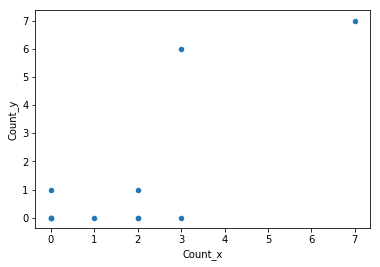

In [443]:
mg.plot.scatter(x='Count_x', y='Count_y')

In [444]:
pc50,pv50 = pearsonr(mg.Count_x,mg.Count_y)
print(pc50,pv50)

0.7743486157335886 0.005144488479938087


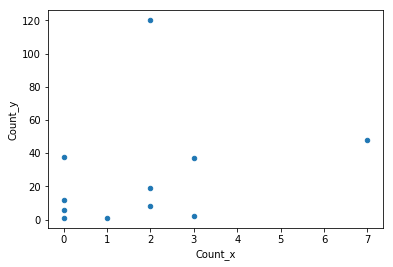

In [445]:
mg1.plot.scatter(x='Count_x', y='Count_y')

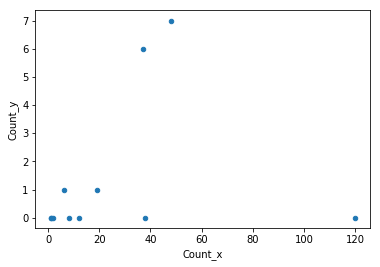

In [446]:
mg2.plot.scatter(x='Count_x', y='Count_y')

In [447]:
pc49,pv49 = pearsonr(mg2.Count_x,mg2.Count_y)
print(pc49,pv49)

0.2036491421242955 0.5481003125986665


County Self Comparisons bw Two Periods

In [448]:
mg3 = pd.merge(temp1_sf07,temp1_sf11, how='left',on=['Disease'])
mg4 = pd.merge(temp1_la07,temp1_la11, how='left',on=['Disease'])
mg5 = pd.merge(temp1_stan07,temp1_stan11, how='left',on=['Disease'])
mg3

,Year_x,County_x,Disease,Count_x,Population_x,DClus_ID_x,Year_y,County_y,Count_y,Population_y,DClus_ID_y
0,2007,San Francisco,"Botulism, Wound",1,791334,3,2011,San Francisco,1,819897,3
1,2007,San Francisco,Creutzfeldt-Jakob Disease and other Transmissi...,0,791334,3,2011,San Francisco,0,819897,3
2,2007,San Francisco,Dengue,0,791334,3,2011,San Francisco,0,819897,3
3,2007,San Francisco,E. coli Other STEC (non-O157),0,791334,3,2011,San Francisco,7,819897,3
4,2007,San Francisco,Legionellosis,1,791334,3,2011,San Francisco,2,819897,3
5,2007,San Francisco,Lyme Disease,6,791334,3,2011,San Francisco,2,819897,3
6,2007,San Francisco,Scombroid Fish Poisoning,2,791334,3,2011,San Francisco,3,819897,3
7,2007,San Francisco,Shiga Toxin Positive Feces (without culture co...,3,791334,3,2011,San Francisco,2,819897,3
8,2007,San Francisco,Toxic Shock Syndrome (Non-Streptococcal),0,791334,3,2011,San Francisco,0,819897,3
9,2007,San Francisco,Typhus Fever,0,791334,3,2011,San Francisco,0,819897,3


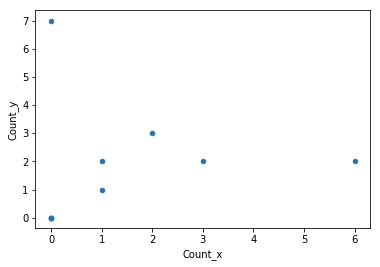

In [449]:
mg3.plot.scatter(x='Count_x', y='Count_y')

In [450]:
pc48,pv48 = pearsonr(mg3.Count_x,mg3.Count_y)
print(pc48,pv48)

0.12932361696966477 0.7217886113793759


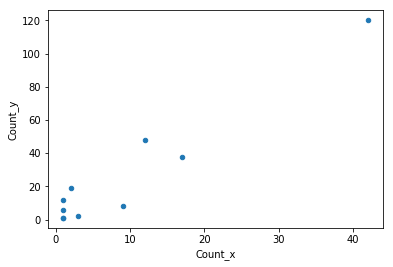

In [451]:
mg4.plot.scatter(x='Count_x', y='Count_y')

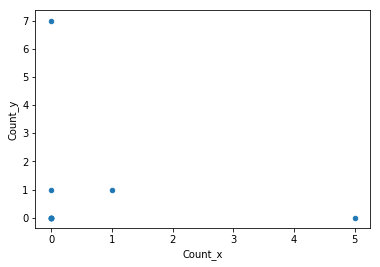

In [452]:
mg5.plot.scatter(x='Count_x', y='Count_y')

Two County Comparisons, Two Different Periods

In [453]:
mg6 = pd.merge(temp1_sf07,temp1_la11, how='left',on=['Disease'])
mg7 = pd.merge(temp1_la07,temp1_sf11, how='left',on=['Disease'])
mg8 = pd.merge(temp1_stan07,temp1_la11, how='left',on=['Disease'])

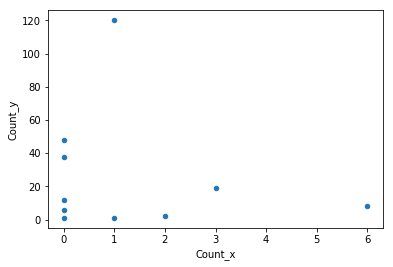

In [454]:
mg6.plot.scatter(x='Count_x', y='Count_y')

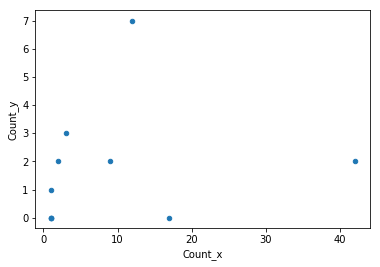

In [455]:
mg7.plot.scatter(x='Count_x', y='Count_y')

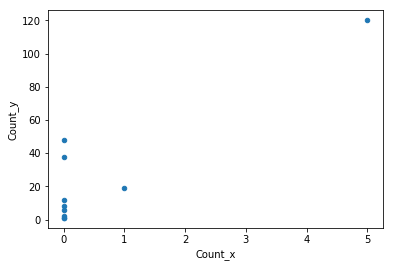

In [456]:
mg8.plot.scatter(x='Count_x', y='Count_y')

In [457]:
# scatmat = ever.iloc[:,59:]

In [458]:
# 2007, 2011
# further subset by: Dengue, Coccidioidomycosis, Q Fever
# (la,stan)(la,sf)(stan,sf)
# normCounty, piCounty; normCounty, urCounty
ever_up = ever.astype(float)
ever_up['Year'] = ever['Year'].astype(int)
# ever_up.dtypes.tolist() // good

In [459]:
ever_up.HumNormMean
# problem with Humpop and HumNormMean, something is missing   

0    0.000109
1    0.000001
2    0.000005
3    0.000000
4    0.000084
5    0.000001
6    0.000000
7    0.000006
8    0.000010
Name: HumNormMean, dtype: float64

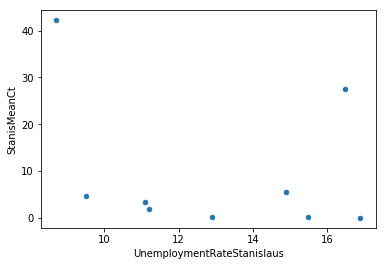

In [460]:
ever_up.plot.scatter(x='UnemploymentRateStanislaus', y='StanisMeanCt')

In [461]:
pc4,pv4 = pearsonr(ever_up['UnemploymentRateStanislaus'],ever_up['StanisMeanCt'])
print(pc4,pv4)
# reject null, no relation, of course not many data points 

-0.277212405841577 0.47019329885845357


In [462]:
# import seaborn as sns
# sns.pairplot(scatmat, hue= scatmat.columns, palette="husl")

In [463]:
# norm sum, and norm mean of all disease counts within cluster 3 by county labels  
scatmat1 = ever_up.iloc[:,233:]
cmat = scatmat1.corr()

In [464]:
from matplotlib import cm as cm

cmap = sns.diverging_palette(5, 250, as_cmap=True)

def magnify():
    return [dict(selector="th",
                 props=[("font-size", "7pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "12pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '200px'),
                        ('font-size', '12pt')])
]

cmat.style.background_gradient(cmap, axis=1)\
    .set_properties(**{'max-width': '80px', 'font-size': '10pt'})\
    .set_caption("Hover to magify")\
    .set_precision(2)\
    .set_table_styles(magnify())

In [465]:
# dcn

In [467]:
# zonemat

In [486]:
# dcn clustered over entire data set and all counties 
dcn.head()

,Year,County,Disease,Count,Population,DClus_ID
2438,2001,Alameda,Amebiasis,16,1465564,2
4508,2001,Alameda,Anaplasmosis and Ehrlichiosis,0,1465564,1
7700,2001,Alameda,Anthrax,0,1465564,999
9566,2001,Alameda,Babesiosis,0,1465564,1
10681,2001,Alameda,"Botulism, Foodborne",0,1465564,1


In [471]:
temp1 = dcn[dcn.DClus_ID == 3]
temp1_stan = temp1[temp1.County =='Stanislaus']
temp1_stan07 = temp1_stan[temp1_stan.Year == 2007]
temp1_stan11 = temp1_stan[temp1_stan.Year == 2011]

temp1_la = temp1[temp1.County =='Los Angeles']
temp1_la07 = temp1_la[temp1_la.Year == 2007]
temp1_la11 = temp1_la[temp1_la.Year == 2011]

temp1_sf = temp1[temp1.County =='San Francisco']
temp1_sf07 = temp1_sf[temp1_sf.Year == 2007]
temp1_sf11 = temp1_sf[temp1_sf.Year == 2011]
# 2007, 2011
# further subset by: Dengue, Coccidioidomycosis, Q Fever
# (la,stan)(la,sf)(stan,sf)

In [479]:
standen = temp1_stan[temp1_stan.Disease == 'Dengue']
laden = temp1_la[temp1_la.Disease == 'Dengue']
sfden = temp1_sf[temp1_sf.Disease == 'Dengue']

sfcocc = temp1_sf[temp1_sf.Disease == 'Coccidioidomycosis']
stancocc = temp1_stan[temp1_stan.Disease == 'Coccidioidomycosis']
lacocc = temp1_la[temp1_la.Disease == 'Coccidioidomycosis']

sfqfev = temp1_sf[temp1_sf.Disease == 'Q Fever']
stanqfev = temp1_stan[temp1_stan.Disease == 'Q Fever']
laqfev = temp1_la[temp1_la.Disease == 'Q Fever']

In [483]:
# 2 merges per disease

standen['CtNorm'] = standen['Count']/standen['Population']
sfden['CtNorm'] = sfden['Count']/sfden['Population']
laden['CtNorm'] = laden['Count']/laden['Population']
mg2geo = pd.merge(laden, sfden,how='left',on='Year')
mg3geo = pd.merge(mg2geo, standen,how='left',on='Year')
stancocc['CtNorm'] = stancocc['Count']/stancocc['Population']
lacocc['CtNorm'] = sfcocc['Count']/sfcocc['Population']
sfcocc['CtNorm'] = lacocc['Count']/lacocc['Population']

stanqfev['CtNorm'] = stanqfev['Count']/stanqfev['Population']
laqfev['CtNorm'] = laqfev['Count']/laqfev['Population']
sfqfev['CtNorm'] = sfqfev['Count']/sfqfev['Population']


from scipy import stats 
stats.ttest_ind(standen.CtNorm, sfden.CtNorm)

C:\Users\aufst\OneDrive\Music\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\aufst\OneDrive\Music\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
C:\Users\aufst\OneDrive\Music\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexe

Ttest_indResult(statistic=-2.1091971052894345, pvalue=0.043998438114991975)

In [484]:
stats.ttest_ind(standen.CtNorm, laden.CtNorm)

Ttest_indResult(statistic=-2.322440734106216, pvalue=0.02770079908179714)

In [485]:
stats.ttest_ind(laden.CtNorm, sfden.CtNorm)

Ttest_indResult(statistic=-0.7037529414991788, pvalue=0.48739830458439204)

In [488]:
# zonemat // disease profile, good for corr, and ttesting
# **remember** it's also good idea to do multi index correlation matrix 

In [491]:
stats.ttest_ind(scatmat1.UnemploymentRateStanislaus, scatmat1.StanisNormMean)

Ttest_indResult(statistic=12.766290830476237, pvalue=8.349341559379307e-10)

In [492]:
stats.ttest_ind(scatmat1.UnemploymentRateStanislaus, scatmat1.SfNormMean)

Ttest_indResult(statistic=12.766269656676617, pvalue=8.349544412670459e-10)

In [494]:
stats.ttest_ind(scatmat1['UnemploymentRateSan Francisco'], scatmat1['SfNormMean'])

Ttest_indResult(statistic=9.136439478656257, pvalue=9.504336131170734e-08)

In [495]:
stats.ttest_ind(scatmat1['PersonalIncomeSan Francisco'], scatmat1['SfNormMean'])

Ttest_indResult(statistic=16.868313966766273, pvalue=1.2982908868655083e-11)

In [496]:
stats.ttest_ind(scatmat1['UnemploymentRateLos Angeles'], scatmat1['SfNormMean'])

Ttest_indResult(statistic=10.708386225399328, pvalue=1.051274258309684e-08)

In [497]:
stats.ttest_ind(scatmat1['UnemploymentRateLos Angeles'], scatmat1['LaNormMean'])

Ttest_indResult(statistic=10.708408614549239, pvalue=1.051243160676399e-08)

In [498]:
stats.ttest_ind(scatmat1['UnemploymentRateStanislaus'], scatmat1['SfNormMean'])

Ttest_indResult(statistic=12.766269656676617, pvalue=8.349544412670459e-10)

In [ ]:
stats.ttest_ind(scatmat1['UnemploymentRateStanislaus'], scatmat1['SfNormMean'])

In [500]:
stats.ttest_ind(scatmat1['UnemploymentRateStanislaus'], scatmat1['StanisNormMean'])

Ttest_indResult(statistic=12.766290830476237, pvalue=8.349341559379307e-10)

In [529]:
dcnpi = pd.merge(dcn,pincM, how='left', on=['Year','County'])

In [531]:
dcnpi.head()

,Year,County,Disease,Count,Population,DClus_ID,Personal_Income
0,2001,Alameda,Amebiasis,16,1465564,2,57937010
1,2001,Alameda,Anaplasmosis and Ehrlichiosis,0,1465564,1,57937010
2,2001,Alameda,Anthrax,0,1465564,999,57937010
3,2001,Alameda,Babesiosis,0,1465564,1,57937010
4,2001,Alameda,"Botulism, Foodborne",0,1465564,1,57937010


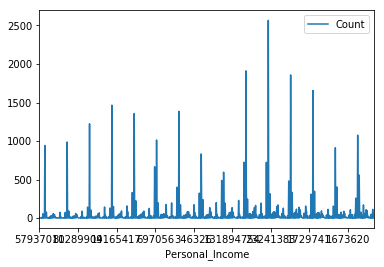

In [534]:
cocc = dcnpi[dcnpi.Disease == 'Coccidioidomycosis']
cocc.plot(x='Personal_Income',y='Count')

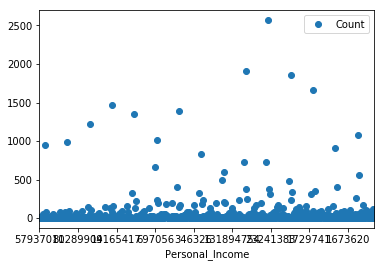

In [539]:
cocc.plot(x='Personal_Income', y='Count',style='o')

***IMPORTANT ERROR***

In [549]:
# cocc
# cocc.plot(x='Count', y='Personal_Income',style='o')
# ***EMPTY DATA FRAME ERROR***

In [551]:
cocc.head()

,Year,County,Disease,Count,Population,DClus_ID,Personal_Income
11,2001,Alameda,Coccidioidomycosis,8,1465564,1,57937010
58,2001,Alpine,Coccidioidomycosis,0,1237,1,41395
105,2001,Amador,Coccidioidomycosis,0,35784,1,956884
152,2001,Butte,Coccidioidomycosis,0,205730,1,5167986
199,2001,Calaveras,Coccidioidomycosis,0,41428,1,1167747


In [570]:
cocc['Personal_Income'] = cocc['Personal_Income'].astype(int)

C:\Users\aufst\OneDrive\Music\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [575]:
# cocc2 = pd.merge(cocc,nerva3,how='left', on=['County','Year','Disease','Population','Personal_Income','Count']).drop_duplicates()
#
# cocc.info()

In [582]:
nerva3['UnemploymentRate'] = nerva3['UnemploymentRate'].astype(float)
nerva3['Personal_Income'] = nerva3['Personal_Income'].astype(int)

# cocc1 = pd.merge(cocc,nerva3,how='left', on=['County','Year','Disease','Population','Personal_Income','Count']).drop_duplicates()

C:\Users\aufst\OneDrive\Music\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
C:\Users\aufst\OneDrive\Music\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [591]:
cocc['Personal_Income'] = cocc['Personal_Income'].astype(int)
cocc1 = pd.merge(cocc,nerva3,how='left', on=['County','Year','Disease','Population','Personal_Income','Count']).drop_duplicates()
cocc2 = cocc1.dropna()

C:\Users\aufst\OneDrive\Music\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [593]:
cocc2.head()

,Year,County,Disease,Count,Population,DClus_ID,Personal_Income,UnemploymentRate
348,2007,Alameda,Coccidioidomycosis,25,1476401,1,70450120,4.7
349,2007,Alpine,Coccidioidomycosis,0,1248,1,45802,7.9
350,2007,Amador,Coccidioidomycosis,2,38085,1,1289844,5.8
351,2007,Butte,Coccidioidomycosis,5,217115,1,6859094,6.7
352,2007,Calaveras,Coccidioidomycosis,0,45638,1,1648560,6.4


Relationship bw Disease Frequency of Coccidioidomycosis	and Unemployment Rate Over Time for All CA Counties 

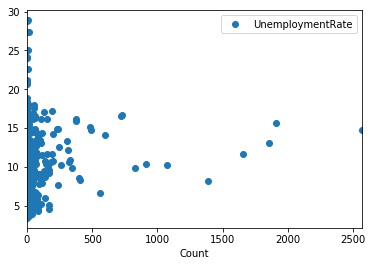

In [596]:
cocc2.plot(x='Count', y='UnemploymentRate',style='o')

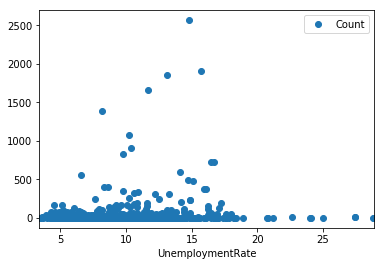

In [597]:
cocc2.plot(x='UnemploymentRate', y='Count',style='o')